In [172]:
import pandas as pd
import numpy as np
import re
from pathlib import Path
import json
from sklearn.metrics import classification_report
from sklearn.metrics import plot_confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
from joblib import dump, load
from collections import Counter
from gensim.test.utils import common_texts
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
from nltk.tokenize import word_tokenize
import gensim
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB
import pandas as pd
from sklearn.linear_model import SGDClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score

In [127]:
import json
from collections import defaultdict
from tqdm import tqdm
import numpy as np

filename = 'yelp_academic_dataset_review.json'
target_user_ids = dict()
target_item_ids = dict()
reviews = []
i = 0
with open(filename, 'rt') as f:
        for line in tqdm(f):
            data = json.loads(line)

            reviews.append({
                key: data[key]
                for key in ['user_id', 'stars', "text"]
            })
            target_user_ids[data['user_id']] = True
            target_item_ids[data['business_id']] = True
            i+=1
            if i == 200000:
                break
                
review_df = pd.DataFrame(reviews)
review_df["stars"] = review_df["stars"].astype(np.int32)
del reviews

199999it [00:01, 146004.38it/s]


In [128]:
data = pd.read_csv (r'yelp_balanced.csv', index_col = None)
data.drop(['Unnamed: 0', "useful", "funny", "cool", 'business_id','review_id'], axis = 1, inplace = True)

In [129]:
def infer(model, text):
    return model.infer_vector(text)

# Function to map stars to sentiment
def map_sentiment(stars_received):
    if stars_received <= 2:
        return -1
    elif stars_received == 3:
        return 0
    else:
        return 1

In [130]:
bigger_data = pd.concat([data, review_df]).drop(["date"], axis = 1)
bigger_data['sentiment'] = [ map_sentiment(x) for x in bigger_data['stars']]

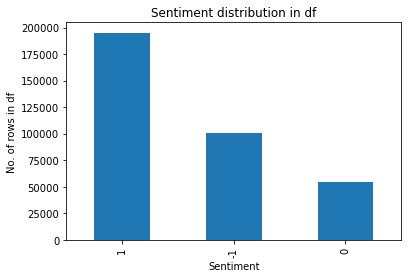

In [131]:
plt.figure()
pd.value_counts(bigger_data['sentiment']).plot.bar(title="Sentiment distribution in df")
plt.xlabel("Sentiment")
plt.ylabel("No. of rows in df")
plt.show()

In [132]:
def get_top_data(top_n = 5000, data_df = bigger_data):
    top_data_df_positive = data_df[data_df['sentiment'] == 1].head(top_n)
    top_data_df_negative = data_df[data_df['sentiment'] == -1].head(top_n)
    top_data_df_neutral = data_df[data_df['sentiment'] == 0].head(top_n)
    top_data_df_small = pd.concat([top_data_df_positive, top_data_df_negative, top_data_df_neutral])
    return top_data_df_small

# Function call to get the top 10000 from each sentiment
top_data_df_small = get_top_data(top_n=50000, data_df = bigger_data)

# After selecting top few samples of each sentiment
print("After segregating and taking equal number of rows for each sentiment:")
print(top_data_df_small['sentiment'].value_counts())
top_data_df_small.head(10000)

After segregating and taking equal number of rows for each sentiment:
 1    50000
-1    50000
 0    50000
Name: sentiment, dtype: int64


,user_id,stars,text,sentiment
0,r0GLQAawvHXUd-xZow-fWQ,4,"Food is tasty, it's usually busy, but there al...",1
2,mus1d8cMxuEJmP0zfV19hg,4,I was looking for a place to grab a quick bite...,1
4,cYvO88wNlRc_gd03caBZ7Q,4,I've heard so much about this place.. and I mu...,1
5,nzJj5Egy2LgjYlSuOTgqFg,5,Stopped in after trip to mall. Very prompt s...,1
7,oSBMTgBvaLzA9RxzOlt6Fg,4,I've had this place bookmarked for awhile but ...,1
...,...,...,...,...
25272,GQ8l3o7-_jL0WNHUkNlhJA,4,"If you love Peking duck, you should definitely...",1
25274,kacPIgDNzLcOSs-ok3bSEA,5,Of all the moving companies I have called to d...,1
25275,fX5BEt7c_306zlppgr4KPw,5,This is our favourite spot in the neighbourhoo...,1
25280,E2k3S19RN3219kvz_3y1EQ,5,This bike shop is without a doubt highest exam...,1


In [133]:
from gensim.utils import simple_preprocess
# Tokenize the text column to get the new column 'tokenized_text'
top_data_df_small['tokenized_text'] = [simple_preprocess(line, deacc=True) for line in top_data_df_small['text']] 
print(top_data_df_small['tokenized_text'].head(10))

0     [food, is, tasty, it, usually, busy, but, ther...
2     [was, looking, for, place, to, grab, quick, bi...
4     [ve, heard, so, much, about, this, place, and,...
5     [stopped, in, after, trip, to, mall, very, pro...
7     [ve, had, this, place, bookmarked, for, awhile...
9     [sonoran, smile, is, incredible, they, have, o...
10    [resume, excellent, service, enormes, plats, p...
15    [on, the, way, back, from, roadtrip, to, the, ...
17    [this, place, is, an, amazing, asian, fusion, ...
21    [the, service, is, pretty, good, the, environm...
Name: tokenized_text, dtype: object


In [134]:
from gensim.parsing.porter import PorterStemmer
porter_stemmer = PorterStemmer()
# Get the stemmed_tokens
top_data_df_small['stemmed_tokens'] = [[porter_stemmer.stem(word) for word in tokens] for tokens in top_data_df_small['tokenized_text'] ]
top_data_df_small['stemmed_tokens'].head(10)

0     [food, is, tasti, it, usual, busi, but, there,...
2     [wa, look, for, place, to, grab, quick, bite, ...
4     [ve, heard, so, much, about, thi, place, and, ...
5     [stop, in, after, trip, to, mall, veri, prompt...
7     [ve, had, thi, place, bookmark, for, awhil, bu...
9     [sonoran, smile, is, incred, thei, have, offic...
10    [resum, excel, servic, enorm, plat, partag, ab...
15    [on, the, wai, back, from, roadtrip, to, the, ...
17    [thi, place, is, an, amaz, asian, fusion, rest...
21    [the, servic, is, pretti, good, the, environ, ...
Name: stemmed_tokens, dtype: object

In [221]:
from sklearn.model_selection import train_test_split
# Train Test Split Function
def split_train_test(top_data_df_small, test_size=0.3, shuffle_state=True):
    X_train, X_test, Y_train, Y_test = train_test_split(top_data_df_small[['stars', 'text', 'stemmed_tokens']], 
                                                        top_data_df_small[['sentiment', 'stars']], 
                                                        shuffle=shuffle_state,
                                                        test_size=test_size, 
                                                        random_state=15)
    print("Value counts for Train sentiments")
    print(Y_train.value_counts())
    print("Value counts for Test sentiments")
    print(Y_test.value_counts())
    print(type(X_train))
    print(type(Y_train))
    X_train.reset_index(drop=True, inplace=True)
    X_test.reset_index(drop=True, inplace=True)
    Y_train.reset_index(drop=True, inplace=True)
    Y_test.reset_index(drop=True, inplace=True)
    return X_train, X_test, Y_train, Y_test

# Call the train_test_split
X_train, X_test, Y_train, Y_test = split_train_test(top_data_df_small)

Value counts for Train sentiments
sentiment  stars
 0         3        35084
 1         4        17536
-1         2        17523
           1        17439
 1         5        17418
dtype: int64
Value counts for Test sentiments
sentiment  stars
 0         3        14916
 1         5         7551
-1         2         7523
           1         7515
 1         4         7495
dtype: int64
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>


In [136]:
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
# TaggedDocuments are tuple of stemmed_tokens and class lable, example is printed (scroll to the right to see label)
documents = [TaggedDocument(doc, [i]) for i, doc in enumerate(top_data_df_small['stemmed_tokens'])]

# Initialize the model
doc2vec_model = Doc2Vec(documents, vector_size=1000, window=3, min_count=1, workers=4)

In [137]:
# Sample vector for the stemmed tokens
vector = doc2vec_model.infer_vector(top_data_df_small['stemmed_tokens'][0])
# Printing sample vector
print(len(vector))
print("Top 10 values in Doc2Vec inferred vector:")
print(vector[:10])

1000
Top 10 values in Doc2Vec inferred vector:
[-0.13529791  0.10064095 -0.03628859  0.00645718  0.00357347  0.07188983
  0.02216548 -0.03353726  0.01176187  0.07416339]


In [138]:
x_train = []
for index, row in X_train.iterrows():
    model_vector = doc2vec_model.infer_vector(row['stemmed_tokens'])
    x_train.append(model_vector)
x_train = np.array(x_train)

In [223]:
clf2 = LogisticRegression(random_state=0,
                         max_iter = 150,
                         solver = "saga",
                        penalty = "elasticnet",
                        l1_ratio = .5).fit(x_train, Y_train["stars"])

y_test_ = clf2.predict(x_test)
print(classification_report(Y_test['stars'],y_test_))

              precision    recall  f1-score   support

           1       0.63      0.58      0.60      7515
           2       0.44      0.20      0.27      7523
           3       0.48      0.76      0.59     14916
           4       0.43      0.22      0.29      7495
           5       0.59      0.57      0.58      7551

    accuracy                           0.51     45000
   macro avg       0.51      0.46      0.47     45000
weighted avg       0.51      0.51      0.49     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


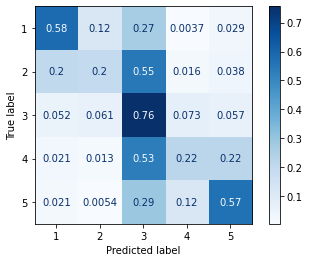

In [253]:
plot_confusion_matrix(clf2, x_test, Y_test["stars"], cmap=plt.cm.Blues, normalize='true')

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.


-- Epoch 1-- Epoch 1

-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 4.78, NNZs: 1000, Bias: -1.166313, T: 94500, Avg. loss: 0.314427
Total training time: 0.23 seconds.
Norm: 0.86, NNZs: 1000, Bias: -1.033620, T: 94500, Avg. loss: 0.338597
Total training time: 0.23 seconds.
Norm: 0.72, NNZs: 1000, Bias: -1.047641, T: 94500, Avg. loss: 0.344659
Total training time: 0.22 seconds.
-- Epoch 2
-- Epoch 2Norm: 0.90, NNZs: 1000, Bias: -1.019121, T: 94500, Avg. loss: 0.629390

Total training time: 0.35 seconds.
-- Epoch 2
Norm: 4.59, NNZs: 1000, Bias: -1.320280, T: 94500, Avg. loss: 0.294555
Total training time: 0.39 seconds.
-- Epoch 2
Norm: 4.33, NNZs: 1000, Bias: -1.170134, T: 189000, Avg. loss: 0.294281
Total training time: 0.85 seconds.
-- Epoch 2
Norm: 0.46, NNZs: 1000, Bias: -1.018937, T: 189000, Avg. loss: 0.306347
Total training time: 0.94 seconds.
Norm: 0.45, NNZs: 1000, Bias: -0.998894, T: 189000, Avg. loss: 0.306882
Total training time: 0.89 seconds.
-- Epoch 3
Norm: 0.48, NNZs: 1000, Bias

[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    5.3s finished


              precision    recall  f1-score   support

           1       0.47      0.80      0.59      7515
           2       0.30      0.14      0.19      7523
           3       0.60      0.33      0.42     14916
           4       0.26      0.21      0.23      7495
           5       0.42      0.80      0.55      7551

    accuracy                           0.43     45000
   macro avg       0.41      0.46      0.40     45000
weighted avg       0.44      0.43      0.40     45000



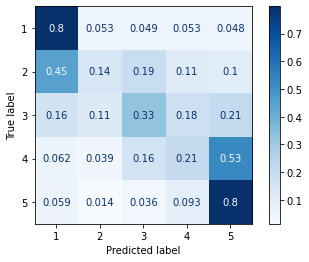

In [252]:
sgd = SGDClassifier(loss='hinge',
              penalty='l2',
              alpha=.001,
              max_iter=1000, 
              tol=1e-4,
              shuffle=True,
              verbose=1,
              n_jobs=-1,
              random_state=1,
              learning_rate='optimal',
              early_stopping=True,
              class_weight='balanced').fit(x_train, Y_train["stars"])
y_test_ = sgd.predict(x_test)
print(classification_report(Y_test['stars'], y_test_))
plot_confusion_matrix(sgd, x_test, Y_test["stars"], cmap=plt.cm.Blues, normalize='true')

0        3
1        3
2        5
3        1
4        3
        ..
44995    1
44996    3
44997    3
44998    3
44999    2
Name: stars, Length: 45000, dtype: int64

In [228]:
y_train = Y_train["stars"]
y_train = y_train.values

In [140]:
from sklearn.metrics import classification_report
test_features_doc2vec = []
x_test = []
for index, row in X_test.iterrows():
    model_vector = doc2vec_model.infer_vector(row['stemmed_tokens'])
    x_test.append(model_vector)

In [141]:
clf = LogisticRegression(random_state=0,
                         max_iter = 150,
                         solver = "saga",
                        penalty = "elasticnet",
                        l1_ratio = .5).fit(x_train, y_train)
clf = clf.fit(x_train, y_train)

y_test = clf.predict(x_test)
print(classification_report(Y_test['sentiment'],y_test))

/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


              precision    recall  f1-score   support

          -1       0.73      0.70      0.71     15038
           0       0.56      0.57      0.57     14916
           1       0.71      0.73      0.72     15046

    accuracy                           0.67     45000
   macro avg       0.67      0.67      0.67     45000
weighted avg       0.67      0.67      0.67     45000



In [144]:
clf_decision_doc2vec = DecisionTreeClassifier()
clf_decision_doc2vec = clf_decision_doc2vec.fit(x_train, y_train)

y_test = clf_decision_doc2vec.predict(x_test)
print(classification_report(Y_test['sentiment'],y_test))

              precision    recall  f1-score   support

          -1       0.48      0.47      0.48     15038
           0       0.39      0.40      0.39     14916
           1       0.47      0.47      0.47     15046

    accuracy                           0.45     45000
   macro avg       0.45      0.45      0.45     45000
weighted avg       0.45      0.45      0.45     45000



In [145]:
def clean_text(df, text_field, new_text_field_name):
    df[new_text_field_name] = df[text_field].str.lower()
    df[new_text_field_name] = df[new_text_field_name].apply(lambda elem: re.sub(r"(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)|^rt|http.+?", "", elem))  
    df[new_text_field_name] = df[new_text_field_name].apply(lambda elem: re.sub(r"\d+", "", elem))
    return df

edges = pd.read_csv("example_sentences.csv")
edges = clean_text(edges, 'text', 'text_clean')

In [146]:
def stem_and_infer(text, model = doc2vec_model, stemmer = porter_stemmer):
    text = simple_preprocess(text)
    stemmed = [stemmer.stem(i) for i in text]
    return model.infer_vector(stemmed)

In [229]:
def extract_features(df_extra):
    x_contra = df_extra.loc[:, 'text_clean'][df_extra['contradictory'] == 1].values.astype('U')
    x_contra = [stem_and_infer(i) for i in x_contra]
    y_contra = df_extra.loc[:, 'stars'][df_extra['contradictory'] == 1].tolist()
    
    x_figurative = df_extra.loc[:, 'text_clean'][df_extra['figurative'] == 1].values.astype('U')
    x_figurative = [stem_and_infer(i) for i in x_figurative]
    y_figurative = df_extra.loc[:, 'stars'][df_extra['figurative'] == 1].tolist()
    
    x_qual = df_extra.loc[:, 'text_clean'][df_extra['qualifier'] == 1].values.astype('U')
    x_qual = [stem_and_infer(i) for i in x_qual]
    y_qual = df_extra.loc[:, 'stars'][df_extra['qualifier'] == 1].tolist()
    
    return x_contra, x_figurative, x_qual, y_contra, y_figurative, y_qual


def extract_features_word_removal_sent_tokenize(df_extra):
    df_extra["text_clean"] = df_extra["text"][:]
    import random
    for ix, review in enumerate(df_extra["text_clean"].values):
        r = sent_tokenize(review)
        for i in range(0, len(r)//5): #20 % of words
            r.pop(random.randrange(len(r)))
        df_extra["text_clean"].values[ix] = " ".join(r)
    df_extra = clean_text(df_extra, 'text_clean', 'text_clean')

    x_contra = df_extra.loc[:, 'text_clean'][df_extra['contradictory'] == 1].values.astype('U')
    x_contra = [stem_and_infer(i) for i in x_contra]
    y_contra = df_extra.loc[:, 'stars'][df_extra['contradictory'] == 1].tolist()
    
    x_figurative = df_extra.loc[:, 'text_clean'][df_extra['figurative'] == 1].values.astype('U')
    x_figurative = [stem_and_infer(i) for i in x_figurative]
    y_figurative = df_extra.loc[:, 'stars'][df_extra['figurative'] == 1].tolist()
    
    x_qual = df_extra.loc[:, 'text_clean'][df_extra['qualifier'] == 1].values.astype('U')
    x_qual = [stem_and_infer(i) for i in x_qual]
    y_qual = df_extra.loc[:, 'stars'][df_extra['qualifier'] == 1].tolist()
    
    return x_contra, x_figurative, x_qual, y_contra, y_figurative, y_qual


def extract_features_word_removal(df_extra):
    import random
    for ix, review in enumerate(df_extra["text_clean"].values):
        r = review.split()
        for i in range(0, len(r)//5): #20 % of words
            r.pop(random.randrange(len(r)))
        df_extra["text_clean"].values[ix] = " ".join(r)
    
    x_contra = df_extra.loc[:, 'text_clean'][df_extra['contradictory'] == 1].values.astype('U')
    x_contra = [stem_and_infer(i) for i in x_contra]
    y_contra = df_extra.loc[:, 'stars'][df_extra['contradictory'] == 1].tolist()
    
    x_figurative = df_extra.loc[:, 'text_clean'][df_extra['figurative'] == 1].values.astype('U')
    x_figurative = [stem_and_infer(i) for i in x_figurative]
    y_figurative = df_extra.loc[:, 'stars'][df_extra['figurative'] == 1].tolist()
    
    x_qual = df_extra.loc[:, 'text_clean'][df_extra['qualifier'] == 1].values.astype('U')
    x_qual = [stem_and_infer(i) for i in x_qual]
    y_qual = df_extra.loc[:, 'stars'][df_extra['qualifier'] == 1].tolist()
    
    return x_contra, x_figurative, x_qual, y_contra, y_figurative, y_qual


In [192]:
from nltk.tokenize import sent_tokenize

Contradictory Set
Accuracy: 0.2524271844660194

              precision    recall  f1-score   support

           1     0.1786    0.5000    0.2632        10
           2     0.4167    0.1250    0.1923        40
           3     0.5000    0.2564    0.3390        39
           4     0.1250    0.2222    0.1600         9
           5     0.1481    0.8000    0.2500         5

    accuracy                         0.2524       103
   macro avg     0.2737    0.3807    0.2409       103
weighted avg     0.3866    0.2524    0.2547       103



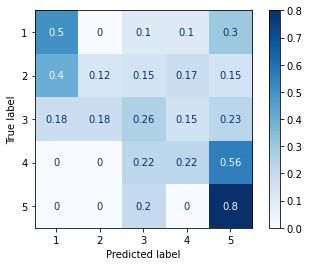

Figurative Set
Accuracy: 0.42592592592592593

              precision    recall  f1-score   support

           1     0.2857    0.6667    0.4000         6
           2     0.5000    0.1176    0.1905        17
           3     0.7143    0.5263    0.6061        19
           4     0.2857    0.3333    0.3077         6
           5     0.3333    0.8333    0.4762         6

    accuracy                         0.4259        54
   macro avg     0.4238    0.4955    0.3961        54
weighted avg     0.5093    0.4259    0.4048        54



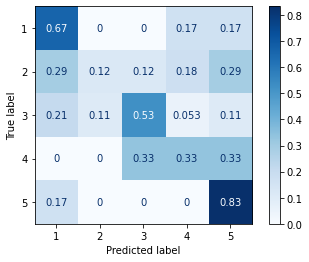

Qualifiers Set
Accuracy: 0.40540540540540543

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.6000    0.2000    0.3000        15
           3     0.7692    0.5556    0.6452        18
           4     0.1667    1.0000    0.2857         1
           5     0.1429    0.5000    0.2222         2

    accuracy                         0.4054        37
   macro avg     0.3358    0.4511    0.2906        37
weighted avg     0.6297    0.4054    0.4552        37



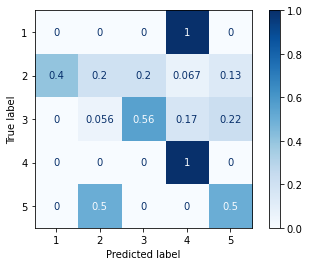

(1, 1, 0.2524271844660194, 0.42592592592592593, 0.40540540540540543)

In [254]:
#Original
def evaluate_model_Xy(model, X, y, y_pred=None, label="Training", model_name="model"):
    if y_pred is None:
        y_pred = model.predict(X)
    print(label + ' Set')
    print("Accuracy:", accuracy_score(y, y_pred))
    print()

    print(classification_report(y, y_pred, digits=4))

    disp = plot_confusion_matrix(model, X, y, 
                               cmap=plt.cm.Blues, normalize='true')
    plt.show()
    return accuracy_score(y, y_pred)
    
def evaluate_model(model, model_name="model",
                   y_train_pred=None, y_dev_pred=None, y_test_pred=None):
    #mod_training = evaluate_model_Xy(model, x_train, y_train, label="Training", model_name=model_name)
    #mod_test = evaluate_model_Xy(model, x_test, Y_test['sentiment'], label="Testing", model_name=model_name)
    mod_training = mod_test = 1
    mod_contradict = evaluate_model_Xy(model, x_contra, y_contra, label="Contradictory", model_name=model_name)
    mod_figurative = evaluate_model_Xy(model, x_figurative, y_figurative, label="Figurative", model_name=model_name)
    mod_qual = evaluate_model_Xy(model, x_qual, y_qual, label="Qualifiers", model_name=model_name)

    return (mod_training, mod_test, mod_contradict, mod_figurative, mod_qual)

edges = pd.read_csv("example_sentences.csv")
edges = clean_text(edges, 'text', 'text_clean')
x_contra, x_figurative, x_qual, y_contra, y_figurative, y_qual = extract_features(edges)
evaluate_model(sgd, "doc2vec model")

In [ ]:
x_contra, x_figurative, x_qual, y_contra, y_figurative, y_qual = extract_features(edges)
evaluate_model(sgd, "doc2vec model")

In [189]:
sgd = SGDClassifier(loss='hinge',
              penalty='l2',
              alpha=.0001,
              max_iter=1000, 
              tol=1e-4,
              shuffle=True,
              verbose=1,
              n_jobs=-1,
              random_state=1,
              learning_rate='optimal',
              early_stopping=True,
              class_weight='balanced').fit(x_train, y_train)

print(classification_report(Y_test['sentiment'],y_test))

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 14.39, NNZs: 1000, Bias: -0.980751, T: 94500, Avg. loss: 0.642237
Total training time: 0.19 seconds.
Norm: 12.02, NNZs: 1000, Bias: -0.751725, T: 94500, Avg. loss: 0.879592
Total training time: 0.21 seconds.
Norm: 16.79, NNZs: 1000, Bias: -0.371211, T: 94500, Avg. loss: 0.638785
Total training time: 0.21 seconds.
-- Epoch 2
-- Epoch 2
-- Epoch 2
Norm: 12.84, NNZs: 1000, Bias: -1.175419, T: 189000, Avg. loss: 0.452421
Total training time: 0.63 seconds.
Norm: 15.00, NNZs: 1000, Bias: -1.039062, T: 189000, Avg. loss: 0.460907
Total training time: 0.70 seconds.
-- Epoch 3
Norm: 9.80, NNZs: 1000, Bias: -0.700181, T: 189000, Avg. loss: 0.627653
Total training time: 0.78 seconds.
-- Epoch 3
-- Epoch 3
Norm: 12.11, NNZs: 1000, Bias: -0.860064, T: 283500, Avg. loss: 0.439099
Total training time: 1.11 seconds.
-- Epoch 4
Norm: 14.48, NNZs: 1000, Bias: -0.954396, T: 283500, Avg. loss: 0.449495
Total training time: 1.21 seconds.
Norm: 9.58, NNZs: 1000, Bias: 

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    3.2s finished


Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



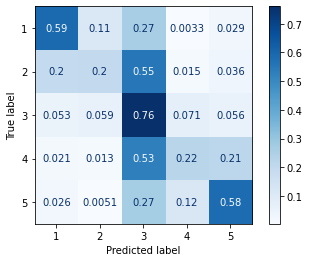

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

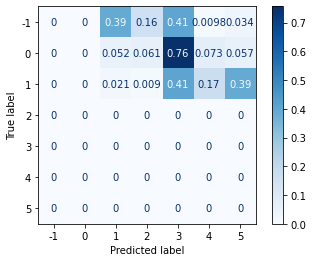

Contradictory Set
Accuracy: 0.4368932038834951

              precision    recall  f1-score   support

           1     0.2500    0.3000    0.2727        10
           2     0.8462    0.2750    0.4151        40
           3     0.4179    0.7179    0.5283        39
           4     0.2000    0.1111    0.1429         9
           5     0.3333    0.4000    0.3636         5

    accuracy                         0.4369       103
   macro avg     0.4095    0.3608    0.3445       103
weighted avg     0.5448    0.4369    0.4179       103



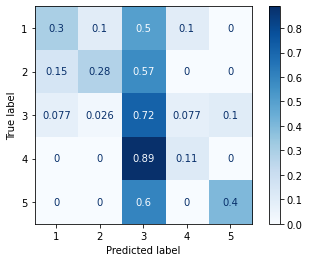

Figurative Set
Accuracy: 0.48148148148148145

              precision    recall  f1-score   support

           1     0.3636    0.6667    0.4706         6
           2     0.8333    0.2941    0.4348        17
           3     0.5000    0.7895    0.6122        19
           4     0.0000    0.0000    0.0000         6
           5     0.5000    0.3333    0.4000         6

    accuracy                         0.4815        54
   macro avg     0.4394    0.4167    0.3835        54
weighted avg     0.5342    0.4815    0.4490        54



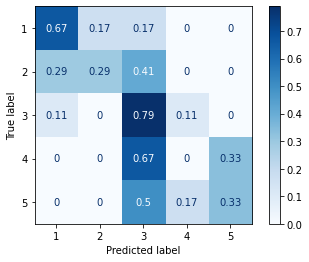

Qualifiers Set
Accuracy: 0.4594594594594595

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.5000    0.2000    0.2857        15
           3     0.5185    0.7778    0.6222        18
           4     0.0000    0.0000    0.0000         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.4595        37
   macro avg     0.2037    0.1956    0.1816        37
weighted avg     0.4550    0.4595    0.4185        37



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

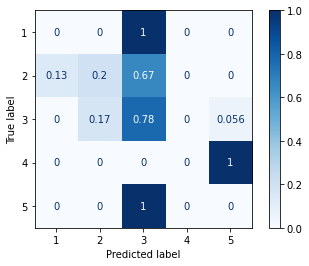

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



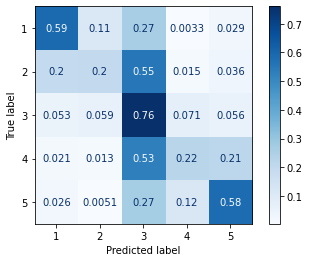

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

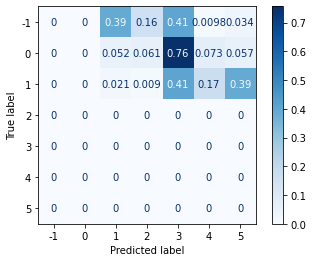

Contradictory Set
Accuracy: 0.4077669902912621

              precision    recall  f1-score   support

           1     0.2500    0.3000    0.2727        10
           2     0.7500    0.2250    0.3462        40
           3     0.4030    0.6923    0.5094        39
           4     0.2000    0.1111    0.1429         9
           5     0.2857    0.4000    0.3333         5

    accuracy                         0.4078       103
   macro avg     0.3777    0.3457    0.3209       103
weighted avg     0.4995    0.4078    0.3825       103



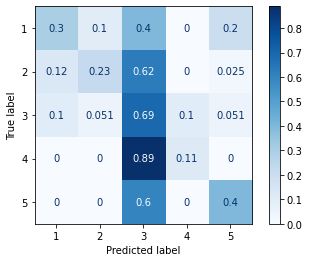

Figurative Set
Accuracy: 0.3888888888888889

              precision    recall  f1-score   support

           1     0.3000    0.5000    0.3750         6
           2     0.7500    0.1765    0.2857        17
           3     0.4138    0.6316    0.5000        19
           4     0.0000    0.0000    0.0000         6
           5     0.4286    0.5000    0.4615         6

    accuracy                         0.3889        54
   macro avg     0.3785    0.3616    0.3245        54
weighted avg     0.4627    0.3889    0.3588        54



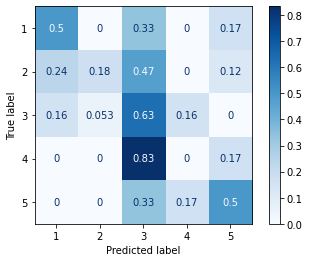

Qualifiers Set
Accuracy: 0.35135135135135137

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.0000    0.0000    0.0000        15
           3     0.4643    0.7222    0.5652        18
           4     0.0000    0.0000    0.0000         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.3514        37
   macro avg     0.0929    0.1444    0.1130        37
weighted avg     0.2259    0.3514    0.2750        37



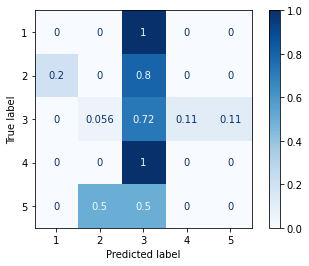

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



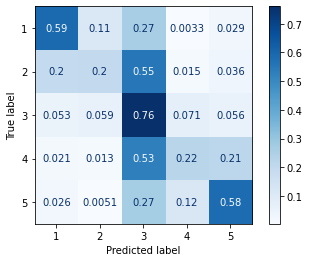

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

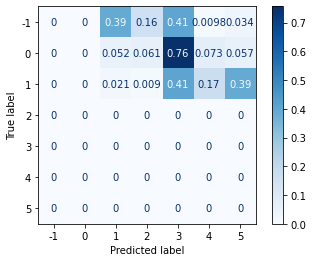

Contradictory Set
Accuracy: 0.34951456310679613

              precision    recall  f1-score   support

           1     0.2000    0.3000    0.2400        10
           2     0.6250    0.1250    0.2083        40
           3     0.3662    0.6667    0.4727        39
           4     0.0000    0.0000    0.0000         9
           5     0.2500    0.4000    0.3077         5

    accuracy                         0.3495       103
   macro avg     0.2882    0.2983    0.2458       103
weighted avg     0.4129    0.3495    0.2981       103



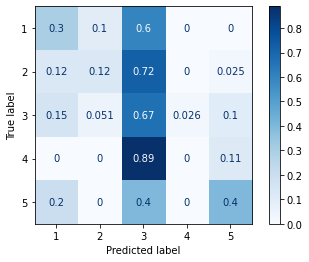

Figurative Set
Accuracy: 0.46296296296296297

              precision    recall  f1-score   support

           1     0.2500    0.3333    0.2857         6
           2     0.8333    0.2941    0.4348        17
           3     0.4643    0.6842    0.5532        19
           4     0.0000    0.0000    0.0000         6
           5     0.5556    0.8333    0.6667         6

    accuracy                         0.4630        54
   macro avg     0.4206    0.4290    0.3881        54
weighted avg     0.5152    0.4630    0.4373        54



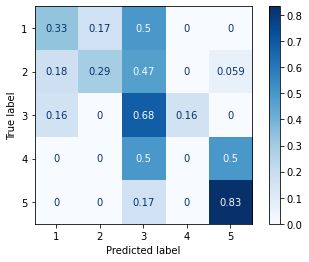

Qualifiers Set
Accuracy: 0.4864864864864865

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.6667    0.1333    0.2222        15
           3     0.5357    0.8333    0.6522        18
           4     0.5000    1.0000    0.6667         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.4865        37
   macro avg     0.3405    0.3933    0.3082        37
weighted avg     0.5444    0.4865    0.4254        37



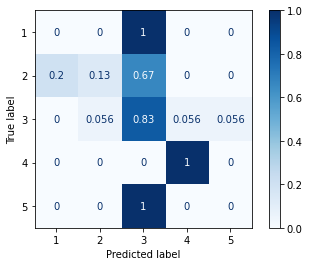

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



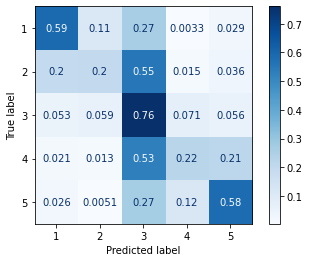

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

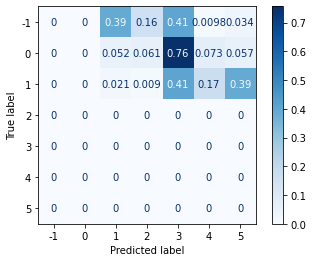

Contradictory Set
Accuracy: 0.42718446601941745

              precision    recall  f1-score   support

           1     0.2500    0.3000    0.2727        10
           2     0.9091    0.2500    0.3922        40
           3     0.3971    0.6923    0.5047        39
           4     0.2500    0.1111    0.1538         9
           5     0.3750    0.6000    0.4615         5

    accuracy                         0.4272       103
   macro avg     0.4362    0.3907    0.3570       103
weighted avg     0.5677    0.4272    0.4057       103



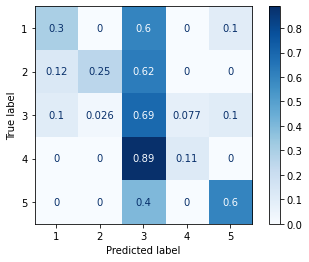

Figurative Set
Accuracy: 0.4444444444444444

              precision    recall  f1-score   support

           1     0.2000    0.3333    0.2500         6
           2     1.0000    0.2353    0.3810        17
           3     0.4483    0.6842    0.5417        19
           4     0.2000    0.1667    0.1818         6
           5     0.6667    0.6667    0.6667         6

    accuracy                         0.4444        54
   macro avg     0.5030    0.4172    0.4042        54
weighted avg     0.5911    0.4444    0.4326        54



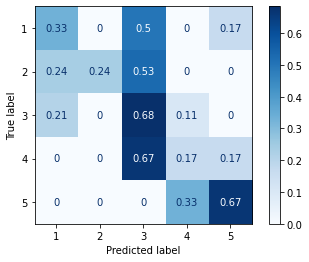

Qualifiers Set
Accuracy: 0.5675675675675675

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     1.0000    0.2000    0.3333        15
           3     0.5667    0.9444    0.7083        18
           4     0.5000    1.0000    0.6667         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.5676        37
   macro avg     0.4133    0.4289    0.3417        37
weighted avg     0.6946    0.5676    0.4977        37



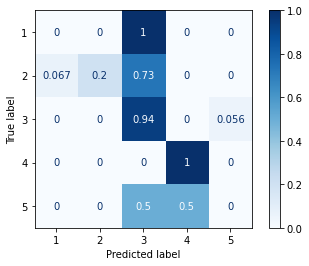

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



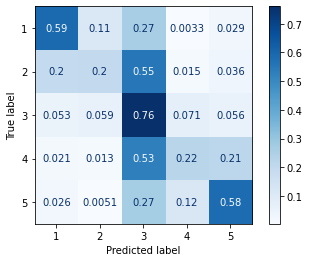

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

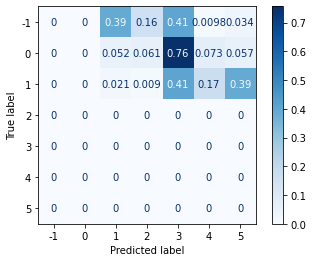

Contradictory Set
Accuracy: 0.4077669902912621

              precision    recall  f1-score   support

           1     0.2667    0.4000    0.3200        10
           2     0.9000    0.2250    0.3600        40
           3     0.3913    0.6923    0.5000        39
           4     0.0000    0.0000    0.0000         9
           5     0.3333    0.4000    0.3636         5

    accuracy                         0.4078       103
   macro avg     0.3783    0.3435    0.3087       103
weighted avg     0.5397    0.4078    0.3778       103



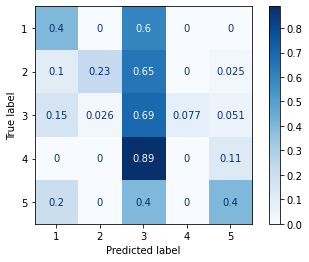

Figurative Set
Accuracy: 0.5185185185185185

              precision    recall  f1-score   support

           1     0.3333    0.5000    0.4000         6
           2     0.7500    0.3529    0.4800        17
           3     0.4815    0.6842    0.5652        19
           4     0.3333    0.1667    0.2222         6
           5     0.7143    0.8333    0.7692         6

    accuracy                         0.5185        54
   macro avg     0.5225    0.5074    0.4873        54
weighted avg     0.5590    0.5185    0.5046        54



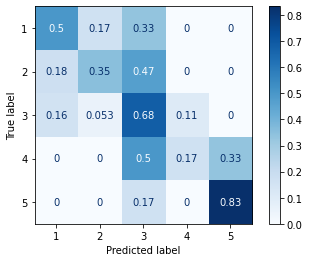

Qualifiers Set
Accuracy: 0.4864864864864865

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     1.0000    0.0667    0.1250        15
           3     0.5333    0.8889    0.6667        18
           4     0.5000    1.0000    0.6667         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.4865        37
   macro avg     0.4067    0.3911    0.2917        37
weighted avg     0.6784    0.4865    0.3930        37



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

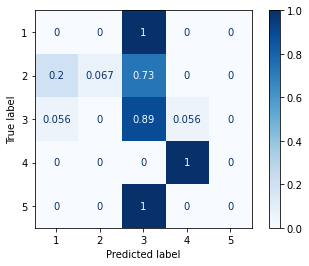

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



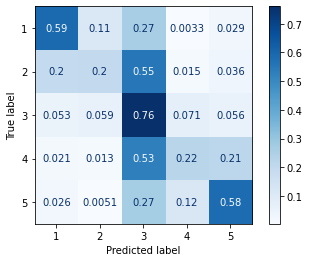

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

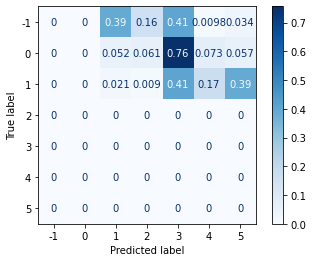

Contradictory Set
Accuracy: 0.42718446601941745

              precision    recall  f1-score   support

           1     0.3000    0.3000    0.3000        10
           2     0.8333    0.2500    0.3846        40
           3     0.4242    0.7179    0.5333        39
           4     0.1250    0.1111    0.1176         9
           5     0.2857    0.4000    0.3333         5

    accuracy                         0.4272       103
   macro avg     0.3937    0.3558    0.3338       103
weighted avg     0.5382    0.4272    0.4069       103



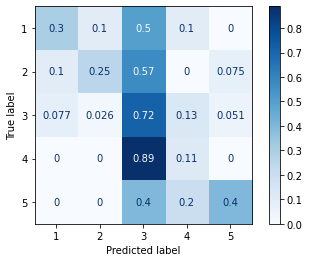

Figurative Set
Accuracy: 0.4074074074074074

              precision    recall  f1-score   support

           1     0.1429    0.1667    0.1538         6
           2     0.6667    0.3529    0.4615        17
           3     0.4074    0.5789    0.4783        19
           4     0.0000    0.0000    0.0000         6
           5     0.5000    0.6667    0.5714         6

    accuracy                         0.4074        54
   macro avg     0.3434    0.3530    0.3330        54
weighted avg     0.4247    0.4074    0.3942        54



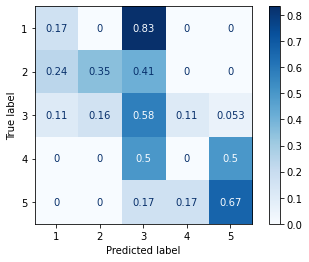

Qualifiers Set
Accuracy: 0.4594594594594595

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.6667    0.1333    0.2222        15
           3     0.5185    0.7778    0.6222        18
           4     0.3333    1.0000    0.5000         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.4595        37
   macro avg     0.3037    0.3822    0.2689        37
weighted avg     0.5315    0.4595    0.4063        37



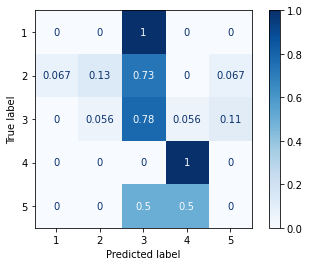

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



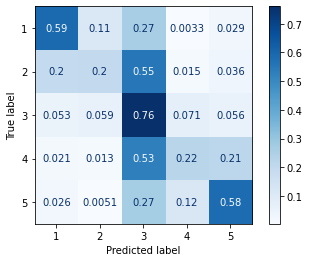

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

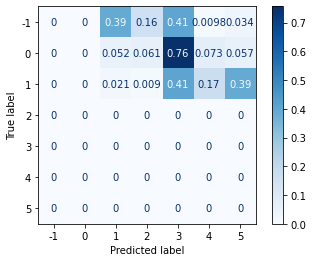

Contradictory Set
Accuracy: 0.3592233009708738

              precision    recall  f1-score   support

           1     0.0833    0.1000    0.0909        10
           2     0.8750    0.1750    0.2917        40
           3     0.3750    0.6923    0.4865        39
           4     0.0000    0.0000    0.0000         9
           5     0.3333    0.4000    0.3636         5

    accuracy                         0.3592       103
   macro avg     0.3333    0.2735    0.2465       103
weighted avg     0.5061    0.3592    0.3240       103



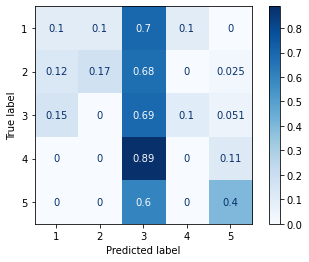

Figurative Set
Accuracy: 0.46296296296296297

              precision    recall  f1-score   support

           1     0.4286    0.5000    0.4615         6
           2     0.7000    0.4118    0.5185        17
           3     0.3846    0.5263    0.4444        19
           4     0.3333    0.1667    0.2222         6
           5     0.5000    0.6667    0.5714         6

    accuracy                         0.4630        54
   macro avg     0.4693    0.4543    0.4436        54
weighted avg     0.4959    0.4630    0.4591        54



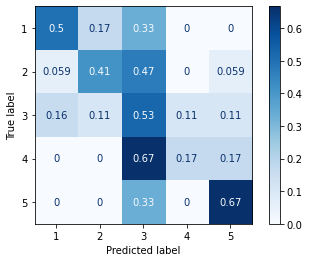

Qualifiers Set
Accuracy: 0.5675675675675675

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.6000    0.2000    0.3000        15
           3     0.5517    0.8889    0.6809        18
           4     1.0000    1.0000    1.0000         1
           5     1.0000    0.5000    0.6667         2

    accuracy                         0.5676        37
   macro avg     0.6303    0.5178    0.5295        37
weighted avg     0.5927    0.5676    0.5159        37



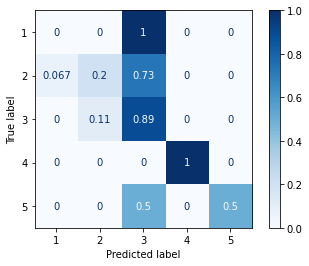

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



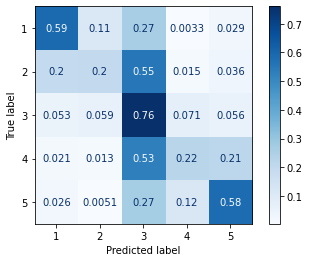

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

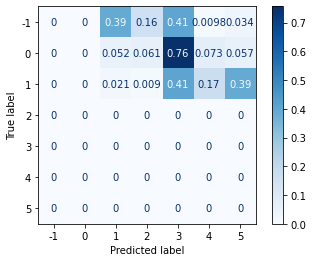

Contradictory Set
Accuracy: 0.3883495145631068

              precision    recall  f1-score   support

           1     0.2500    0.2000    0.2222        10
           2     0.5556    0.1250    0.2041        40
           3     0.4028    0.7436    0.5225        39
           4     0.2500    0.1111    0.1538         9
           5     0.3000    0.6000    0.4000         5

    accuracy                         0.3883       103
   macro avg     0.3517    0.3559    0.3005       103
weighted avg     0.4289    0.3883    0.3315       103



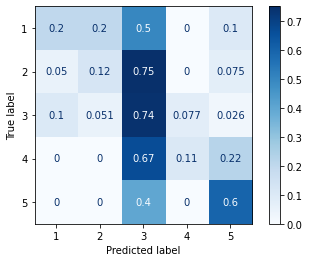

Figurative Set
Accuracy: 0.46296296296296297

              precision    recall  f1-score   support

           1     0.2857    0.3333    0.3077         6
           2     0.8571    0.3529    0.5000        17
           3     0.4516    0.7368    0.5600        19
           4     0.0000    0.0000    0.0000         6
           5     0.5000    0.5000    0.5000         6

    accuracy                         0.4630        54
   macro avg     0.4189    0.3846    0.3735        54
weighted avg     0.5160    0.4630    0.4442        54



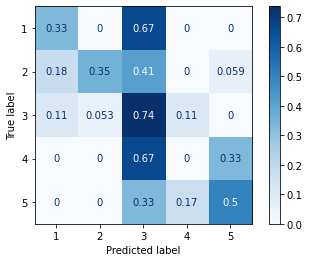

Qualifiers Set
Accuracy: 0.5675675675675675

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     1.0000    0.2000    0.3333        15
           3     0.5667    0.9444    0.7083        18
           4     0.3333    1.0000    0.5000         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.5676        37
   macro avg     0.3800    0.4289    0.3083        37
weighted avg     0.6901    0.5676    0.4932        37



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

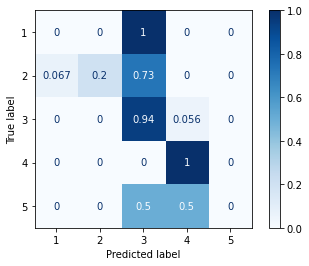

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



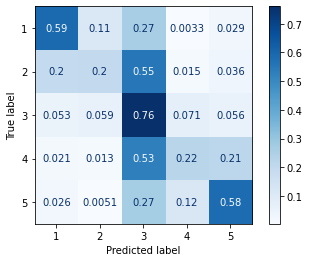

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

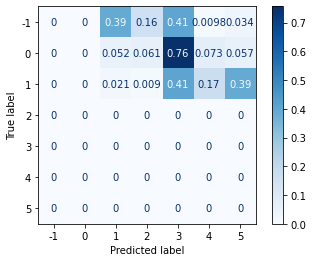

Contradictory Set
Accuracy: 0.4174757281553398

              precision    recall  f1-score   support

           1     0.3750    0.3000    0.3333        10
           2     0.8182    0.2250    0.3529        40
           3     0.3919    0.7436    0.5133        39
           4     0.0000    0.0000    0.0000         9
           5     0.2857    0.4000    0.3333         5

    accuracy                         0.4175       103
   macro avg     0.3742    0.3337    0.3066       103
weighted avg     0.5164    0.4175    0.3800       103



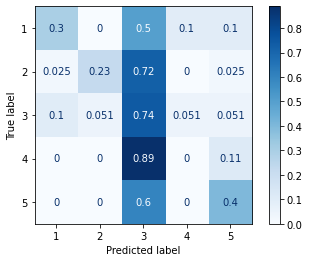

Figurative Set
Accuracy: 0.46296296296296297

              precision    recall  f1-score   support

           1     0.3750    0.5000    0.4286         6
           2     0.7143    0.2941    0.4167        17
           3     0.5417    0.6842    0.6047        19
           4     0.1667    0.1667    0.1667         6
           5     0.3333    0.5000    0.4000         6

    accuracy                         0.4630        54
   macro avg     0.4262    0.4290    0.4033        54
weighted avg     0.5127    0.4630    0.4545        54



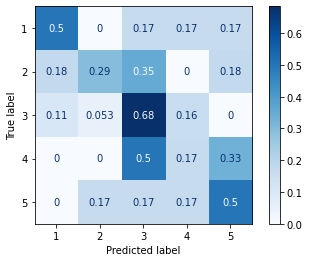

Qualifiers Set
Accuracy: 0.5405405405405406

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     1.0000    0.2667    0.4211        15
           3     0.5556    0.8333    0.6667        18
           4     1.0000    1.0000    1.0000         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.5405        37
   macro avg     0.5111    0.4200    0.4175        37
weighted avg     0.7027    0.5405    0.5220        37



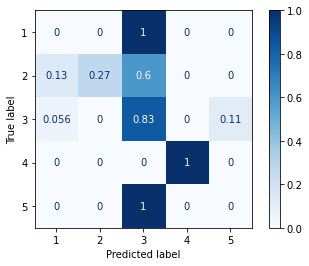

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



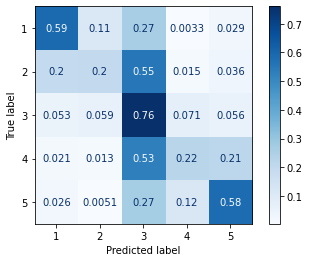

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

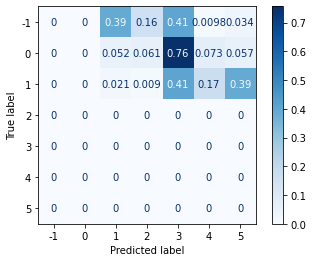

Contradictory Set
Accuracy: 0.36893203883495146

              precision    recall  f1-score   support

           1     0.1333    0.2000    0.1600        10
           2     0.6429    0.2250    0.3333        40
           3     0.3934    0.6154    0.4800        39
           4     0.1667    0.1111    0.1333         9
           5     0.2857    0.4000    0.3333         5

    accuracy                         0.3689       103
   macro avg     0.3244    0.3103    0.2880       103
weighted avg     0.4400    0.3689    0.3546       103



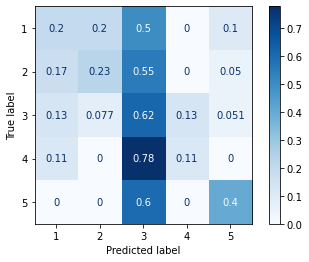

Figurative Set
Accuracy: 0.4074074074074074

              precision    recall  f1-score   support

           1     0.2857    0.3333    0.3077         6
           2     0.5714    0.2353    0.3333        17
           3     0.3929    0.5789    0.4681        19
           4     0.0000    0.0000    0.0000         6
           5     0.5000    0.8333    0.6250         6

    accuracy                         0.4074        54
   macro avg     0.3500    0.3962    0.3468        54
weighted avg     0.4054    0.4074    0.3733        54



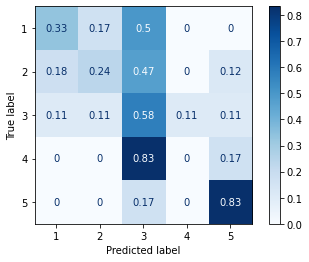

Qualifiers Set
Accuracy: 0.6216216216216216

              precision    recall  f1-score   support

           1     0.3333    1.0000    0.5000         1
           2     0.8000    0.2667    0.4000        15
           3     0.6538    0.9444    0.7727        18
           4     0.0000    0.0000    0.0000         1
           5     0.3333    0.5000    0.4000         2

    accuracy                         0.6216        37
   macro avg     0.4241    0.5422    0.4145        37
weighted avg     0.6694    0.6216    0.5732        37



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

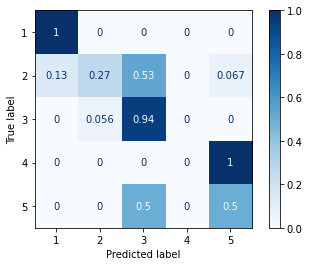

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



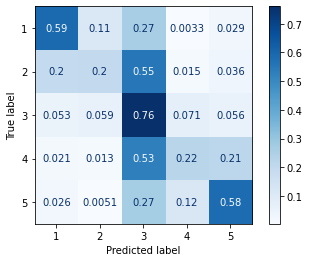

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

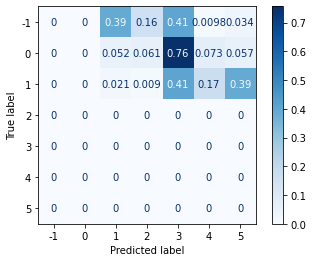

Contradictory Set
Accuracy: 0.3592233009708738

              precision    recall  f1-score   support

           1     0.2143    0.3000    0.2500        10
           2     0.5455    0.1500    0.2353        40
           3     0.3824    0.6667    0.4860        39
           4     0.0000    0.0000    0.0000         9
           5     0.2857    0.4000    0.3333         5

    accuracy                         0.3592       103
   macro avg     0.2856    0.3033    0.2609       103
weighted avg     0.3913    0.3592    0.3158       103



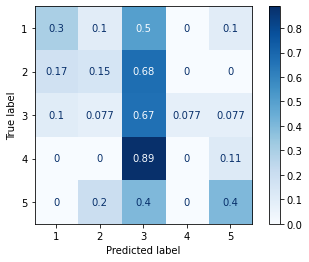

Figurative Set
Accuracy: 0.4074074074074074

              precision    recall  f1-score   support

           1     0.2000    0.3333    0.2500         6
           2     0.7143    0.2941    0.4167        17
           3     0.4615    0.6316    0.5333        19
           4     0.0000    0.0000    0.0000         6
           5     0.3750    0.5000    0.4286         6

    accuracy                         0.4074        54
   macro avg     0.3502    0.3518    0.3257        54
weighted avg     0.4511    0.4074    0.3942        54



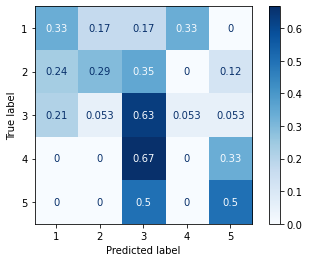

Qualifiers Set
Accuracy: 0.4864864864864865

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.5000    0.2000    0.2857        15
           3     0.5172    0.8333    0.6383        18
           4     0.0000    0.0000    0.0000         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.4865        37
   macro avg     0.2034    0.2067    0.1848        37
weighted avg     0.4543    0.4865    0.4264        37



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

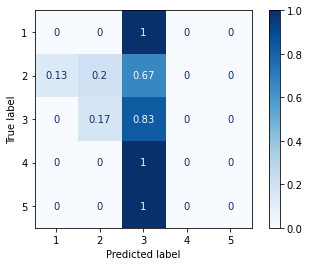

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



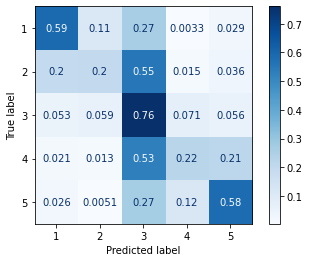

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

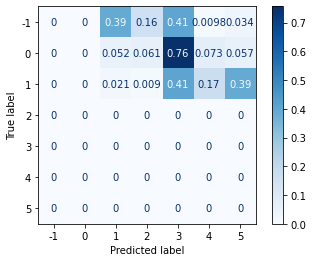

Contradictory Set
Accuracy: 0.44660194174757284

              precision    recall  f1-score   support

           1     0.2500    0.4000    0.3077        10
           2     0.8462    0.2750    0.4151        40
           3     0.4531    0.7436    0.5631        39
           4     0.0000    0.0000    0.0000         9
           5     0.2857    0.4000    0.3333         5

    accuracy                         0.4466       103
   macro avg     0.3670    0.3637    0.3238       103
weighted avg     0.5383    0.4466    0.4205       103



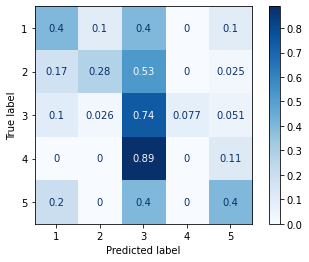

Figurative Set
Accuracy: 0.4444444444444444

              precision    recall  f1-score   support

           1     0.2000    0.3333    0.2500         6
           2     0.6667    0.2353    0.3478        17
           3     0.4800    0.6316    0.5455        19
           4     0.5000    0.1667    0.2500         6
           5     0.4545    0.8333    0.5882         6

    accuracy                         0.4444        54
   macro avg     0.4602    0.4400    0.3963        54
weighted avg     0.5070    0.4444    0.4223        54



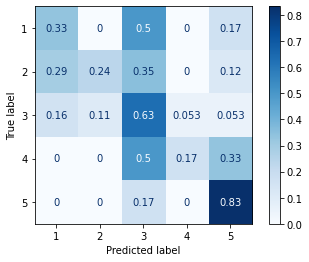

Qualifiers Set
Accuracy: 0.4594594594594595

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.5000    0.1333    0.2105        15
           3     0.5172    0.8333    0.6383        18
           4     0.0000    0.0000    0.0000         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.4595        37
   macro avg     0.2034    0.1933    0.1698        37
weighted avg     0.4543    0.4595    0.3959        37



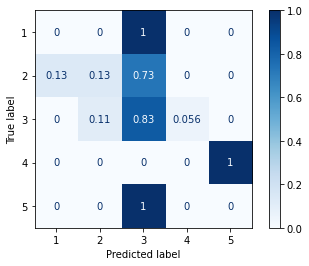

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



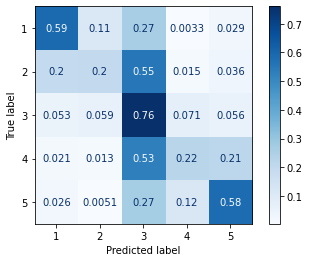

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

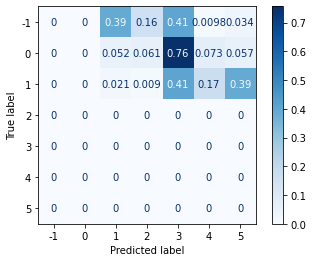

Contradictory Set
Accuracy: 0.39805825242718446

              precision    recall  f1-score   support

           1     0.1818    0.2000    0.1905        10
           2     0.6667    0.2000    0.3077        40
           3     0.4500    0.6923    0.5455        39
           4     0.2222    0.2222    0.2222         9
           5     0.1818    0.4000    0.2500         5

    accuracy                         0.3981       103
   macro avg     0.3405    0.3429    0.3032       103
weighted avg     0.4752    0.3981    0.3761       103



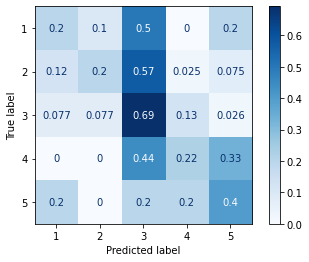

Figurative Set
Accuracy: 0.42592592592592593

              precision    recall  f1-score   support

           1     0.1818    0.3333    0.2353         6
           2     0.4286    0.1765    0.2500        17
           3     0.4800    0.6316    0.5455        19
           4     0.3333    0.1667    0.2222         6
           5     0.6250    0.8333    0.7143         6

    accuracy                         0.4259        54
   macro avg     0.4097    0.4283    0.3935        54
weighted avg     0.4305    0.4259    0.4008        54



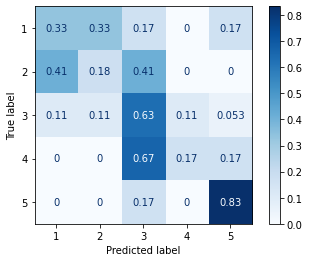

Qualifiers Set
Accuracy: 0.5135135135135135

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.7500    0.4000    0.5217        15
           3     0.5652    0.7222    0.6341        18
           4     0.0000    0.0000    0.0000         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.5135        37
   macro avg     0.2630    0.2244    0.2312        37
weighted avg     0.5790    0.5135    0.5200        37



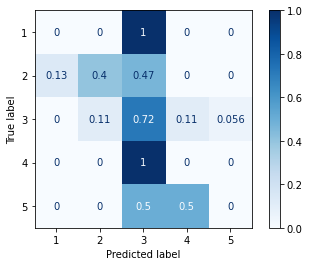

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



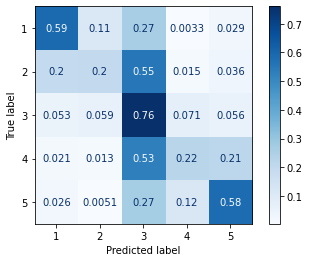

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

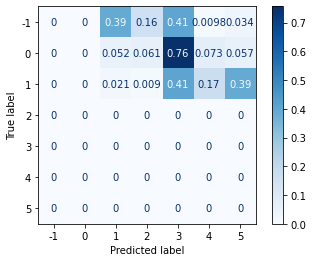

Contradictory Set
Accuracy: 0.4174757281553398

              precision    recall  f1-score   support

           1     0.2857    0.4000    0.3333        10
           2     0.8750    0.1750    0.2917        40
           3     0.4028    0.7436    0.5225        39
           4     0.0000    0.0000    0.0000         9
           5     0.6000    0.6000    0.6000         5

    accuracy                         0.4175       103
   macro avg     0.4327    0.3837    0.3495       103
weighted avg     0.5492    0.4175    0.3726       103



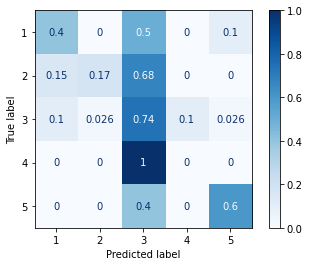

Figurative Set
Accuracy: 0.4074074074074074

              precision    recall  f1-score   support

           1     0.1250    0.1667    0.1429         6
           2     0.5455    0.3529    0.4286        17
           3     0.4800    0.6316    0.5455        19
           4     0.0000    0.0000    0.0000         6
           5     0.5000    0.5000    0.5000         6

    accuracy                         0.4074        54
   macro avg     0.3301    0.3302    0.3234        54
weighted avg     0.4101    0.4074    0.3983        54



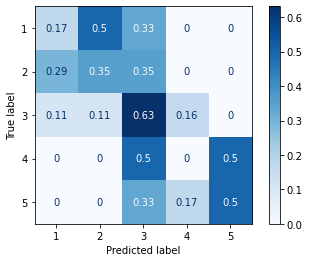

Qualifiers Set
Accuracy: 0.5675675675675675

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     1.0000    0.0667    0.1250        15
           3     0.5625    1.0000    0.7200        18
           4     1.0000    1.0000    1.0000         1
           5     1.0000    0.5000    0.6667         2

    accuracy                         0.5676        37
   macro avg     0.7125    0.5133    0.5023        37
weighted avg     0.7601    0.5676    0.4640        37



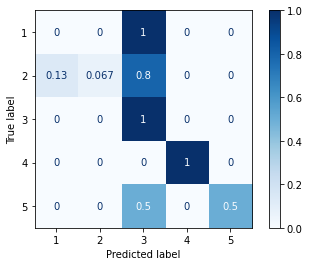

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



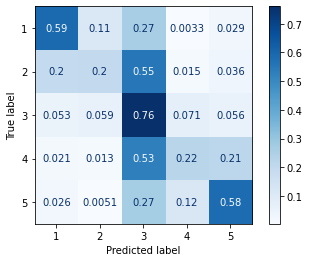

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

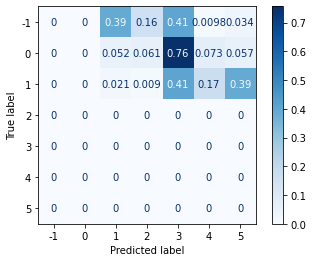

Contradictory Set
Accuracy: 0.36893203883495146

              precision    recall  f1-score   support

           1     0.2500    0.3000    0.2727        10
           2     0.7000    0.1750    0.2800        40
           3     0.3846    0.6410    0.4808        39
           4     0.1667    0.1111    0.1333         9
           5     0.2000    0.4000    0.2667         5

    accuracy                         0.3689       103
   macro avg     0.3403    0.3254    0.2867       103
weighted avg     0.4660    0.3689    0.3419       103



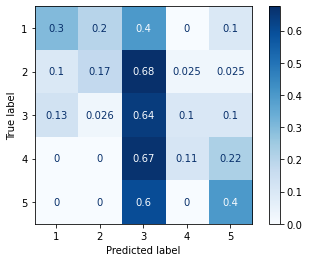

Figurative Set
Accuracy: 0.4074074074074074

              precision    recall  f1-score   support

           1     0.3000    0.5000    0.3750         6
           2     0.5000    0.1765    0.2609        17
           3     0.4400    0.5789    0.5000        19
           4     0.0000    0.0000    0.0000         6
           5     0.5000    0.8333    0.6250         6

    accuracy                         0.4074        54
   macro avg     0.3480    0.4178    0.3522        54
weighted avg     0.4011    0.4074    0.3692        54



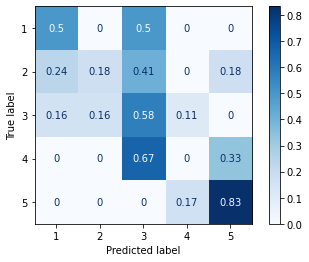

Qualifiers Set
Accuracy: 0.5405405405405406

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.8000    0.2667    0.4000        15
           3     0.5556    0.8333    0.6667        18
           4     0.5000    1.0000    0.6667         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.5405        37
   macro avg     0.3711    0.4200    0.3467        37
weighted avg     0.6081    0.5405    0.5045        37



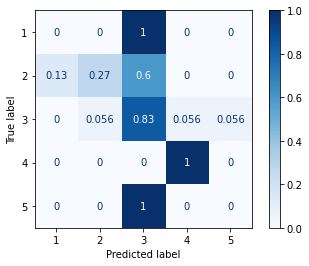

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



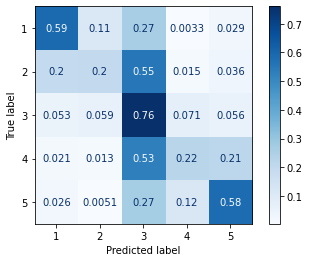

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

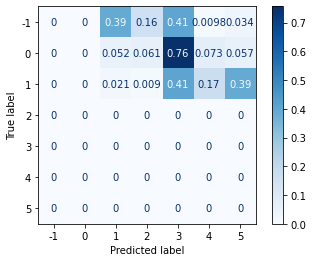

Contradictory Set
Accuracy: 0.4174757281553398

              precision    recall  f1-score   support

           1     0.2941    0.5000    0.3704        10
           2     0.9000    0.2250    0.3600        40
           3     0.4154    0.6923    0.5192        39
           4     0.0000    0.0000    0.0000         9
           5     0.2222    0.4000    0.2857         5

    accuracy                         0.4175       103
   macro avg     0.3663    0.3635    0.3071       103
weighted avg     0.5461    0.4175    0.3862       103



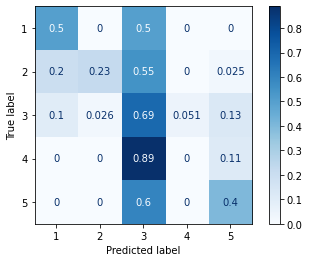

Figurative Set
Accuracy: 0.46296296296296297

              precision    recall  f1-score   support

           1     0.2000    0.3333    0.2500         6
           2     0.6250    0.2941    0.4000        17
           3     0.4800    0.6316    0.5455        19
           4     0.2500    0.1667    0.2000         6
           5     0.7143    0.8333    0.7692         6

    accuracy                         0.4630        54
   macro avg     0.4539    0.4518    0.4329        54
weighted avg     0.4950    0.4630    0.4533        54



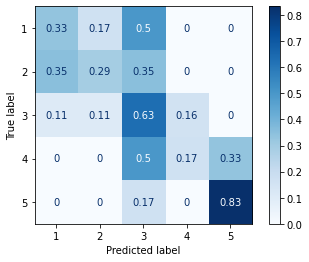

Qualifiers Set
Accuracy: 0.5135135135135135

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     1.0000    0.2000    0.3333        15
           3     0.5926    0.8889    0.7111        18
           4     0.0000    0.0000    0.0000         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.5135        37
   macro avg     0.3185    0.2178    0.2089        37
weighted avg     0.6937    0.5135    0.4811        37



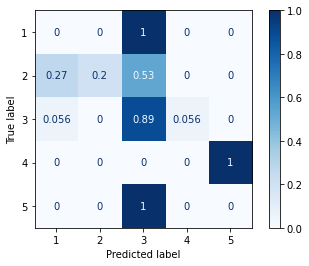

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



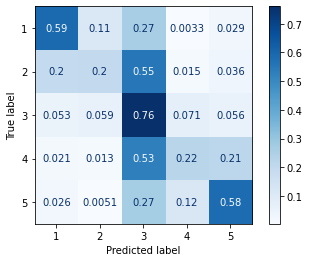

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

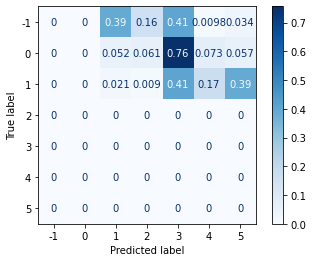

Contradictory Set
Accuracy: 0.4368932038834951

              precision    recall  f1-score   support

           1     0.3333    0.4000    0.3636        10
           2     0.8000    0.2000    0.3200        40
           3     0.4167    0.7692    0.5405        39
           4     0.0000    0.0000    0.0000         9
           5     0.6000    0.6000    0.6000         5

    accuracy                         0.4369       103
   macro avg     0.4300    0.3938    0.3648       103
weighted avg     0.5299    0.4369    0.3934       103



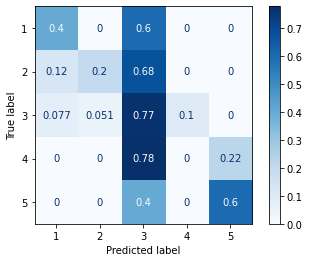

Figurative Set
Accuracy: 0.5185185185185185

              precision    recall  f1-score   support

           1     0.3750    0.5000    0.4286         6
           2     0.8000    0.2353    0.3636        17
           3     0.5000    0.7895    0.6122        19
           4     0.2500    0.1667    0.2000         6
           5     0.7143    0.8333    0.7692         6

    accuracy                         0.5185        54
   macro avg     0.5279    0.5050    0.4747        54
weighted avg     0.5766    0.5185    0.4852        54



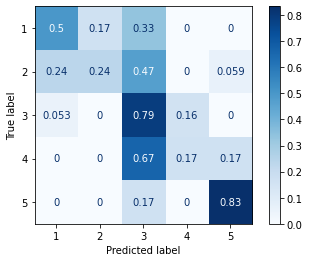

Qualifiers Set
Accuracy: 0.5135135135135135

              precision    recall  f1-score   support

           1     0.3333    1.0000    0.5000         1
           2     0.6000    0.2000    0.3000        15
           3     0.5556    0.8333    0.6667        18
           4     0.0000    0.0000    0.0000         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.5135        37
   macro avg     0.2978    0.4067    0.2933        37
weighted avg     0.5225    0.5135    0.4595        37



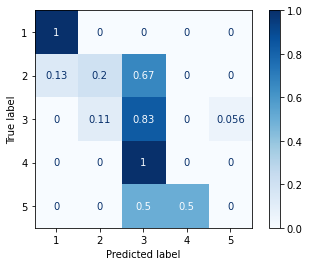

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



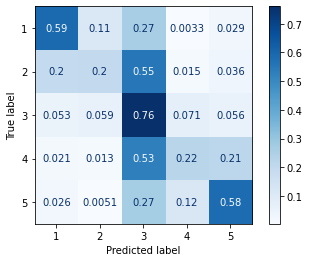

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

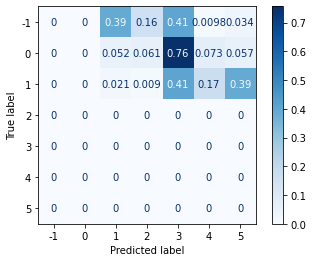

Contradictory Set
Accuracy: 0.39805825242718446

              precision    recall  f1-score   support

           1     0.2500    0.3000    0.2727        10
           2     0.7500    0.2250    0.3462        40
           3     0.4091    0.6923    0.5143        39
           4     0.0000    0.0000    0.0000         9
           5     0.2222    0.4000    0.2857         5

    accuracy                         0.3981       103
   macro avg     0.3263    0.3235    0.2838       103
weighted avg     0.4812    0.3981    0.3695       103



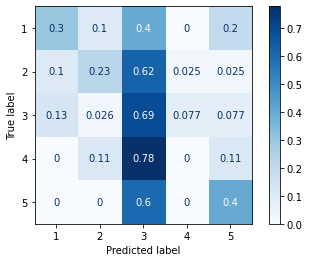

Figurative Set
Accuracy: 0.42592592592592593

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         6
           2     0.7143    0.2941    0.4167        17
           3     0.4483    0.6842    0.5417        19
           4     0.3333    0.1667    0.2222         6
           5     0.5000    0.6667    0.5714         6

    accuracy                         0.4259        54
   macro avg     0.3992    0.3623    0.3504        54
weighted avg     0.4752    0.4259    0.4099        54



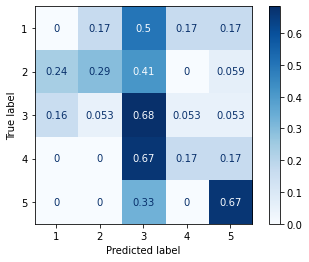

Qualifiers Set
Accuracy: 0.5135135135135135

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.6000    0.2000    0.3000        15
           3     0.5333    0.8889    0.6667        18
           4     0.0000    0.0000    0.0000         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.5135        37
   macro avg     0.2267    0.2178    0.1933        37
weighted avg     0.5027    0.5135    0.4459        37



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

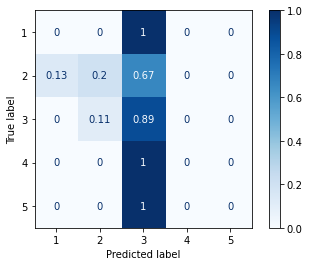

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



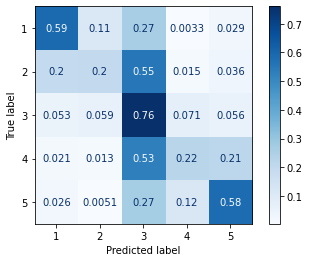

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

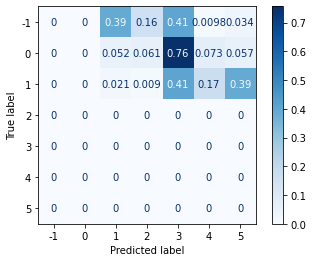

Contradictory Set
Accuracy: 0.4563106796116505

              precision    recall  f1-score   support

           1     0.3750    0.3000    0.3333        10
           2     0.8182    0.2250    0.3529        40
           3     0.4342    0.8462    0.5739        39
           4     0.0000    0.0000    0.0000         9
           5     0.3333    0.4000    0.3636         5

    accuracy                         0.4563       103
   macro avg     0.3921    0.3542    0.3248       103
weighted avg     0.5347    0.4563    0.4044       103



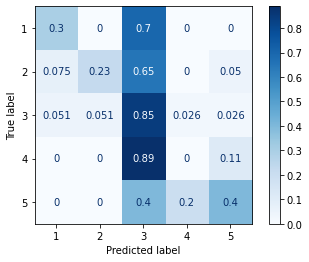

Figurative Set
Accuracy: 0.4074074074074074

              precision    recall  f1-score   support

           1     0.2222    0.3333    0.2667         6
           2     0.6667    0.2353    0.3478        17
           3     0.4333    0.6842    0.5306        19
           4     0.0000    0.0000    0.0000         6
           5     0.4286    0.5000    0.4615         6

    accuracy                         0.4074        54
   macro avg     0.3502    0.3506    0.3213        54
weighted avg     0.4347    0.4074    0.3771        54



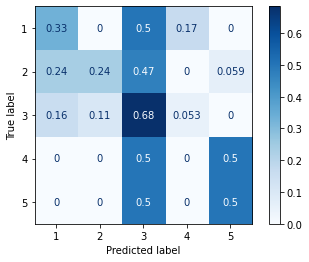

Qualifiers Set
Accuracy: 0.5405405405405406

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.6667    0.1333    0.2222        15
           3     0.5862    0.9444    0.7234        18
           4     1.0000    1.0000    1.0000         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.5405        37
   macro avg     0.4506    0.4156    0.3891        37
weighted avg     0.5825    0.5405    0.4690        37



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

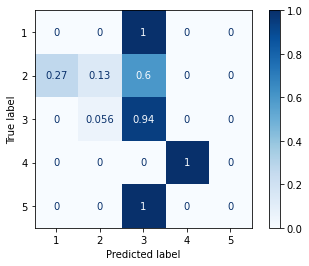

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



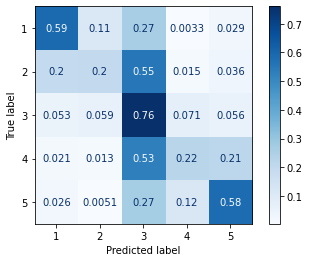

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

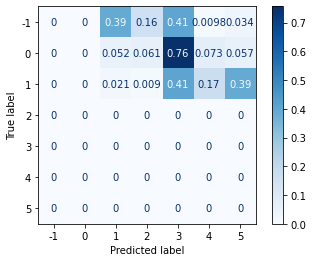

Contradictory Set
Accuracy: 0.36893203883495146

              precision    recall  f1-score   support

           1     0.2353    0.4000    0.2963        10
           2     0.5833    0.1750    0.2692        40
           3     0.3898    0.5897    0.4694        39
           4     0.0000    0.0000    0.0000         9
           5     0.4000    0.8000    0.5333         5

    accuracy                         0.3689       103
   macro avg     0.3217    0.3929    0.3136       103
weighted avg     0.4164    0.3689    0.3369       103



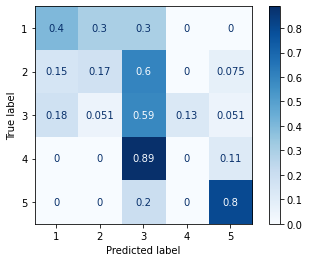

Figurative Set
Accuracy: 0.4074074074074074

              precision    recall  f1-score   support

           1     0.3000    0.5000    0.3750         6
           2     0.7500    0.1765    0.2857        17
           3     0.4000    0.6316    0.4898        19
           4     0.2500    0.1667    0.2000         6
           5     0.5000    0.5000    0.5000         6

    accuracy                         0.4074        54
   macro avg     0.4400    0.3949    0.3701        54
weighted avg     0.4935    0.4074    0.3817        54



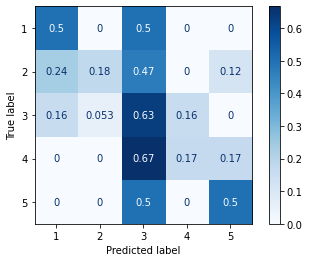

Qualifiers Set
Accuracy: 0.5945945945945946

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     1.0000    0.2667    0.4211        15
           3     0.6071    0.9444    0.7391        18
           4     1.0000    1.0000    1.0000         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.5946        37
   macro avg     0.5214    0.4422    0.4320        37
weighted avg     0.7278    0.5946    0.5573        37



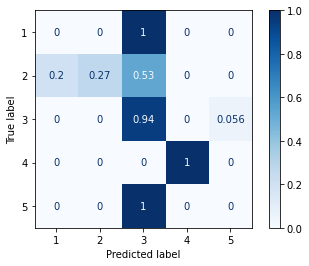

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



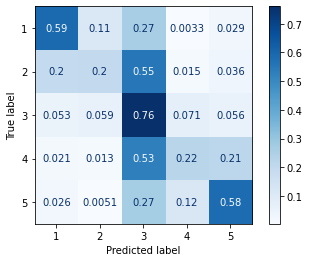

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

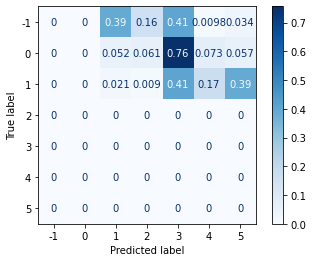

Contradictory Set
Accuracy: 0.32038834951456313

              precision    recall  f1-score   support

           1     0.2000    0.3000    0.2400        10
           2     0.6000    0.0750    0.1333        40
           3     0.3636    0.6154    0.4571        39
           4     0.0000    0.0000    0.0000         9
           5     0.3000    0.6000    0.4000         5

    accuracy                         0.3204       103
   macro avg     0.2927    0.3181    0.2461       103
weighted avg     0.4047    0.3204    0.2676       103



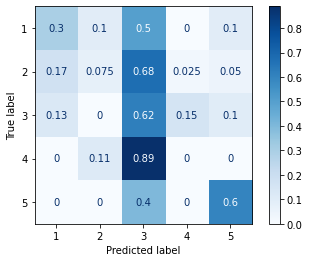

Figurative Set
Accuracy: 0.4074074074074074

              precision    recall  f1-score   support

           1     0.1250    0.1667    0.1429         6
           2     0.5714    0.2353    0.3333        17
           3     0.4444    0.6316    0.5217        19
           4     0.2500    0.1667    0.2000         6
           5     0.5000    0.6667    0.5714         6

    accuracy                         0.4074        54
   macro avg     0.3782    0.3734    0.3539        54
weighted avg     0.4335    0.4074    0.3901        54



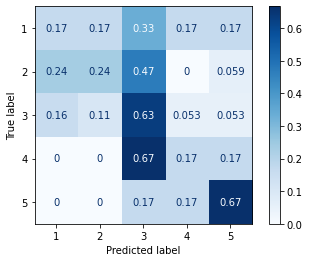

Qualifiers Set
Accuracy: 0.4864864864864865

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     1.0000    0.2000    0.3333        15
           3     0.5385    0.7778    0.6364        18
           4     0.0000    0.0000    0.0000         1
           5     0.2000    0.5000    0.2857         2

    accuracy                         0.4865        37
   macro avg     0.3477    0.2956    0.2511        37
weighted avg     0.6782    0.4865    0.4602        37



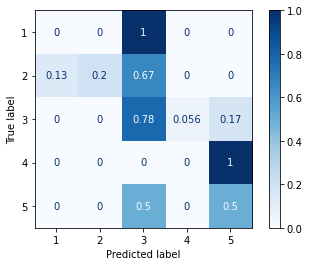

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



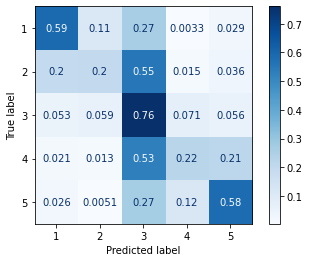

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

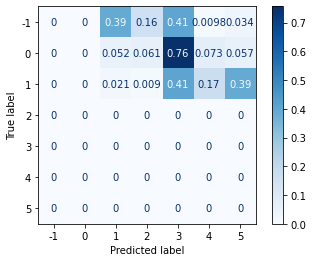

Contradictory Set
Accuracy: 0.33980582524271846

              precision    recall  f1-score   support

           1     0.2000    0.3000    0.2400        10
           2     0.8571    0.1500    0.2553        40
           3     0.3582    0.6154    0.4528        39
           4     0.0000    0.0000    0.0000         9
           5     0.2857    0.4000    0.3333         5

    accuracy                         0.3398       103
   macro avg     0.3402    0.2931    0.2563       103
weighted avg     0.5018    0.3398    0.3101       103



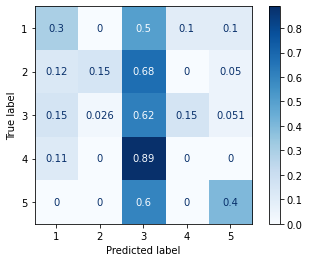

Figurative Set
Accuracy: 0.4074074074074074

              precision    recall  f1-score   support

           1     0.2000    0.3333    0.2500         6
           2     0.6667    0.1176    0.2000        17
           3     0.4706    0.8421    0.6038        19
           4     0.0000    0.0000    0.0000         6
           5     0.2857    0.3333    0.3077         6

    accuracy                         0.4074        54
   macro avg     0.3246    0.3253    0.2723        54
weighted avg     0.4294    0.4074    0.3374        54



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

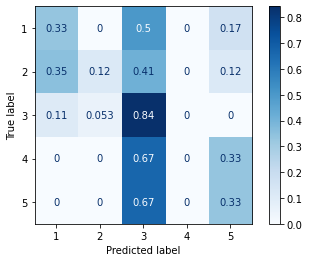

Qualifiers Set
Accuracy: 0.4594594594594595

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.5000    0.2000    0.2857        15
           3     0.5185    0.7778    0.6222        18
           4     0.0000    0.0000    0.0000         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.4595        37
   macro avg     0.2037    0.1956    0.1816        37
weighted avg     0.4550    0.4595    0.4185        37



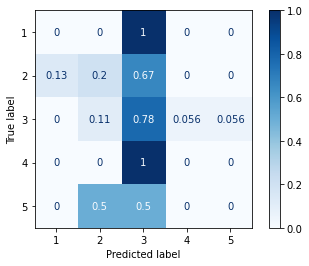

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



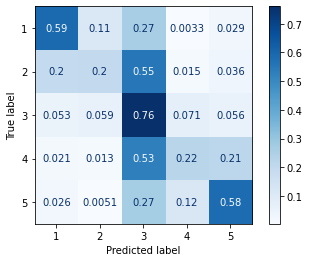

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

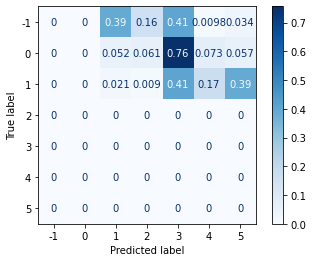

Contradictory Set
Accuracy: 0.3883495145631068

              precision    recall  f1-score   support

           1     0.1667    0.2000    0.1818        10
           2     0.7143    0.2500    0.3704        40
           3     0.4062    0.6667    0.5049        39
           4     0.0000    0.0000    0.0000         9
           5     0.2222    0.4000    0.2857         5

    accuracy                         0.3883       103
   macro avg     0.3019    0.3033    0.2686       103
weighted avg     0.4582    0.3883    0.3665       103



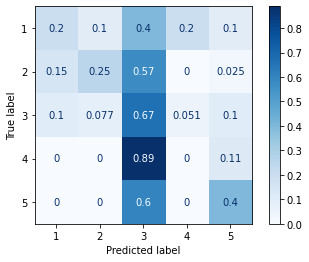

Figurative Set
Accuracy: 0.42592592592592593

              precision    recall  f1-score   support

           1     0.3000    0.5000    0.3750         6
           2     0.6250    0.2941    0.4000        17
           3     0.4400    0.5789    0.5000        19
           4     0.2500    0.1667    0.2000         6
           5     0.4286    0.5000    0.4615         6

    accuracy                         0.4259        54
   macro avg     0.4087    0.4079    0.3873        54
weighted avg     0.4603    0.4259    0.4170        54



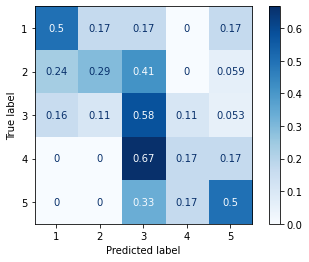

Qualifiers Set
Accuracy: 0.5135135135135135

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.7500    0.2000    0.3158        15
           3     0.5333    0.8889    0.6667        18
           4     0.0000    0.0000    0.0000         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.5135        37
   macro avg     0.2567    0.2178    0.1965        37
weighted avg     0.5635    0.5135    0.4523        37



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

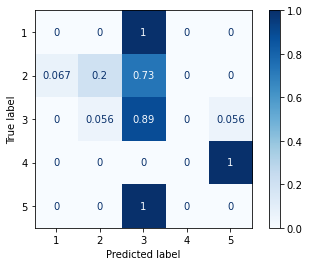

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



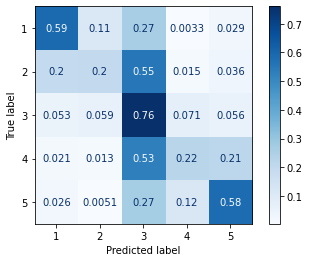

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

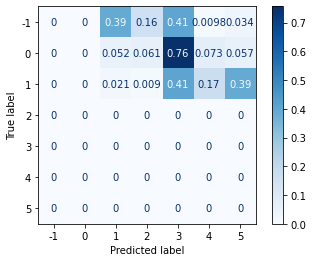

Contradictory Set
Accuracy: 0.46601941747572817

              precision    recall  f1-score   support

           1     0.2500    0.3000    0.2727        10
           2     0.7778    0.3500    0.4828        40
           3     0.4355    0.6923    0.5347        39
           4     0.2500    0.1111    0.1538         9
           5     0.4286    0.6000    0.5000         5

    accuracy                         0.4660       103
   macro avg     0.4284    0.4107    0.3888       103
weighted avg     0.5339    0.4660    0.4541       103



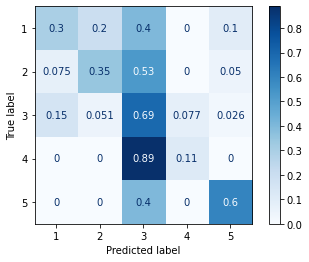

Figurative Set
Accuracy: 0.5555555555555556

              precision    recall  f1-score   support

           1     0.5000    0.5000    0.5000         6
           2     0.8000    0.4706    0.5926        17
           3     0.4839    0.7895    0.6000        19
           4     0.0000    0.0000    0.0000         6
           5     0.6667    0.6667    0.6667         6

    accuracy                         0.5556        54
   macro avg     0.4901    0.4853    0.4719        54
weighted avg     0.5517    0.5556    0.5273        54



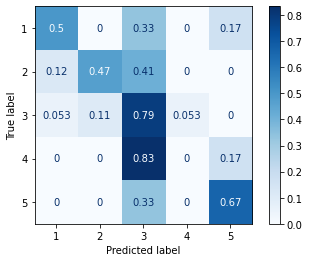

Qualifiers Set
Accuracy: 0.43243243243243246

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.3333    0.1333    0.1905        15
           3     0.4815    0.7222    0.5778        18
           4     0.0000    0.0000    0.0000         1
           5     0.3333    0.5000    0.4000         2

    accuracy                         0.4324        37
   macro avg     0.2296    0.2711    0.2337        37
weighted avg     0.3874    0.4324    0.3799        37



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

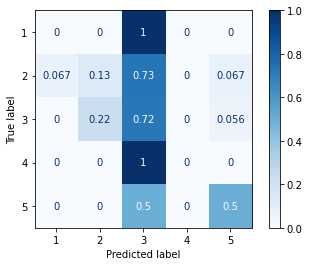

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



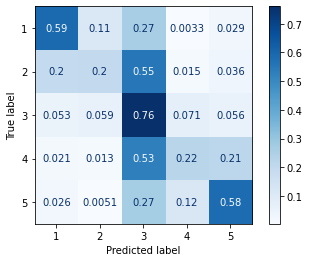

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

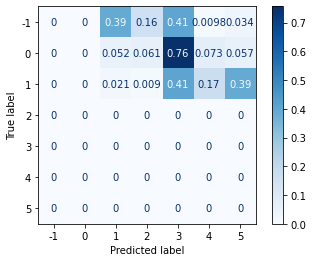

Contradictory Set
Accuracy: 0.4077669902912621

              precision    recall  f1-score   support

           1     0.2353    0.4000    0.2963        10
           2     1.0000    0.2250    0.3673        40
           3     0.4127    0.6667    0.5098        39
           4     0.2000    0.1111    0.1429         9
           5     0.2222    0.4000    0.2857         5

    accuracy                         0.4078       103
   macro avg     0.4140    0.3606    0.3204       103
weighted avg     0.5957    0.4078    0.3908       103



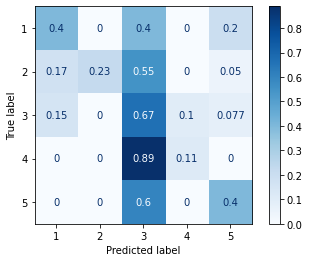

Figurative Set
Accuracy: 0.4444444444444444

              precision    recall  f1-score   support

           1     0.2222    0.3333    0.2667         6
           2     0.6667    0.2353    0.3478        17
           3     0.5000    0.6842    0.5778        19
           4     0.3333    0.3333    0.3333         6
           5     0.4286    0.5000    0.4615         6

    accuracy                         0.4444        54
   macro avg     0.4302    0.4172    0.3974        54
weighted avg     0.4951    0.4444    0.4307        54



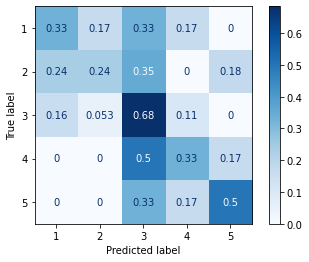

Qualifiers Set
Accuracy: 0.4864864864864865

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.5000    0.0667    0.1176        15
           3     0.5000    0.8889    0.6400        18
           4     0.0000    0.0000    0.0000         1
           5     0.5000    0.5000    0.5000         2

    accuracy                         0.4865        37
   macro avg     0.3000    0.2911    0.2515        37
weighted avg     0.4730    0.4865    0.3861        37



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

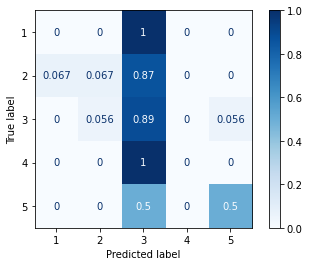

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



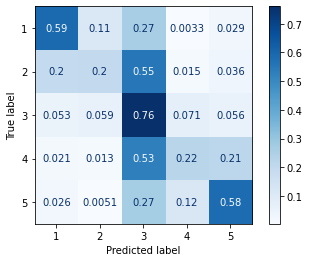

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

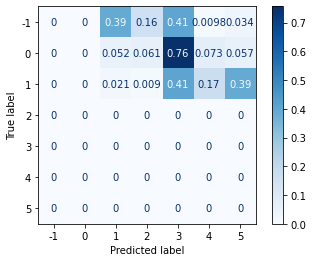

Contradictory Set
Accuracy: 0.39805825242718446

              precision    recall  f1-score   support

           1     0.2308    0.3000    0.2609        10
           2     0.7000    0.1750    0.2800        40
           3     0.4242    0.7179    0.5333        39
           4     0.0000    0.0000    0.0000         9
           5     0.2500    0.6000    0.3529         5

    accuracy                         0.3981       103
   macro avg     0.3210    0.3586    0.2854       103
weighted avg     0.4670    0.3981    0.3531       103



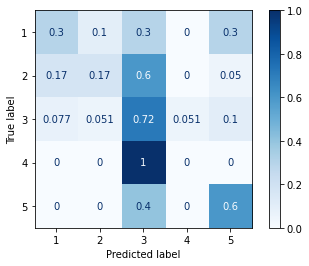

Figurative Set
Accuracy: 0.3888888888888889

              precision    recall  f1-score   support

           1     0.3636    0.6667    0.4706         6
           2     0.4000    0.1176    0.1818        17
           3     0.4074    0.5789    0.4783        19
           4     0.0000    0.0000    0.0000         6
           5     0.4000    0.6667    0.5000         6

    accuracy                         0.3889        54
   macro avg     0.3142    0.4060    0.3261        54
weighted avg     0.3541    0.3889    0.3334        54



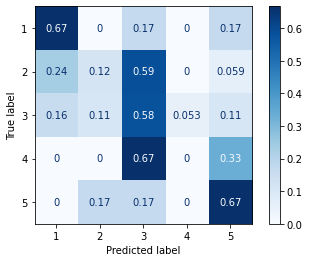

Qualifiers Set
Accuracy: 0.5405405405405406

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     1.0000    0.2000    0.3333        15
           3     0.5556    0.8333    0.6667        18
           4     1.0000    1.0000    1.0000         1
           5     0.2000    0.5000    0.2857         2

    accuracy                         0.5405        37
   macro avg     0.5511    0.5067    0.4571        37
weighted avg     0.7135    0.5405    0.5019        37



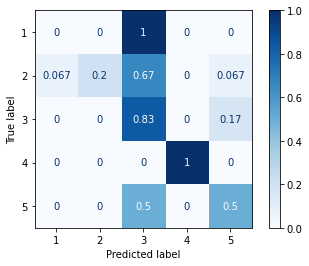

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



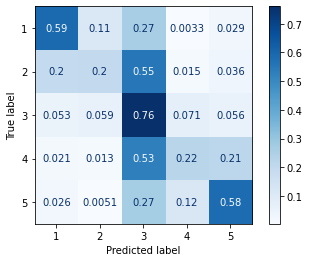

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

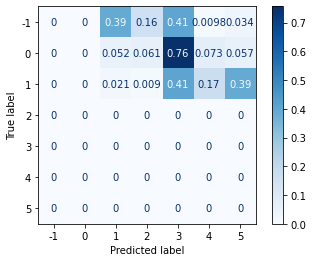

Contradictory Set
Accuracy: 0.39805825242718446

              precision    recall  f1-score   support

           1     0.1667    0.2000    0.1818        10
           2     0.6111    0.2750    0.3793        40
           3     0.4127    0.6667    0.5098        39
           4     0.0000    0.0000    0.0000         9
           5     0.3333    0.4000    0.3636         5

    accuracy                         0.3981       103
   macro avg     0.3048    0.3083    0.2869       103
weighted avg     0.4260    0.3981    0.3756       103



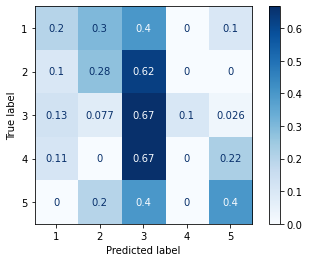

Figurative Set
Accuracy: 0.4074074074074074

              precision    recall  f1-score   support

           1     0.4000    0.6667    0.5000         6
           2     0.5000    0.2353    0.3200        17
           3     0.4231    0.5789    0.4889        19
           4     0.0000    0.0000    0.0000         6
           5     0.4286    0.5000    0.4615         6

    accuracy                         0.4074        54
   macro avg     0.3503    0.3962    0.3541        54
weighted avg     0.3983    0.4074    0.3796        54



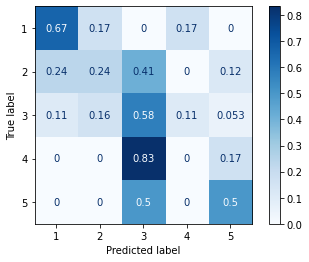

Qualifiers Set
Accuracy: 0.5405405405405406

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     1.0000    0.1333    0.2353        15
           3     0.5625    1.0000    0.7200        18
           4     0.0000    0.0000    0.0000         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.5405        37
   macro avg     0.3125    0.2267    0.1911        37
weighted avg     0.6791    0.5405    0.4457        37



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

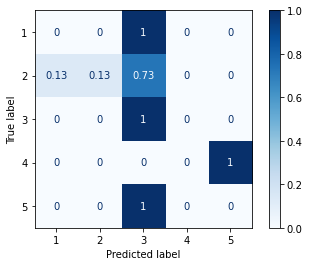

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



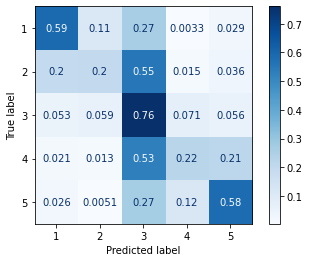

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

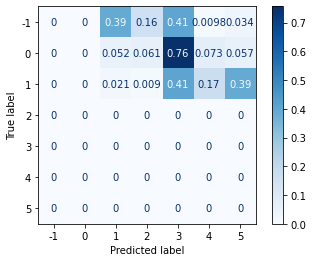

Contradictory Set
Accuracy: 0.4174757281553398

              precision    recall  f1-score   support

           1     0.1818    0.2000    0.1905        10
           2     0.8182    0.2250    0.3529        40
           3     0.4110    0.7692    0.5357        39
           4     0.0000    0.0000    0.0000         9
           5     0.3333    0.4000    0.3636         5

    accuracy                         0.4175       103
   macro avg     0.3489    0.3188    0.2886       103
weighted avg     0.5072    0.4175    0.3761       103



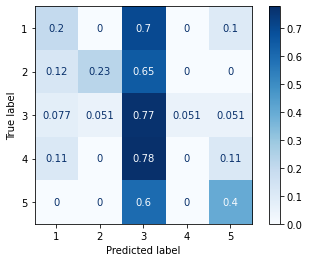

Figurative Set
Accuracy: 0.4444444444444444

              precision    recall  f1-score   support

           1     0.2500    0.3333    0.2857         6
           2     0.6667    0.2353    0.3478        17
           3     0.4643    0.6842    0.5532        19
           4     0.2500    0.1667    0.2000         6
           5     0.5000    0.6667    0.5714         6

    accuracy                         0.4444        54
   macro avg     0.4262    0.4172    0.3916        54
weighted avg     0.4843    0.4444    0.4216        54



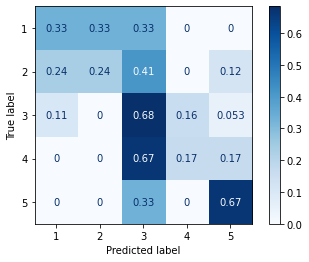

Qualifiers Set
Accuracy: 0.4864864864864865

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.5000    0.1333    0.2105        15
           3     0.5172    0.8333    0.6383        18
           4     1.0000    1.0000    1.0000         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.4865        37
   macro avg     0.4034    0.3933    0.3698        37
weighted avg     0.4814    0.4865    0.4229        37



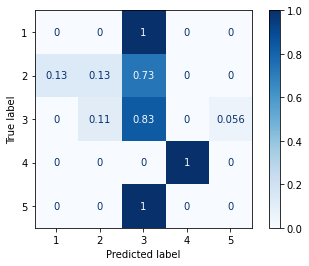

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



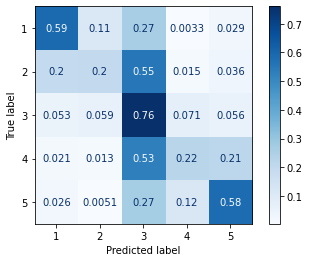

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

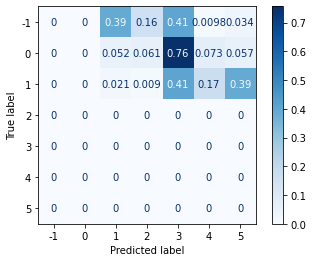

Contradictory Set
Accuracy: 0.39805825242718446

              precision    recall  f1-score   support

           1     0.2500    0.3000    0.2727        10
           2     0.6667    0.2000    0.3077        40
           3     0.4000    0.7179    0.5138        39
           4     0.0000    0.0000    0.0000         9
           5     0.4000    0.4000    0.4000         5

    accuracy                         0.3981       103
   macro avg     0.3433    0.3236    0.2988       103
weighted avg     0.4540    0.3981    0.3599       103



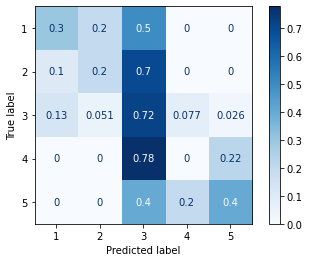

Figurative Set
Accuracy: 0.4074074074074074

              precision    recall  f1-score   support

           1     0.2500    0.3333    0.2857         6
           2     0.6667    0.2353    0.3478        17
           3     0.4231    0.5789    0.4889        19
           4     0.2000    0.1667    0.1818         6
           5     0.4444    0.6667    0.5333         6

    accuracy                         0.4074        54
   macro avg     0.3968    0.3962    0.3675        54
weighted avg     0.4581    0.4074    0.3927        54



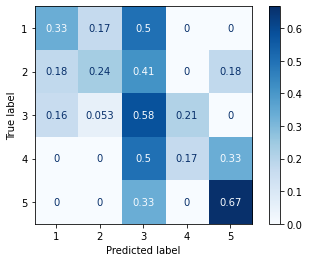

Qualifiers Set
Accuracy: 0.5675675675675675

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.7500    0.2000    0.3158        15
           3     0.5714    0.8889    0.6957        18
           4     1.0000    1.0000    1.0000         1
           5     0.5000    0.5000    0.5000         2

    accuracy                         0.5676        37
   macro avg     0.5643    0.5178    0.5023        37
weighted avg     0.6361    0.5676    0.5205        37



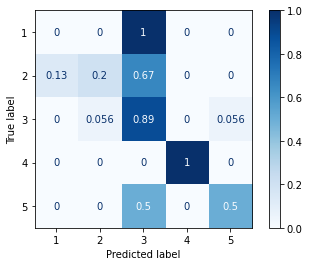

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



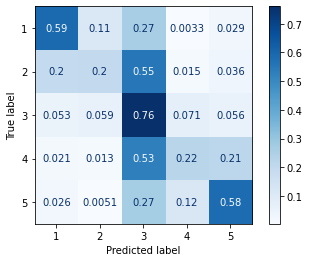

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

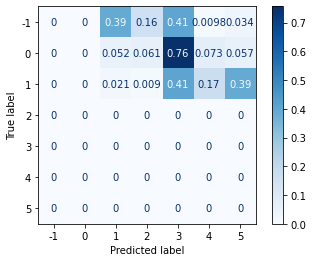

Contradictory Set
Accuracy: 0.3883495145631068

              precision    recall  f1-score   support

           1     0.3077    0.4000    0.3478        10
           2     0.6667    0.2000    0.3077        40
           3     0.4000    0.6667    0.5000        39
           4     0.0000    0.0000    0.0000         9
           5     0.2000    0.4000    0.2667         5

    accuracy                         0.3883       103
   macro avg     0.3149    0.3333    0.2844       103
weighted avg     0.4499    0.3883    0.3555       103



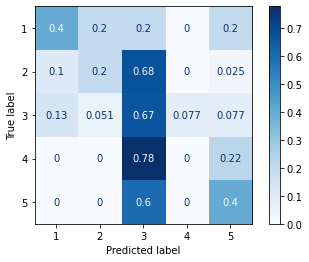

Figurative Set
Accuracy: 0.5370370370370371

              precision    recall  f1-score   support

           1     0.3333    0.5000    0.4000         6
           2     1.0000    0.2941    0.4545        17
           3     0.5000    0.7895    0.6122        19
           4     0.5000    0.3333    0.4000         6
           5     0.6667    0.6667    0.6667         6

    accuracy                         0.5370        54
   macro avg     0.6000    0.5167    0.5067        54
weighted avg     0.6574    0.5370    0.5215        54



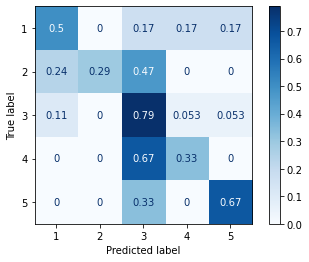

Qualifiers Set
Accuracy: 0.5135135135135135

              precision    recall  f1-score   support

           1     0.3333    1.0000    0.5000         1
           2     0.8000    0.2667    0.4000        15
           3     0.5417    0.7222    0.6190        18
           4     0.5000    1.0000    0.6667         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.5135        37
   macro avg     0.4350    0.5978    0.4371        37
weighted avg     0.6104    0.5135    0.4949        37



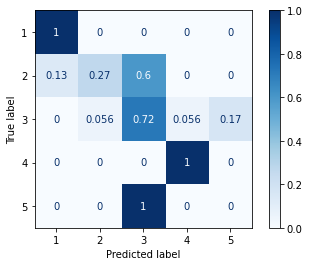

In [230]:
edge_ = []*30
for i in range(30):
    x_contra, x_figurative, x_qual, y_contra, y_figurative, y_qual = extract_features_word_removal(edges.copy(deep=True))   
    edge_.append(evaluate_model(clf2, model_name="clf"))

In [231]:
#logreg, word removal
from scipy import stats
edge = np.array(edge_)[:,2:]

In [232]:
print(stats.describe(edge[:,0]), stats.describe(edge[:,1]), stats.describe(edge[:,2]), sep="\n\n")

DescribeResult(nobs=30, minmax=(0.32038834951456313, 0.46601941747572817), mean=0.3993527508090614, variance=0.0011878875342232736, skewness=-0.2432269235451928, kurtosis=-0.3126794453567072)

DescribeResult(nobs=30, minmax=(0.3888888888888889, 0.5555555555555556), mean=0.44135802469135793, variance=0.0019649811582548925, skewness=1.074542953471836, kurtosis=0.31106156986507116)

DescribeResult(nobs=30, minmax=(0.35135135135135137, 0.6216216216216216), mean=0.5126126126126126, variance=0.002946189432675918, skewness=-0.5771714581149051, kurtosis=1.0576405694074449)


In [233]:
contra, fig, qual

NameError: name 'contra' is not defined

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



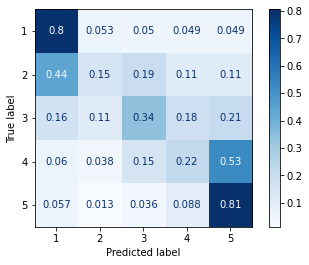

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

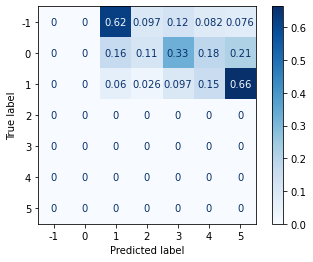

Contradictory Set
Accuracy: 0.24271844660194175

              precision    recall  f1-score   support

           1     0.1923    0.5000    0.2778        10
           2     0.6429    0.2250    0.3333        40
           3     0.3158    0.1538    0.2069        39
           4     0.0667    0.1111    0.0833         9
           5     0.1379    0.8000    0.2353         5

    accuracy                         0.2427       103
   macro avg     0.2711    0.3580    0.2273       103
weighted avg     0.4004    0.2427    0.2535       103



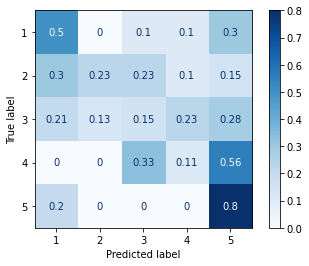

Figurative Set
Accuracy: 0.37037037037037035

              precision    recall  f1-score   support

           1     0.2500    0.6667    0.3636         6
           2     0.6667    0.2353    0.3478        17
           3     0.6667    0.3158    0.4286        19
           4     0.0000    0.0000    0.0000         6
           5     0.3750    1.0000    0.5455         6

    accuracy                         0.3704        54
   macro avg     0.3917    0.4436    0.3371        54
weighted avg     0.5139    0.3704    0.3613        54



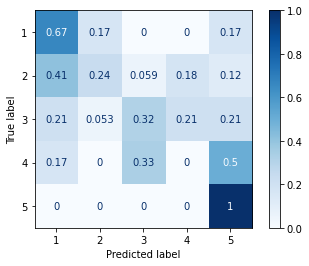

Qualifiers Set
Accuracy: 0.3783783783783784

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.6667    0.2667    0.3810        15
           3     0.6667    0.4444    0.5333        18
           4     0.2500    1.0000    0.4000         1
           5     0.1111    0.5000    0.1818         2

    accuracy                         0.3784        37
   macro avg     0.3389    0.4422    0.2992        37
weighted avg     0.6074    0.3784    0.4345        37



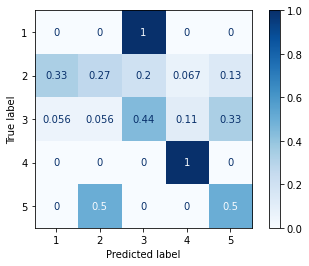

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



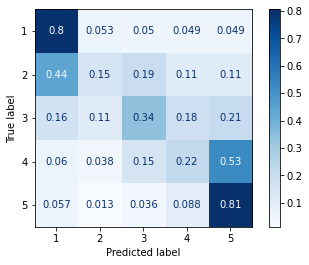

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

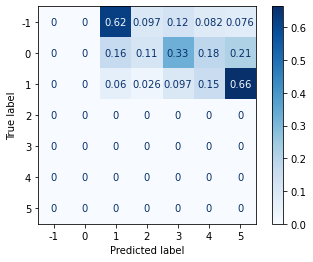

Contradictory Set
Accuracy: 0.3106796116504854

              precision    recall  f1-score   support

           1     0.2500    0.7000    0.3684        10
           2     0.5263    0.2500    0.3390        40
           3     0.4762    0.2564    0.3333        39
           4     0.0833    0.1111    0.0952         9
           5     0.1739    0.8000    0.2857         5

    accuracy                         0.3107       103
   macro avg     0.3020    0.4235    0.2843       103
weighted avg     0.4247    0.3107    0.3158       103



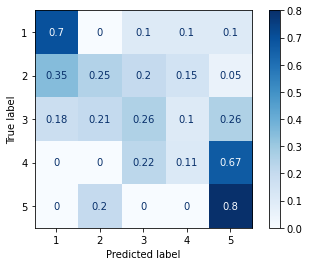

Figurative Set
Accuracy: 0.3888888888888889

              precision    recall  f1-score   support

           1     0.2667    0.6667    0.3810         6
           2     0.6667    0.2353    0.3478        17
           3     0.7778    0.3684    0.5000        19
           4     0.0000    0.0000    0.0000         6
           5     0.3333    1.0000    0.5000         6

    accuracy                         0.3889        54
   macro avg     0.4089    0.4541    0.3458        54
weighted avg     0.5502    0.3889    0.3833        54



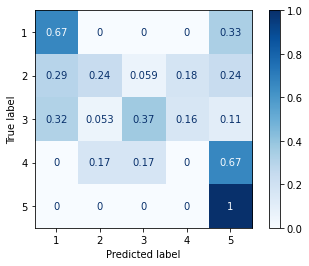

Qualifiers Set
Accuracy: 0.32432432432432434

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.3750    0.2000    0.2609        15
           3     0.6667    0.4444    0.5333        18
           4     0.0000    0.0000    0.0000         1
           5     0.1667    0.5000    0.2500         2

    accuracy                         0.3243        37
   macro avg     0.2417    0.2289    0.2088        37
weighted avg     0.4854    0.3243    0.3787        37



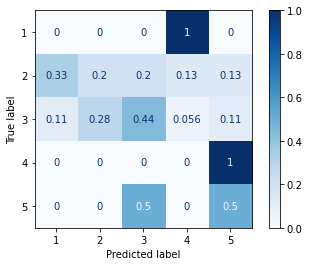

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



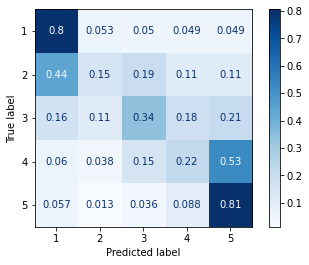

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

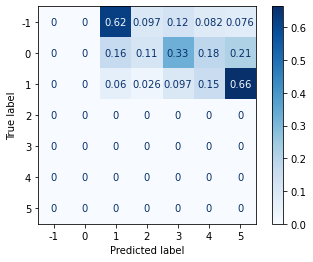

Contradictory Set
Accuracy: 0.20388349514563106

              precision    recall  f1-score   support

           1     0.1379    0.4000    0.2051        10
           2     0.3846    0.1250    0.1887        40
           3     0.3333    0.1795    0.2333        39
           4     0.0833    0.1111    0.0952         9
           5     0.1429    0.8000    0.2424         5

    accuracy                         0.2039       103
   macro avg     0.2164    0.3231    0.1930       103
weighted avg     0.3032    0.2039    0.2016       103



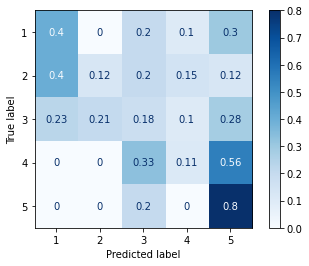

Figurative Set
Accuracy: 0.42592592592592593

              precision    recall  f1-score   support

           1     0.2632    0.8333    0.4000         6
           2     0.6000    0.1765    0.2727        17
           3     0.8889    0.4211    0.5714        19
           4     0.1429    0.1667    0.1538         6
           5     0.4286    1.0000    0.6000         6

    accuracy                         0.4259        54
   macro avg     0.4647    0.5195    0.3996        54
weighted avg     0.5944    0.4259    0.4151        54



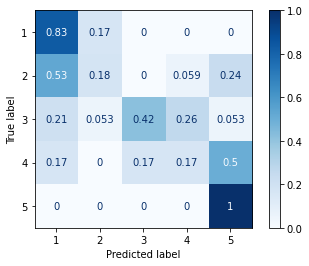

Qualifiers Set
Accuracy: 0.4594594594594595

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     1.0000    0.2000    0.3333        15
           3     0.7222    0.7222    0.7222        18
           4     0.0000    0.0000    0.0000         1
           5     0.2000    0.5000    0.2857         2

    accuracy                         0.4595        37
   macro avg     0.3844    0.2844    0.2683        37
weighted avg     0.7676    0.4595    0.5019        37



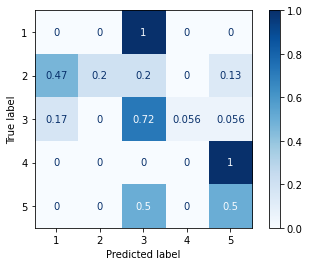

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



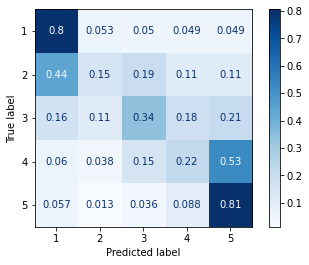

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

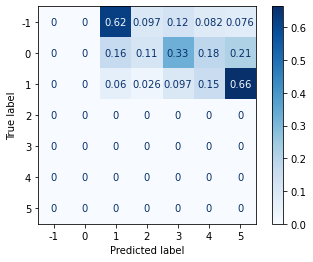

Contradictory Set
Accuracy: 0.2815533980582524

              precision    recall  f1-score   support

           1     0.1739    0.4000    0.2424        10
           2     0.5833    0.1750    0.2692        40
           3     0.5263    0.2564    0.3448        39
           4     0.2105    0.4444    0.2857         9
           5     0.1333    0.8000    0.2286         5

    accuracy                         0.2816       103
   macro avg     0.3255    0.4152    0.2742       103
weighted avg     0.4676    0.2816    0.2947       103



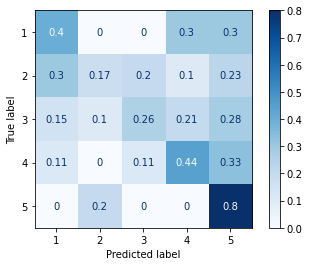

Figurative Set
Accuracy: 0.4074074074074074

              precision    recall  f1-score   support

           1     0.2778    0.8333    0.4167         6
           2     0.7500    0.1765    0.2857        17
           3     0.8000    0.4211    0.5517        19
           4     0.0000    0.0000    0.0000         6
           5     0.3333    1.0000    0.5000         6

    accuracy                         0.4074        54
   macro avg     0.4322    0.4862    0.3508        54
weighted avg     0.5855    0.4074    0.3859        54



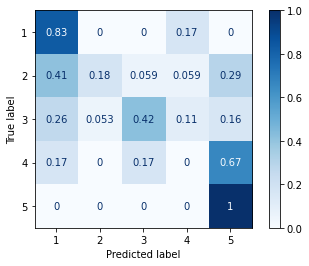

Qualifiers Set
Accuracy: 0.32432432432432434

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.4000    0.1333    0.2000        15
           3     0.7273    0.4444    0.5517        18
           4     0.1429    1.0000    0.2500         1
           5     0.1250    0.5000    0.2000         2

    accuracy                         0.3243        37
   macro avg     0.2790    0.4156    0.2403        37
weighted avg     0.5266    0.3243    0.3671        37



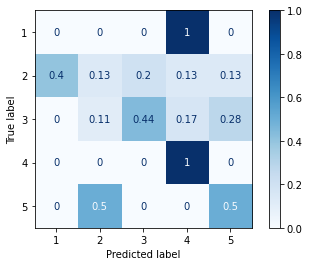

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



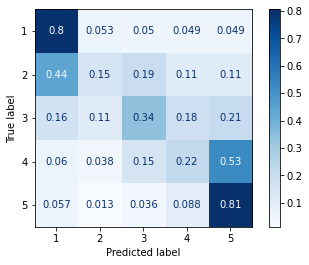

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

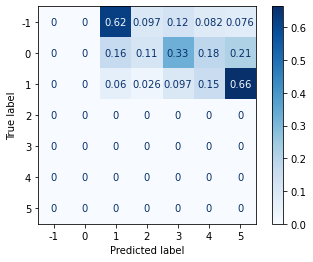

Contradictory Set
Accuracy: 0.2524271844660194

              precision    recall  f1-score   support

           1     0.1739    0.4000    0.2424        10
           2     0.4375    0.1750    0.2500        40
           3     0.4615    0.3077    0.3692        39
           4     0.0000    0.0000    0.0000         9
           5     0.1200    0.6000    0.2000         5

    accuracy                         0.2524       103
   macro avg     0.2386    0.2965    0.2123       103
weighted avg     0.3674    0.2524    0.2701       103



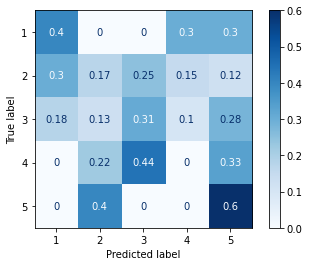

Figurative Set
Accuracy: 0.42592592592592593

              precision    recall  f1-score   support

           1     0.2308    0.5000    0.3158         6
           2     0.5714    0.2353    0.3333        17
           3     0.7500    0.4737    0.5806        19
           4     0.1667    0.1667    0.1667         6
           5     0.3750    1.0000    0.5455         6

    accuracy                         0.4259        54
   macro avg     0.4188    0.4751    0.3884        54
weighted avg     0.5296    0.4259    0.4235        54



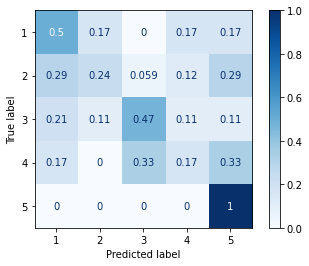

Qualifiers Set
Accuracy: 0.43243243243243246

              precision    recall  f1-score   support

           1     0.1111    1.0000    0.2000         1
           2     0.6000    0.4000    0.4800        15
           3     0.7273    0.4444    0.5517        18
           4     0.0000    0.0000    0.0000         1
           5     0.1667    0.5000    0.2500         2

    accuracy                         0.4324        37
   macro avg     0.3210    0.4689    0.2963        37
weighted avg     0.6091    0.4324    0.4819        37



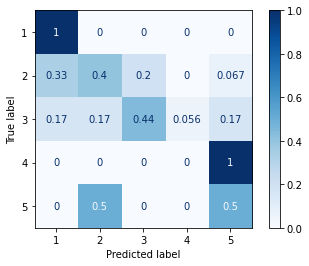

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



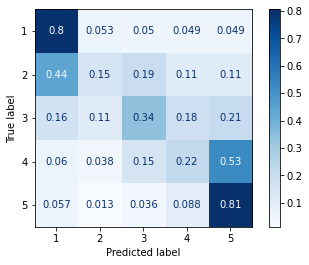

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

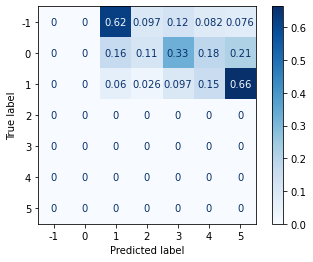

Contradictory Set
Accuracy: 0.22330097087378642

              precision    recall  f1-score   support

           1     0.1481    0.4000    0.2162        10
           2     0.5000    0.1000    0.1667        40
           3     0.4762    0.2564    0.3333        39
           4     0.1176    0.2222    0.1538         9
           5     0.1000    0.6000    0.1714         5

    accuracy                         0.2233       103
   macro avg     0.2684    0.3157    0.2083       103
weighted avg     0.4040    0.2233    0.2337       103



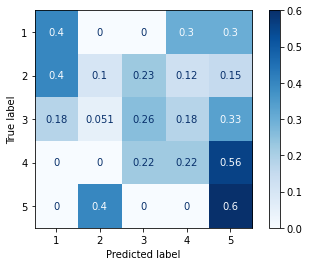

Figurative Set
Accuracy: 0.37037037037037035

              precision    recall  f1-score   support

           1     0.2000    0.6667    0.3077         6
           2     0.6250    0.2941    0.4000        17
           3     0.7500    0.3158    0.4444        19
           4     0.0000    0.0000    0.0000         6
           5     0.3571    0.8333    0.5000         6

    accuracy                         0.3704        54
   macro avg     0.3864    0.4220    0.3304        54
weighted avg     0.5226    0.3704    0.3720        54



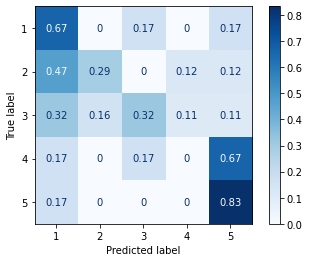

Qualifiers Set
Accuracy: 0.2702702702702703

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.2500    0.1333    0.1739        15
           3     0.7000    0.3889    0.5000        18
           4     0.0000    0.0000    0.0000         1
           5     0.1250    0.5000    0.2000         2

    accuracy                         0.2703        37
   macro avg     0.2150    0.2044    0.1748        37
weighted avg     0.4486    0.2703    0.3246        37



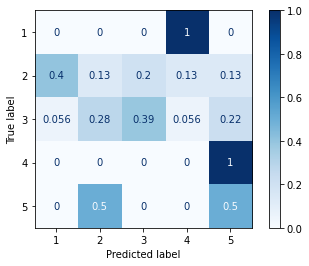

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



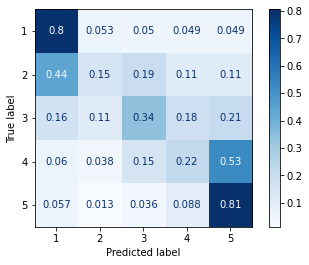

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

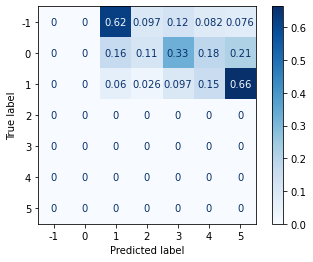

Contradictory Set
Accuracy: 0.2815533980582524

              precision    recall  f1-score   support

           1     0.1875    0.6000    0.2857        10
           2     0.6667    0.2000    0.3077        40
           3     0.5294    0.2308    0.3214        39
           4     0.1333    0.2222    0.1667         9
           5     0.1481    0.8000    0.2500         5

    accuracy                         0.2816       103
   macro avg     0.3330    0.4106    0.2663       103
weighted avg     0.4964    0.2816    0.2956       103



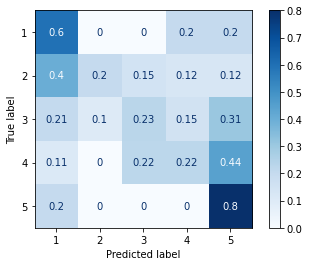

Figurative Set
Accuracy: 0.4074074074074074

              precision    recall  f1-score   support

           1     0.2632    0.8333    0.4000         6
           2     0.7143    0.2941    0.4167        17
           3     0.8750    0.3684    0.5185        19
           4     0.0000    0.0000    0.0000         6
           5     0.2941    0.8333    0.4348         6

    accuracy                         0.4074        54
   macro avg     0.4293    0.4658    0.3540        54
weighted avg     0.5947    0.4074    0.4064        54



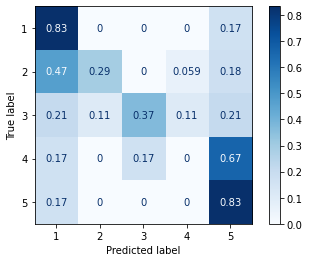

Qualifiers Set
Accuracy: 0.2972972972972973

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.4286    0.2000    0.2727        15
           3     0.5000    0.3333    0.4000        18
           4     0.2000    1.0000    0.3333         1
           5     0.1250    0.5000    0.2000         2

    accuracy                         0.2973        37
   macro avg     0.2507    0.4067    0.2412        37
weighted avg     0.4292    0.2973    0.3250        37



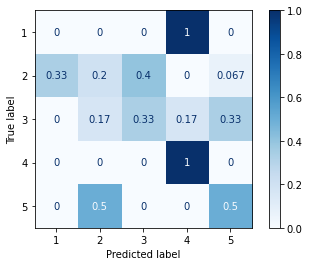

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



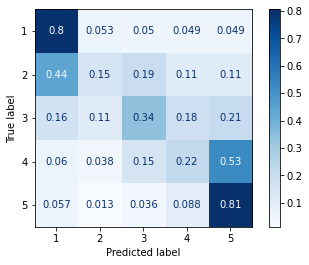

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

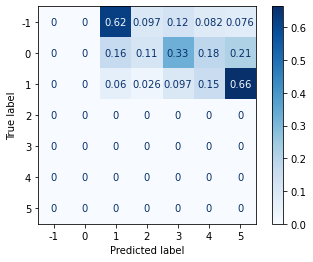

Contradictory Set
Accuracy: 0.2524271844660194

              precision    recall  f1-score   support

           1     0.1935    0.6000    0.2927        10
           2     0.4706    0.2000    0.2807        40
           3     0.4211    0.2051    0.2759        39
           4     0.0667    0.1111    0.0833         9
           5     0.1429    0.6000    0.2308         5

    accuracy                         0.2524       103
   macro avg     0.2589    0.3432    0.2327       103
weighted avg     0.3737    0.2524    0.2604       103



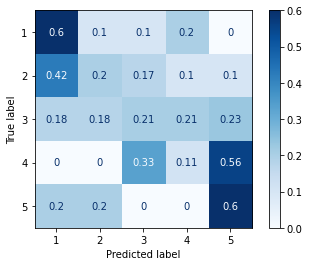

Figurative Set
Accuracy: 0.37037037037037035

              precision    recall  f1-score   support

           1     0.2778    0.8333    0.4167         6
           2     0.5000    0.2353    0.3200        17
           3     0.8000    0.2105    0.3333        19
           4     0.2000    0.3333    0.2500         6
           5     0.3846    0.8333    0.5263         6

    accuracy                         0.3704        54
   macro avg     0.4325    0.4892    0.3693        54
weighted avg     0.5347    0.3704    0.3506        54



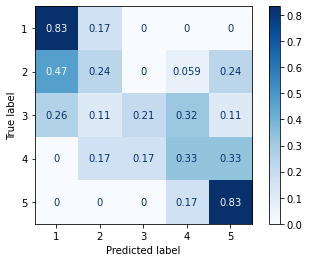

Qualifiers Set
Accuracy: 0.35135135135135137

              precision    recall  f1-score   support

           1     0.1111    1.0000    0.2000         1
           2     0.4286    0.2000    0.2727        15
           3     0.5833    0.3889    0.4667        18
           4     0.2500    1.0000    0.4000         1
           5     0.2000    0.5000    0.2857         2

    accuracy                         0.3514        37
   macro avg     0.3146    0.6178    0.3250        37
weighted avg     0.4781    0.3514    0.3693        37



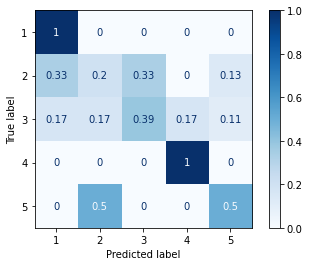

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



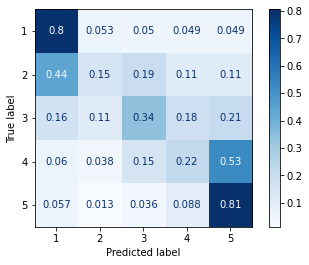

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

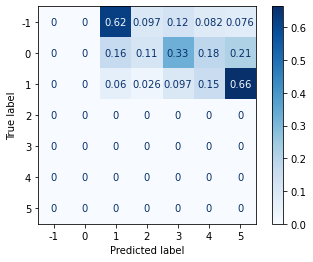

Contradictory Set
Accuracy: 0.24271844660194175

              precision    recall  f1-score   support

           1     0.1290    0.4000    0.1951        10
           2     0.3571    0.1250    0.1852        40
           3     0.5238    0.2821    0.3667        39
           4     0.1875    0.3333    0.2400         9
           5     0.0952    0.4000    0.1538         5

    accuracy                         0.2427       103
   macro avg     0.2585    0.3081    0.2282       103
weighted avg     0.3706    0.2427    0.2581       103



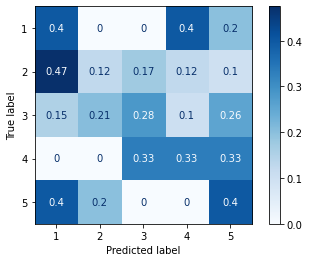

Figurative Set
Accuracy: 0.3888888888888889

              precision    recall  f1-score   support

           1     0.2941    0.8333    0.4348         6
           2     0.6667    0.3529    0.4615        17
           3     0.7500    0.3158    0.4444        19
           4     0.0000    0.0000    0.0000         6
           5     0.3077    0.6667    0.4211         6

    accuracy                         0.3889        54
   macro avg     0.4037    0.4337    0.3524        54
weighted avg     0.5406    0.3889    0.3968        54



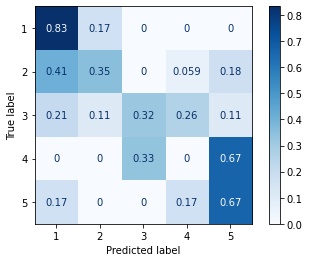

Qualifiers Set
Accuracy: 0.32432432432432434

              precision    recall  f1-score   support

           1     0.1250    1.0000    0.2222         1
           2     0.5000    0.2000    0.2857        15
           3     0.6364    0.3889    0.4828        18
           4     0.0000    0.0000    0.0000         1
           5     0.1000    0.5000    0.1667         2

    accuracy                         0.3243        37
   macro avg     0.2723    0.4178    0.2315        37
weighted avg     0.5211    0.3243    0.3657        37



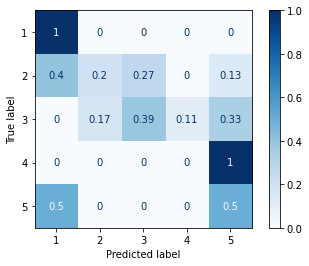

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



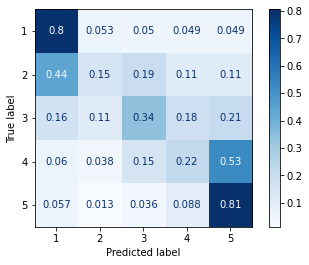

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

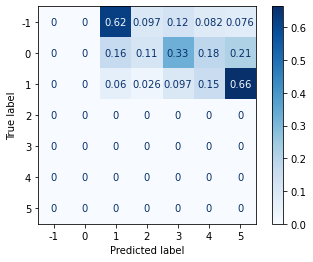

Contradictory Set
Accuracy: 0.27184466019417475

              precision    recall  f1-score   support

           1     0.1562    0.5000    0.2381        10
           2     0.7500    0.2250    0.3462        40
           3     0.5294    0.2308    0.3214        39
           4     0.0769    0.1111    0.0909         9
           5     0.1379    0.8000    0.2353         5

    accuracy                         0.2718       103
   macro avg     0.3301    0.3734    0.2464       103
weighted avg     0.5203    0.2718    0.2986       103



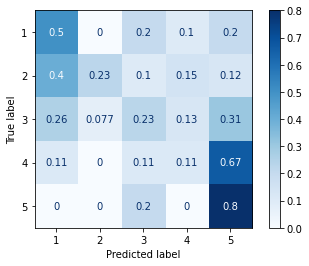

Figurative Set
Accuracy: 0.42592592592592593

              precision    recall  f1-score   support

           1     0.2667    0.6667    0.3810         6
           2     0.7500    0.3529    0.4800        17
           3     1.0000    0.4211    0.5926        19
           4     0.0000    0.0000    0.0000         6
           5     0.3571    0.8333    0.5000         6

    accuracy                         0.4259        54
   macro avg     0.4748    0.4548    0.3907        54
weighted avg     0.6573    0.4259    0.4575        54



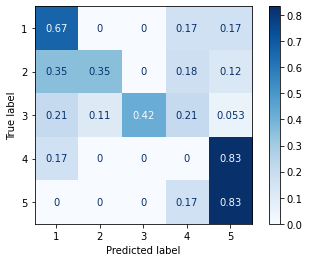

Qualifiers Set
Accuracy: 0.40540540540540543

              precision    recall  f1-score   support

           1     0.1111    1.0000    0.2000         1
           2     0.6667    0.1333    0.2222        15
           3     0.7333    0.6111    0.6667        18
           4     0.0000    0.0000    0.0000         1
           5     0.1429    0.5000    0.2222         2

    accuracy                         0.4054        37
   macro avg     0.3308    0.4489    0.2622        37
weighted avg     0.6378    0.4054    0.4318        37



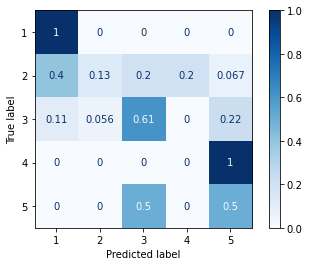

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



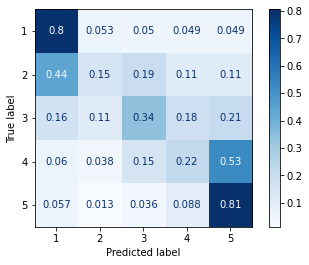

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

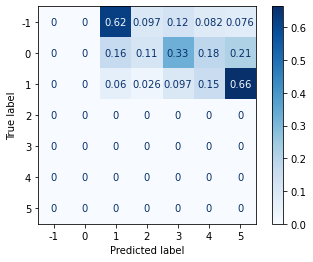

Contradictory Set
Accuracy: 0.30097087378640774

              precision    recall  f1-score   support

           1     0.2069    0.6000    0.3077        10
           2     0.6154    0.2000    0.3019        40
           3     0.5217    0.3077    0.3871        39
           4     0.0909    0.1111    0.1000         9
           5     0.1481    0.8000    0.2500         5

    accuracy                         0.3010       103
   macro avg     0.3166    0.4038    0.2693       103
weighted avg     0.4718    0.3010    0.3146       103



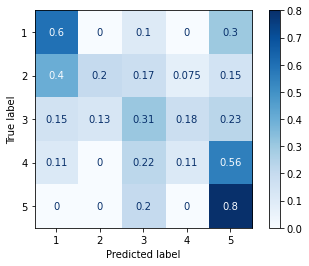

Figurative Set
Accuracy: 0.3333333333333333

              precision    recall  f1-score   support

           1     0.2105    0.6667    0.3200         6
           2     0.6667    0.2353    0.3478        17
           3     0.6667    0.3158    0.4286        19
           4     0.0000    0.0000    0.0000         6
           5     0.3333    0.6667    0.4444         6

    accuracy                         0.3333        54
   macro avg     0.3754    0.3769    0.3082        54
weighted avg     0.5049    0.3333    0.3452        54



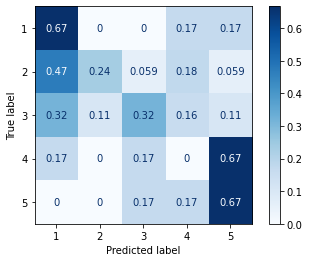

Qualifiers Set
Accuracy: 0.4594594594594595

              precision    recall  f1-score   support

           1     0.1111    1.0000    0.2000         1
           2     0.7143    0.3333    0.4545        15
           3     0.7692    0.5556    0.6452        18
           4     0.0000    0.0000    0.0000         1
           5     0.1667    0.5000    0.2500         2

    accuracy                         0.4595        37
   macro avg     0.3523    0.4778    0.3099        37
weighted avg     0.6758    0.4595    0.5171        37



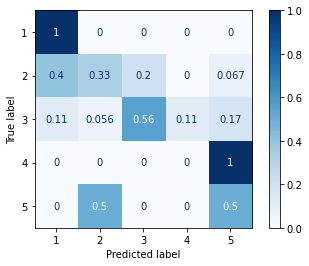

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



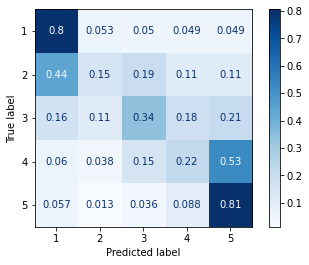

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

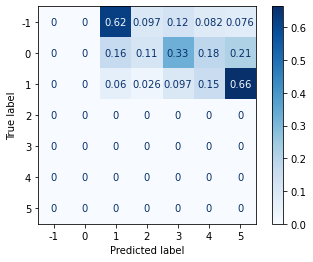

Contradictory Set
Accuracy: 0.2912621359223301

              precision    recall  f1-score   support

           1     0.2143    0.6000    0.3158        10
           2     0.7000    0.1750    0.2800        40
           3     0.5000    0.3077    0.3810        39
           4     0.0833    0.1111    0.0952         9
           5     0.1379    0.8000    0.2353         5

    accuracy                         0.2913       103
   macro avg     0.3271    0.3988    0.2615       103
weighted avg     0.4959    0.2913    0.3034       103



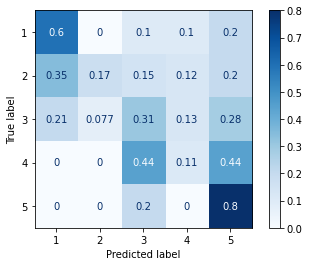

Figurative Set
Accuracy: 0.4074074074074074

              precision    recall  f1-score   support

           1     0.2857    0.6667    0.4000         6
           2     0.6667    0.3529    0.4615        17
           3     0.7500    0.3158    0.4444        19
           4     0.1250    0.1667    0.1429         6
           5     0.3333    0.8333    0.4762         6

    accuracy                         0.4074        54
   macro avg     0.4321    0.4671    0.3850        54
weighted avg     0.5564    0.4074    0.4149        54



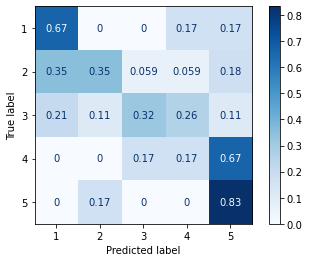

Qualifiers Set
Accuracy: 0.32432432432432434

              precision    recall  f1-score   support

           1     0.1111    1.0000    0.2000         1
           2     0.4286    0.2000    0.2727        15
           3     0.7500    0.3333    0.4615        18
           4     0.2000    1.0000    0.3333         1
           5     0.1250    0.5000    0.2000         2

    accuracy                         0.3243        37
   macro avg     0.3229    0.6067    0.2935        37
weighted avg     0.5538    0.3243    0.3603        37



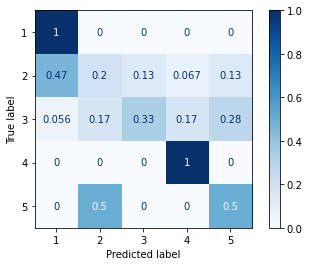

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



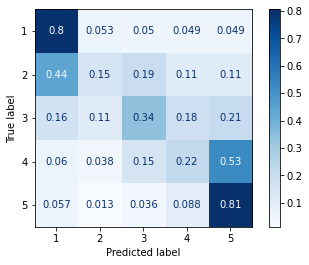

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

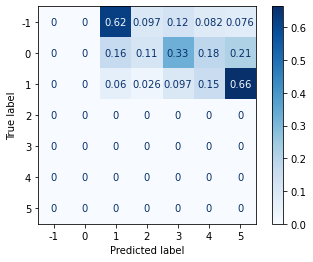

Contradictory Set
Accuracy: 0.2912621359223301

              precision    recall  f1-score   support

           1     0.2121    0.7000    0.3256        10
           2     0.5714    0.1000    0.1702        40
           3     0.5417    0.3333    0.4127        39
           4     0.1250    0.2222    0.1600         9
           5     0.1739    0.8000    0.2857         5

    accuracy                         0.2913       103
   macro avg     0.3248    0.4311    0.2708       103
weighted avg     0.4670    0.2913    0.2818       103



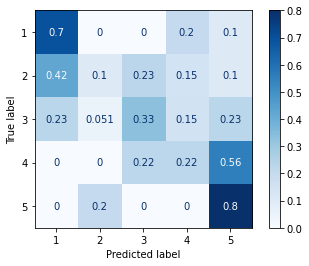

Figurative Set
Accuracy: 0.3333333333333333

              precision    recall  f1-score   support

           1     0.2778    0.8333    0.4167         6
           2     0.5000    0.0588    0.1053        17
           3     0.6667    0.3158    0.4286        19
           4     0.0000    0.0000    0.0000         6
           5     0.3158    1.0000    0.4800         6

    accuracy                         0.3333        54
   macro avg     0.3520    0.4416    0.2861        54
weighted avg     0.4579    0.3333    0.2836        54



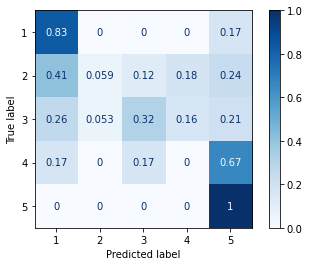

Qualifiers Set
Accuracy: 0.2972972972972973

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.5000    0.1333    0.2105        15
           3     0.5714    0.4444    0.5000        18
           4     0.0000    0.0000    0.0000         1
           5     0.1429    0.5000    0.2222         2

    accuracy                         0.2973        37
   macro avg     0.2429    0.2156    0.1865        37
weighted avg     0.4884    0.2973    0.3406        37



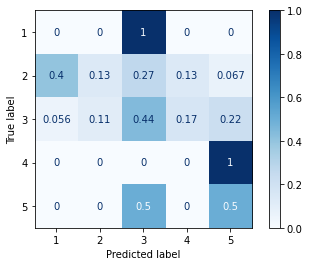

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



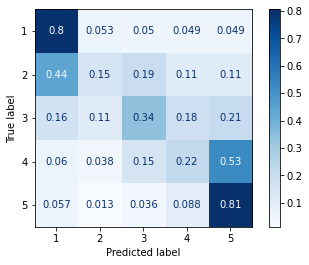

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

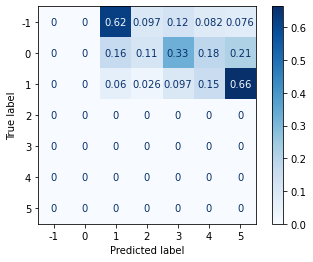

Contradictory Set
Accuracy: 0.2912621359223301

              precision    recall  f1-score   support

           1     0.1818    0.6000    0.2791        10
           2     0.5000    0.1500    0.2308        40
           3     0.4583    0.2821    0.3492        39
           4     0.2500    0.3333    0.2857         9
           5     0.1818    0.8000    0.2963         5

    accuracy                         0.2913       103
   macro avg     0.3144    0.4331    0.2882       103
weighted avg     0.4160    0.2913    0.2883       103



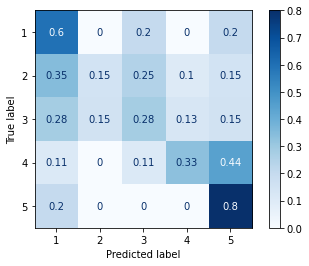

Figurative Set
Accuracy: 0.37037037037037035

              precision    recall  f1-score   support

           1     0.2000    0.6667    0.3077         6
           2     0.5714    0.2353    0.3333        17
           3     0.8571    0.3158    0.4615        19
           4     0.2000    0.1667    0.1818         6
           5     0.3333    0.8333    0.4762         6

    accuracy                         0.3704        54
   macro avg     0.4324    0.4436    0.3521        54
weighted avg     0.5630    0.3704    0.3746        54



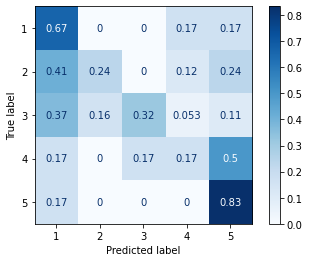

Qualifiers Set
Accuracy: 0.40540540540540543

              precision    recall  f1-score   support

           1     0.1250    1.0000    0.2222         1
           2     0.5000    0.2667    0.3478        15
           3     0.6923    0.5000    0.5806        18
           4     0.0000    0.0000    0.0000         1
           5     0.1667    0.5000    0.2500         2

    accuracy                         0.4054        37
   macro avg     0.2968    0.4533    0.2801        37
weighted avg     0.5519    0.4054    0.4430        37



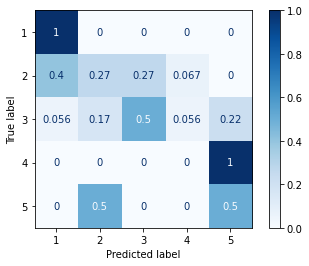

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



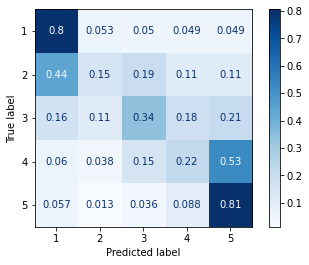

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

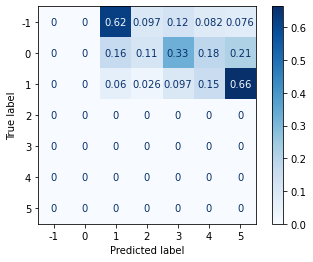

Contradictory Set
Accuracy: 0.2524271844660194

              precision    recall  f1-score   support

           1     0.1724    0.5000    0.2564        10
           2     0.4167    0.1250    0.1923        40
           3     0.4583    0.2821    0.3492        39
           4     0.1176    0.2222    0.1538         9
           5     0.1429    0.6000    0.2308         5

    accuracy                         0.2524       103
   macro avg     0.2616    0.3459    0.2365       103
weighted avg     0.3693    0.2524    0.2564       103



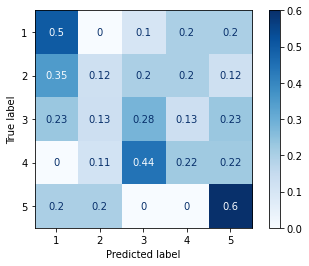

Figurative Set
Accuracy: 0.3333333333333333

              precision    recall  f1-score   support

           1     0.2143    0.5000    0.3000         6
           2     0.6667    0.3529    0.4615        17
           3     0.4444    0.2105    0.2857        19
           4     0.0000    0.0000    0.0000         6
           5     0.3333    0.8333    0.4762         6

    accuracy                         0.3333        54
   macro avg     0.3317    0.3794    0.3047        54
weighted avg     0.4271    0.3333    0.3321        54



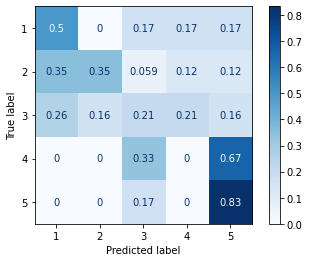

Qualifiers Set
Accuracy: 0.32432432432432434

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.5000    0.2667    0.3478        15
           3     0.6667    0.4444    0.5333        18
           4     0.0000    0.0000    0.0000         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.3243        37
   macro avg     0.2333    0.1422    0.1762        37
weighted avg     0.5270    0.3243    0.4005        37



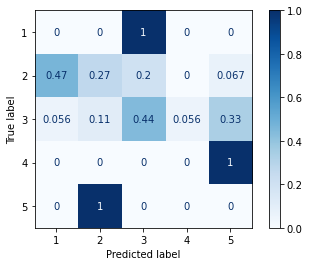

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



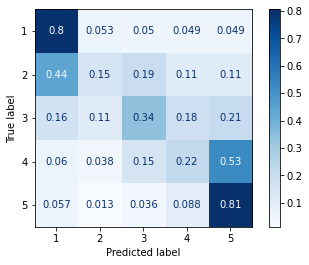

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

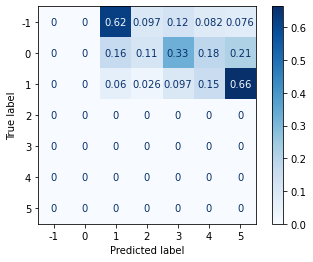

Contradictory Set
Accuracy: 0.2912621359223301

              precision    recall  f1-score   support

           1     0.2308    0.6000    0.3333        10
           2     0.7500    0.1500    0.2500        40
           3     0.5417    0.3333    0.4127        39
           4     0.0952    0.2222    0.1333         9
           5     0.1250    0.6000    0.2069         5

    accuracy                         0.2913       103
   macro avg     0.3485    0.3811    0.2673       103
weighted avg     0.5332    0.2913    0.3074       103



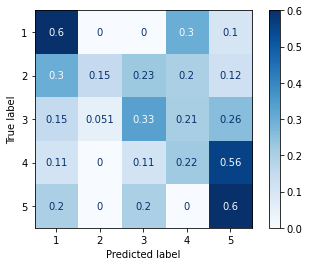

Figurative Set
Accuracy: 0.37037037037037035

              precision    recall  f1-score   support

           1     0.2105    0.6667    0.3200         6
           2     1.0000    0.2941    0.4545        17
           3     0.7143    0.2632    0.3846        19
           4     0.0000    0.0000    0.0000         6
           5     0.3750    1.0000    0.5455         6

    accuracy                         0.3704        54
   macro avg     0.4600    0.4448    0.3409        54
weighted avg     0.6312    0.3704    0.3746        54



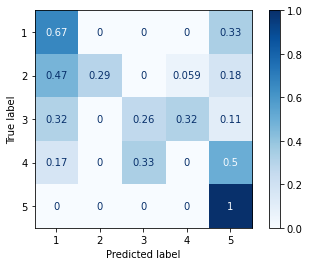

Qualifiers Set
Accuracy: 0.24324324324324326

              precision    recall  f1-score   support

           1     0.1000    1.0000    0.1818         1
           2     0.2500    0.0667    0.1053        15
           3     0.4545    0.2778    0.3448        18
           4     0.2500    1.0000    0.4000         1
           5     0.1250    0.5000    0.2000         2

    accuracy                         0.2432        37
   macro avg     0.2359    0.5689    0.2464        37
weighted avg     0.3387    0.2432    0.2370        37



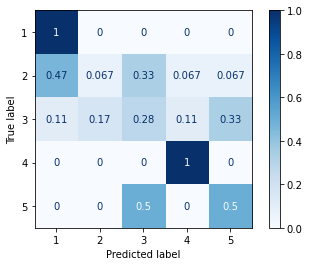

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



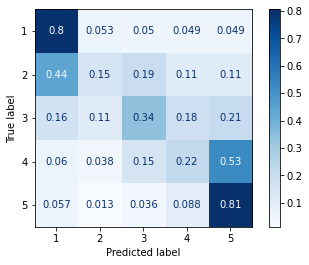

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

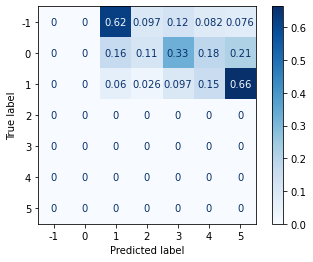

Contradictory Set
Accuracy: 0.32038834951456313

              precision    recall  f1-score   support

           1     0.2400    0.6000    0.3429        10
           2     0.6111    0.2750    0.3793        40
           3     0.5000    0.2821    0.3607        39
           4     0.0833    0.1111    0.0952         9
           5     0.1538    0.8000    0.2581         5

    accuracy                         0.3204       103
   macro avg     0.3177    0.4136    0.2872       103
weighted avg     0.4647    0.3204    0.3380       103



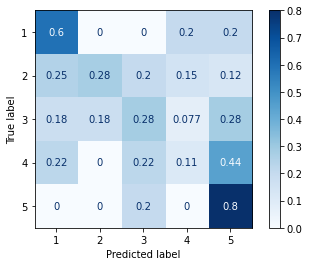

Figurative Set
Accuracy: 0.35185185185185186

              precision    recall  f1-score   support

           1     0.3125    0.8333    0.4545         6
           2     0.5000    0.1765    0.2609        17
           3     0.7500    0.3158    0.4444        19
           4     0.0000    0.0000    0.0000         6
           5     0.2778    0.8333    0.4167         6

    accuracy                         0.3519        54
   macro avg     0.3681    0.4318    0.3153        54
weighted avg     0.4869    0.3519    0.3353        54



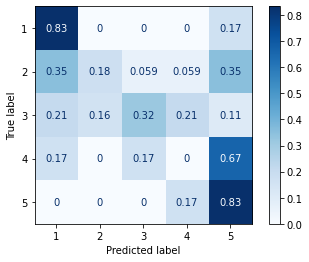

Qualifiers Set
Accuracy: 0.21621621621621623

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.5000    0.0667    0.1176        15
           3     0.5556    0.2778    0.3704        18
           4     0.1667    1.0000    0.2857         1
           5     0.1000    0.5000    0.1667         2

    accuracy                         0.2162        37
   macro avg     0.2644    0.3689    0.1881        37
weighted avg     0.4829    0.2162    0.2446        37



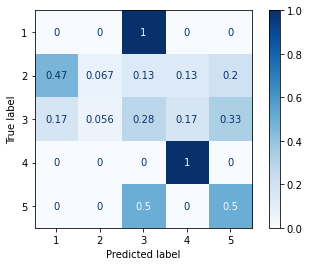

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



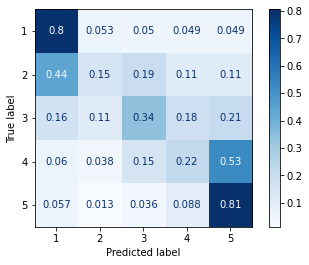

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

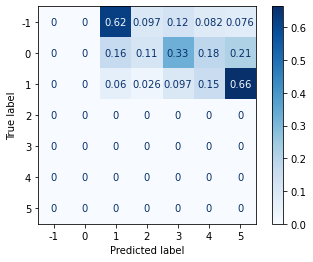

Contradictory Set
Accuracy: 0.3106796116504854

              precision    recall  f1-score   support

           1     0.2174    0.5000    0.3030        10
           2     0.5000    0.2500    0.3333        40
           3     0.5217    0.3077    0.3871        39
           4     0.1429    0.2222    0.1739         9
           5     0.1304    0.6000    0.2143         5

    accuracy                         0.3107       103
   macro avg     0.3025    0.3760    0.2823       103
weighted avg     0.4316    0.3107    0.3310       103



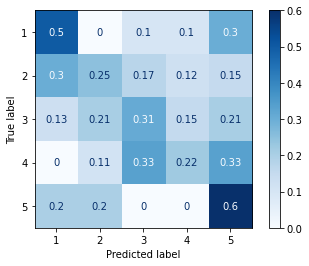

Figurative Set
Accuracy: 0.35185185185185186

              precision    recall  f1-score   support

           1     0.2632    0.8333    0.4000         6
           2     0.7500    0.1765    0.2857        17
           3     0.5000    0.3158    0.3871        19
           4     0.0000    0.0000    0.0000         6
           5     0.4545    0.8333    0.5882         6

    accuracy                         0.3519        54
   macro avg     0.3935    0.4318    0.3322        54
weighted avg     0.4918    0.3519    0.3360        54



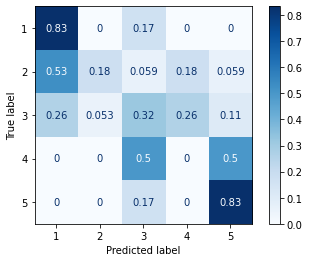

Qualifiers Set
Accuracy: 0.32432432432432434

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.3333    0.0667    0.1111        15
           3     0.6667    0.5556    0.6061        18
           4     0.0000    0.0000    0.0000         1
           5     0.1429    0.5000    0.2222         2

    accuracy                         0.3243        37
   macro avg     0.2286    0.2244    0.1879        37
weighted avg     0.4672    0.3243    0.3519        37



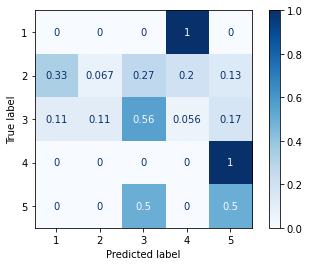

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



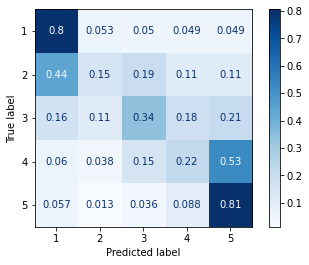

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

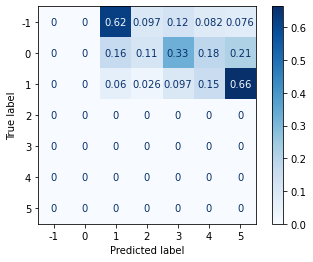

Contradictory Set
Accuracy: 0.22330097087378642

              precision    recall  f1-score   support

           1     0.1613    0.5000    0.2439        10
           2     0.4167    0.1250    0.1923        40
           3     0.4167    0.2564    0.3175        39
           4     0.0000    0.0000    0.0000         9
           5     0.1304    0.6000    0.2143         5

    accuracy                         0.2233       103
   macro avg     0.2250    0.2963    0.1936       103
weighted avg     0.3416    0.2233    0.2290       103



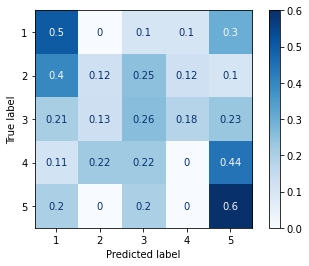

Figurative Set
Accuracy: 0.37037037037037035

              precision    recall  f1-score   support

           1     0.2105    0.6667    0.3200         6
           2     0.8333    0.2941    0.4348        17
           3     0.8333    0.2632    0.4000        19
           4     0.0000    0.0000    0.0000         6
           5     0.4286    1.0000    0.6000         6

    accuracy                         0.3704        54
   macro avg     0.4612    0.4448    0.3510        54
weighted avg     0.6266    0.3704    0.3798        54



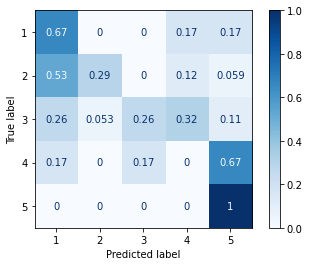

Qualifiers Set
Accuracy: 0.24324324324324326

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.4000    0.2667    0.3200        15
           3     0.5000    0.2222    0.3077        18
           4     0.0000    0.0000    0.0000         1
           5     0.1111    0.5000    0.1818         2

    accuracy                         0.2432        37
   macro avg     0.2022    0.1978    0.1619        37
weighted avg     0.4114    0.2432    0.2892        37



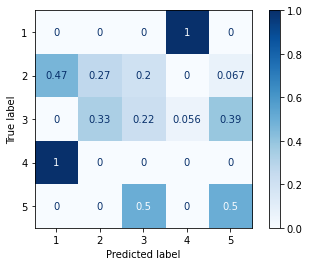

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



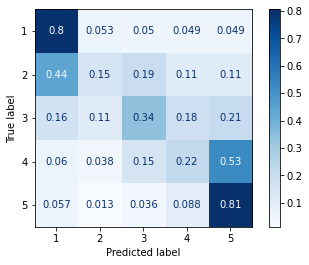

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

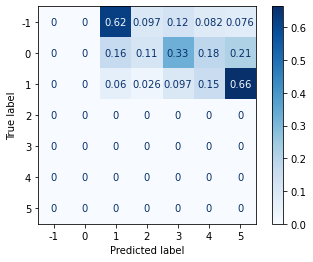

Contradictory Set
Accuracy: 0.22330097087378642

              precision    recall  f1-score   support

           1     0.1667    0.5000    0.2500        10
           2     0.2727    0.0750    0.1176        40
           3     0.4545    0.2564    0.3279        39
           4     0.1333    0.2222    0.1667         9
           5     0.1200    0.6000    0.2000         5

    accuracy                         0.2233       103
   macro avg     0.2295    0.3307    0.2124       103
weighted avg     0.3117    0.2233    0.2184       103



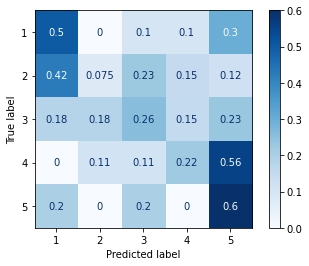

Figurative Set
Accuracy: 0.3888888888888889

              precision    recall  f1-score   support

           1     0.2353    0.6667    0.3478         6
           2     0.8333    0.2941    0.4348        17
           3     0.7500    0.3158    0.4444        19
           4     0.1250    0.1667    0.1429         6
           5     0.3333    0.8333    0.4762         6

    accuracy                         0.3889        54
   macro avg     0.4554    0.4553    0.3692        54
weighted avg     0.6033    0.3889    0.4007        54



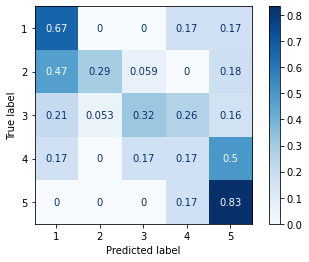

Qualifiers Set
Accuracy: 0.2702702702702703

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.4000    0.1333    0.2000        15
           3     0.5000    0.3889    0.4375        18
           4     0.0000    0.0000    0.0000         1
           5     0.1667    0.5000    0.2500         2

    accuracy                         0.2703        37
   macro avg     0.2133    0.2044    0.1775        37
weighted avg     0.4144    0.2703    0.3074        37



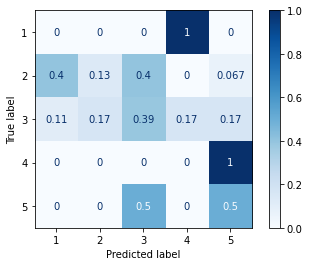

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



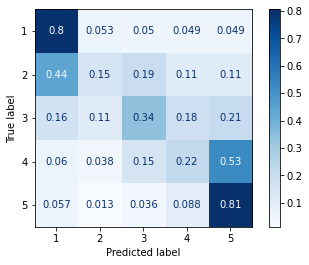

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

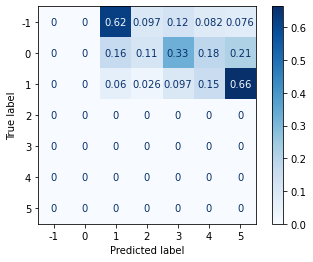

Contradictory Set
Accuracy: 0.27184466019417475

              precision    recall  f1-score   support

           1     0.2222    0.6000    0.3243        10
           2     0.5000    0.1250    0.2000        40
           3     0.4800    0.3077    0.3750        39
           4     0.0667    0.1111    0.0833         9
           5     0.1538    0.8000    0.2581         5

    accuracy                         0.2718       103
   macro avg     0.2845    0.3888    0.2481       103
weighted avg     0.4108    0.2718    0.2710       103



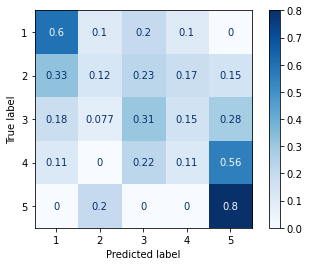

Figurative Set
Accuracy: 0.3888888888888889

              precision    recall  f1-score   support

           1     0.2308    0.5000    0.3158         6
           2     0.5556    0.2941    0.3846        17
           3     0.7000    0.3684    0.4828        19
           4     0.2000    0.1667    0.1818         6
           5     0.2941    0.8333    0.4348         6

    accuracy                         0.3889        54
   macro avg     0.3961    0.4325    0.3600        54
weighted avg     0.5017    0.3889    0.3945        54



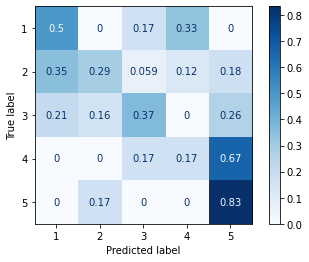

Qualifiers Set
Accuracy: 0.3783783783783784

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.6250    0.3333    0.4348        15
           3     0.6364    0.3889    0.4828        18
           4     0.5000    1.0000    0.6667         1
           5     0.1111    0.5000    0.1818         2

    accuracy                         0.3784        37
   macro avg     0.3745    0.4444    0.3532        37
weighted avg     0.5825    0.3784    0.4390        37



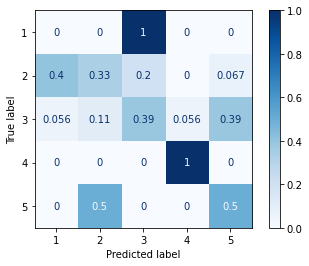

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



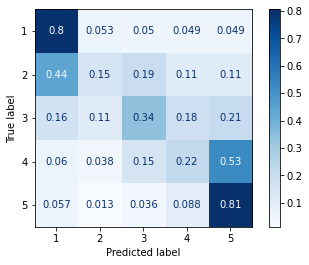

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

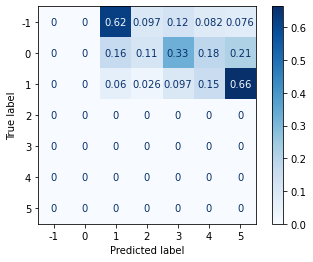

Contradictory Set
Accuracy: 0.27184466019417475

              precision    recall  f1-score   support

           1     0.1852    0.5000    0.2703        10
           2     0.6667    0.2000    0.3077        40
           3     0.4500    0.2308    0.3051        39
           4     0.1176    0.2222    0.1538         9
           5     0.1481    0.8000    0.2500         5

    accuracy                         0.2718       103
   macro avg     0.3135    0.3906    0.2574       103
weighted avg     0.4647    0.2718    0.2868       103



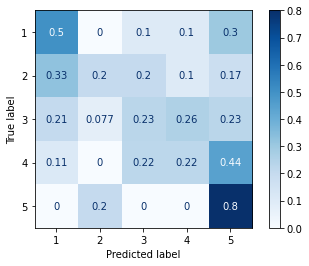

Figurative Set
Accuracy: 0.3888888888888889

              precision    recall  f1-score   support

           1     0.2667    0.6667    0.3810         6
           2     0.5000    0.2353    0.3200        17
           3     0.7500    0.3158    0.4444        19
           4     0.2500    0.3333    0.2857         6
           5     0.3333    0.8333    0.4762         6

    accuracy                         0.3889        54
   macro avg     0.4200    0.4769    0.3815        54
weighted avg     0.5157    0.3889    0.3841        54



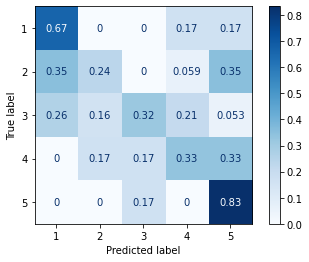

Qualifiers Set
Accuracy: 0.35135135135135137

              precision    recall  f1-score   support

           1     0.1000    1.0000    0.1818         1
           2     0.3636    0.2667    0.3077        15
           3     0.8000    0.4444    0.5714        18
           4     0.0000    0.0000    0.0000         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.3514        37
   macro avg     0.2527    0.3422    0.2122        37
weighted avg     0.5393    0.3514    0.4076        37



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

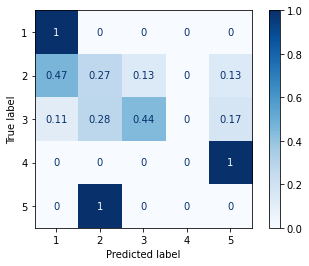

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



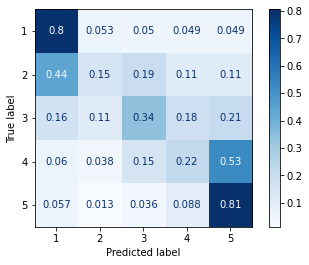

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

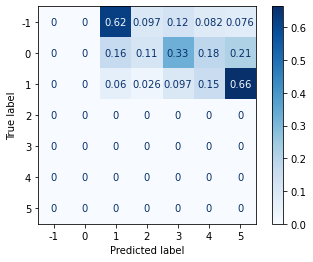

Contradictory Set
Accuracy: 0.2524271844660194

              precision    recall  f1-score   support

           1     0.1786    0.5000    0.2632        10
           2     0.5333    0.2000    0.2909        40
           3     0.4211    0.2051    0.2759        39
           4     0.1579    0.3333    0.2143         9
           5     0.0909    0.4000    0.1481         5

    accuracy                         0.2524       103
   macro avg     0.2764    0.3277    0.2385       103
weighted avg     0.4021    0.2524    0.2689       103



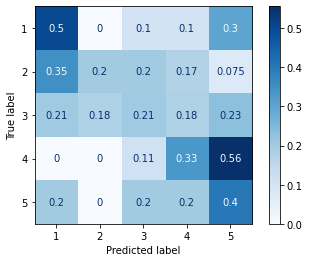

Figurative Set
Accuracy: 0.42592592592592593

              precision    recall  f1-score   support

           1     0.2500    0.6667    0.3636         6
           2     0.6667    0.2353    0.3478        17
           3     0.7273    0.4211    0.5333        19
           4     0.3750    0.5000    0.4286         6
           5     0.3077    0.6667    0.4211         6

    accuracy                         0.4259        54
   macro avg     0.4653    0.4979    0.4189        54
weighted avg     0.5694    0.4259    0.4320        54



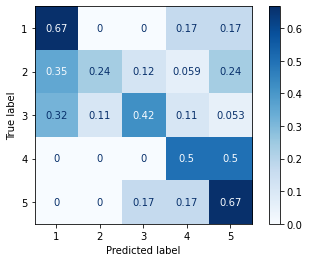

Qualifiers Set
Accuracy: 0.2972972972972973

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.6667    0.2667    0.3810        15
           3     0.6250    0.2778    0.3846        18
           4     0.0000    0.0000    0.0000         1
           5     0.1818    1.0000    0.3077         2

    accuracy                         0.2973        37
   macro avg     0.2947    0.3089    0.2147        37
weighted avg     0.5842    0.2973    0.3582        37



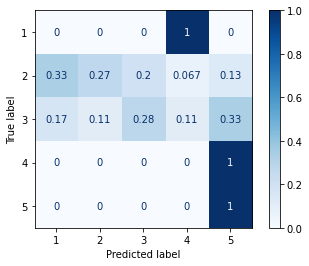

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



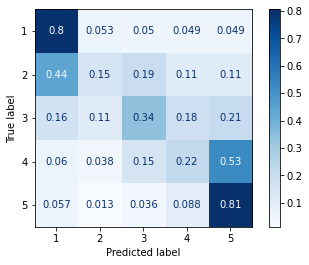

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

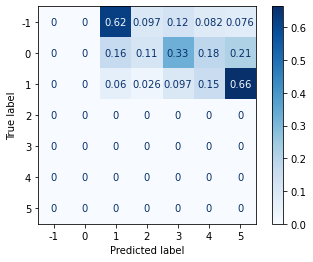

Contradictory Set
Accuracy: 0.2524271844660194

              precision    recall  f1-score   support

           1     0.2174    0.5000    0.3030        10
           2     0.3636    0.1000    0.1569        40
           3     0.4074    0.2821    0.3333        39
           4     0.1111    0.2222    0.1481         9
           5     0.1667    0.8000    0.2759         5

    accuracy                         0.2524       103
   macro avg     0.2532    0.3809    0.2434       103
weighted avg     0.3344    0.2524    0.2429       103



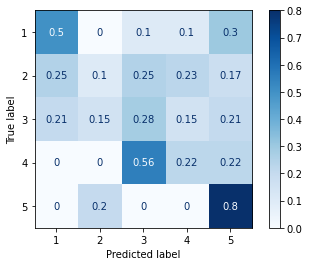

Figurative Set
Accuracy: 0.4444444444444444

              precision    recall  f1-score   support

           1     0.2778    0.8333    0.4167         6
           2     0.7500    0.1765    0.2857        17
           3     0.8333    0.5263    0.6452        19
           4     0.0000    0.0000    0.0000         6
           5     0.3750    1.0000    0.5455         6

    accuracy                         0.4444        54
   macro avg     0.4472    0.5072    0.3786        54
weighted avg     0.6019    0.4444    0.4239        54



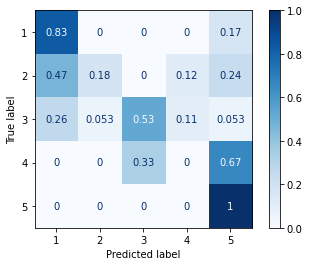

Qualifiers Set
Accuracy: 0.32432432432432434

              precision    recall  f1-score   support

           1     0.1000    1.0000    0.1818         1
           2     0.5000    0.2000    0.2857        15
           3     0.4615    0.3333    0.3871        18
           4     0.3333    1.0000    0.5000         1
           5     0.2000    0.5000    0.2857         2

    accuracy                         0.3243        37
   macro avg     0.3190    0.6067    0.3281        37
weighted avg     0.4498    0.3243    0.3380        37



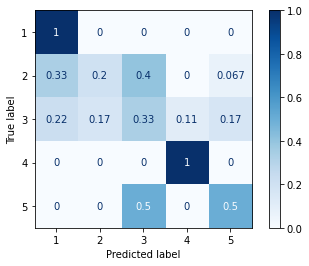

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



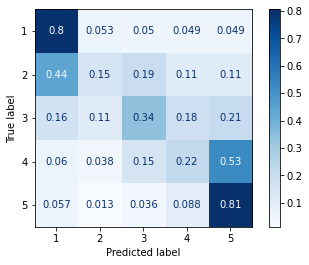

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

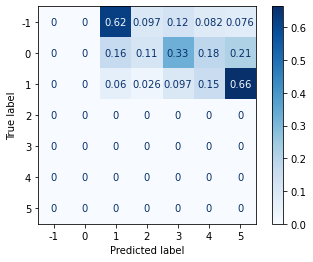

Contradictory Set
Accuracy: 0.2621359223300971

              precision    recall  f1-score   support

           1     0.1667    0.4000    0.2353        10
           2     0.6000    0.2250    0.3273        40
           3     0.4118    0.1795    0.2500        39
           4     0.1250    0.2222    0.1600         9
           5     0.1613    1.0000    0.2778         5

    accuracy                         0.2621       103
   macro avg     0.2929    0.4053    0.2501       103
weighted avg     0.4239    0.2621    0.2721       103



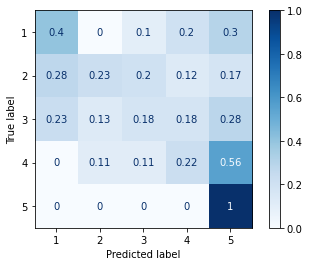

Figurative Set
Accuracy: 0.3333333333333333

              precision    recall  f1-score   support

           1     0.2500    0.6667    0.3636         6
           2     0.6000    0.1765    0.2727        17
           3     0.6667    0.3158    0.4286        19
           4     0.0000    0.0000    0.0000         6
           5     0.2941    0.8333    0.4348         6

    accuracy                         0.3333        54
   macro avg     0.3622    0.3985    0.2999        54
weighted avg     0.4839    0.3333    0.3254        54



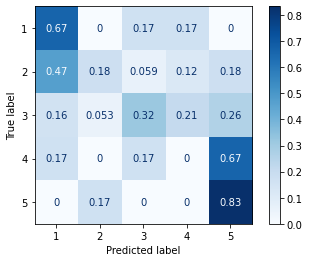

Qualifiers Set
Accuracy: 0.32432432432432434

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.7143    0.3333    0.4545        15
           3     0.5455    0.3333    0.4138        18
           4     0.0000    0.0000    0.0000         1
           5     0.1429    0.5000    0.2222         2

    accuracy                         0.3243        37
   macro avg     0.2805    0.2333    0.2181        37
weighted avg     0.5627    0.3243    0.3976        37



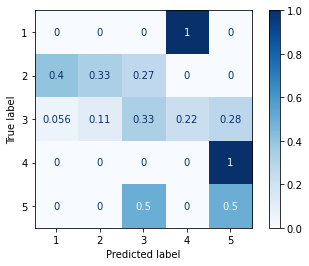

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



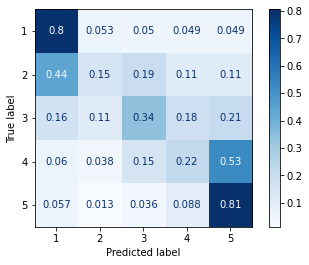

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

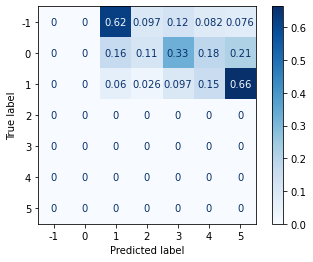

Contradictory Set
Accuracy: 0.23300970873786409

              precision    recall  f1-score   support

           1     0.2069    0.6000    0.3077        10
           2     0.4545    0.1250    0.1961        40
           3     0.4762    0.2564    0.3333        39
           4     0.0000    0.0000    0.0000         9
           5     0.1111    0.6000    0.1875         5

    accuracy                         0.2330       103
   macro avg     0.2497    0.3163    0.2049       103
weighted avg     0.3823    0.2330    0.2413       103



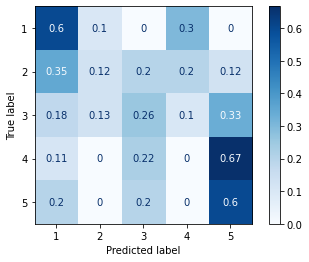

Figurative Set
Accuracy: 0.4074074074074074

              precision    recall  f1-score   support

           1     0.3333    0.8333    0.4762         6
           2     0.7143    0.2941    0.4167        17
           3     0.6364    0.3684    0.4667        19
           4     0.0000    0.0000    0.0000         6
           5     0.2941    0.8333    0.4348         6

    accuracy                         0.4074        54
   macro avg     0.3956    0.4658    0.3589        54
weighted avg     0.5185    0.4074    0.3966        54



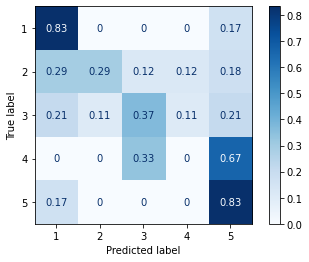

Qualifiers Set
Accuracy: 0.40540540540540543

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.5000    0.2000    0.2857        15
           3     0.6471    0.6111    0.6286        18
           4     0.0000    0.0000    0.0000         1
           5     0.1429    0.5000    0.2222         2

    accuracy                         0.4054        37
   macro avg     0.2580    0.2622    0.2273        37
weighted avg     0.5252    0.4054    0.4336        37



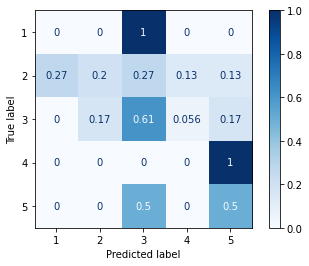

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



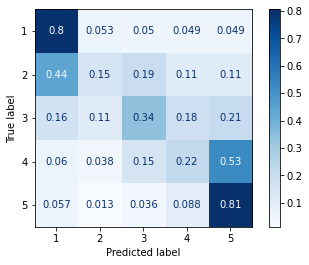

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

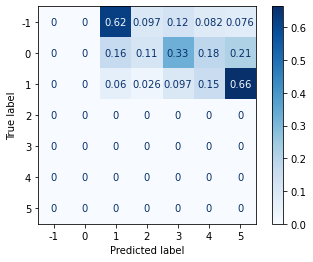

Contradictory Set
Accuracy: 0.24271844660194175

              precision    recall  f1-score   support

           1     0.1923    0.5000    0.2778        10
           2     0.4444    0.1000    0.1633        40
           3     0.4348    0.2564    0.3226        39
           4     0.1176    0.2222    0.1538         9
           5     0.1429    0.8000    0.2424         5

    accuracy                         0.2427       103
   macro avg     0.2664    0.3757    0.2320       103
weighted avg     0.3731    0.2427    0.2377       103



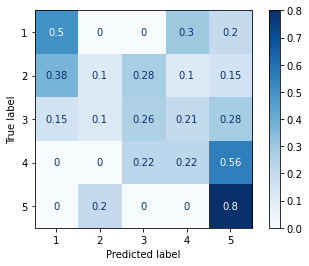

Figurative Set
Accuracy: 0.3148148148148148

              precision    recall  f1-score   support

           1     0.3125    0.8333    0.4545         6
           2     0.3333    0.0588    0.1000        17
           3     0.6667    0.3158    0.4286        19
           4     0.0000    0.0000    0.0000         6
           5     0.2500    0.8333    0.3846         6

    accuracy                         0.3148        54
   macro avg     0.3125    0.4083    0.2735        54
weighted avg     0.4020    0.3148    0.2755        54



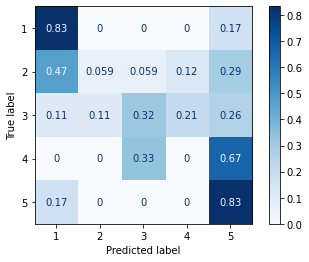

Qualifiers Set
Accuracy: 0.40540540540540543

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.5714    0.2667    0.3636        15
           3     0.6923    0.5000    0.5806        18
           4     0.2500    1.0000    0.4000         1
           5     0.2500    0.5000    0.3333         2

    accuracy                         0.4054        37
   macro avg     0.3527    0.4533    0.3355        37
weighted avg     0.5887    0.4054    0.4587        37



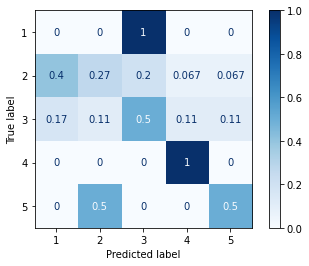

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



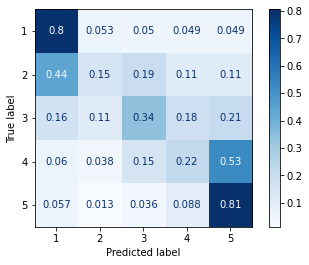

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

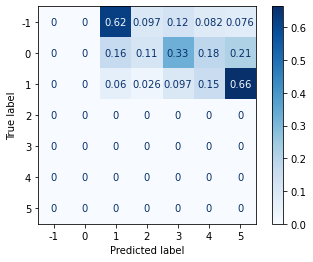

Contradictory Set
Accuracy: 0.2815533980582524

              precision    recall  f1-score   support

           1     0.1667    0.4000    0.2353        10
           2     0.6000    0.3000    0.4000        40
           3     0.3889    0.1795    0.2456        39
           4     0.1579    0.3333    0.2143         9
           5     0.1364    0.6000    0.2222         5

    accuracy                         0.2816       103
   macro avg     0.2900    0.3626    0.2635       103
weighted avg     0.4169    0.2816    0.3007       103



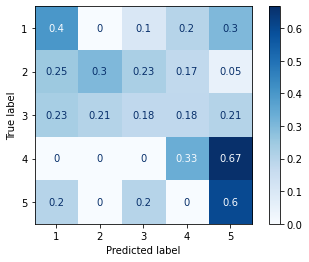

Figurative Set
Accuracy: 0.3888888888888889

              precision    recall  f1-score   support

           1     0.2632    0.8333    0.4000         6
           2     0.8000    0.2353    0.3636        17
           3     1.0000    0.3158    0.4800        19
           4     0.0000    0.0000    0.0000         6
           5     0.4000    1.0000    0.5714         6

    accuracy                         0.3889        54
   macro avg     0.4926    0.4769    0.3630        54
weighted avg     0.6774    0.3889    0.3913        54



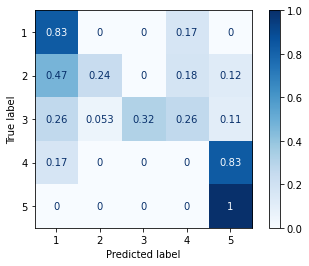

Qualifiers Set
Accuracy: 0.32432432432432434

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.6250    0.3333    0.4348        15
           3     0.5455    0.3333    0.4138        18
           4     0.0000    0.0000    0.0000         1
           5     0.1111    0.5000    0.1818         2

    accuracy                         0.3243        37
   macro avg     0.2563    0.2333    0.2061        37
weighted avg     0.5247    0.3243    0.3874        37



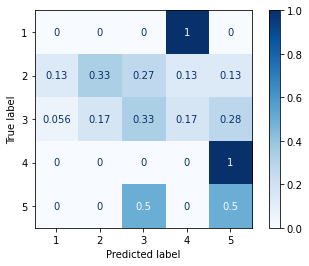

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



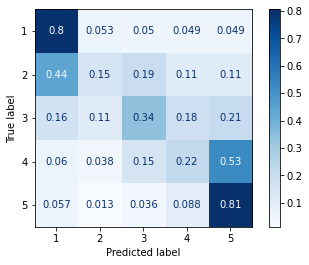

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

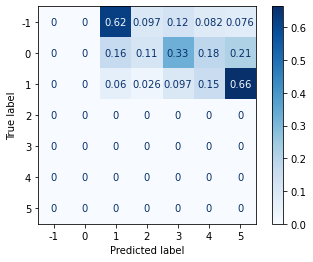

Contradictory Set
Accuracy: 0.2621359223300971

              precision    recall  f1-score   support

           1     0.1875    0.6000    0.2857        10
           2     0.4286    0.0750    0.1277        40
           3     0.5833    0.3590    0.4444        39
           4     0.0000    0.0000    0.0000         9
           5     0.1739    0.8000    0.2857         5

    accuracy                         0.2621       103
   macro avg     0.2747    0.3668    0.2287       103
weighted avg     0.4140    0.2621    0.2595       103



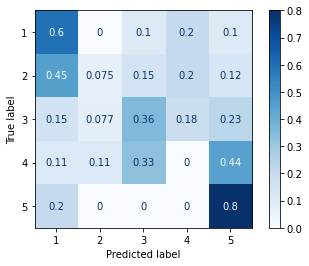

Figurative Set
Accuracy: 0.3888888888888889

              precision    recall  f1-score   support

           1     0.2500    0.6667    0.3636         6
           2     0.7500    0.1765    0.2857        17
           3     0.8182    0.4737    0.6000        19
           4     0.0000    0.0000    0.0000         6
           5     0.3125    0.8333    0.4545         6

    accuracy                         0.3889        54
   macro avg     0.4261    0.4300    0.3408        54
weighted avg     0.5865    0.3889    0.3920        54



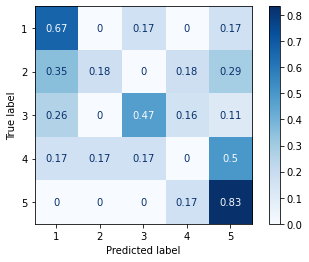

Qualifiers Set
Accuracy: 0.35135135135135137

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.5000    0.2000    0.2857        15
           3     0.6923    0.5000    0.5806        18
           4     0.0000    0.0000    0.0000         1
           5     0.1250    0.5000    0.2000         2

    accuracy                         0.3514        37
   macro avg     0.2635    0.2400    0.2133        37
weighted avg     0.5463    0.3514    0.4091        37



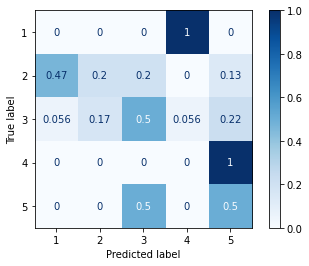

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



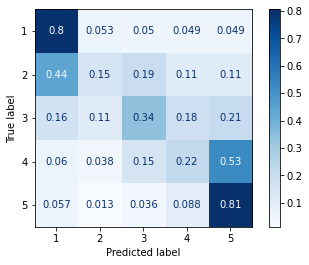

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

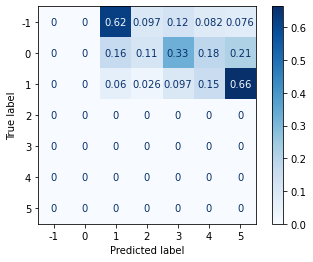

Contradictory Set
Accuracy: 0.2524271844660194

              precision    recall  f1-score   support

           1     0.1379    0.4000    0.2051        10
           2     0.4667    0.1750    0.2545        40
           3     0.4500    0.2308    0.3051        39
           4     0.1538    0.2222    0.1818         9
           5     0.1538    0.8000    0.2581         5

    accuracy                         0.2524       103
   macro avg     0.2725    0.3656    0.2409       103
weighted avg     0.3859    0.2524    0.2627       103



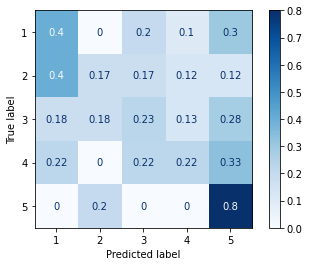

Figurative Set
Accuracy: 0.3333333333333333

              precision    recall  f1-score   support

           1     0.2353    0.6667    0.3478         6
           2     0.7500    0.1765    0.2857        17
           3     0.6667    0.3158    0.4286        19
           4     0.0000    0.0000    0.0000         6
           5     0.2632    0.8333    0.4000         6

    accuracy                         0.3333        54
   macro avg     0.3830    0.3985    0.2924        54
weighted avg     0.5261    0.3333    0.3238        54



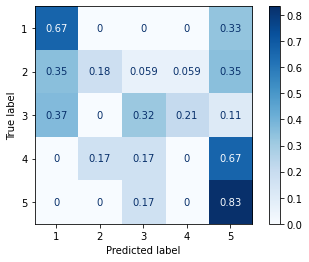

Qualifiers Set
Accuracy: 0.35135135135135137

              precision    recall  f1-score   support

           1     0.1111    1.0000    0.2000         1
           2     0.4444    0.2667    0.3333        15
           3     0.7000    0.3889    0.5000        18
           4     0.0000    0.0000    0.0000         1
           5     0.1429    0.5000    0.2222         2

    accuracy                         0.3514        37
   macro avg     0.2797    0.4311    0.2511        37
weighted avg     0.5314    0.3514    0.3958        37



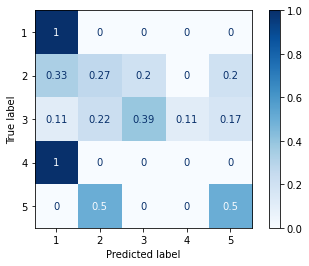

In [234]:
edges = clean_text(edges, 'text', 'text_clean')
edge_ = []*30
for i in range(30):
    x_contra, x_figurative, x_qual, y_contra, y_figurative, y_qual = extract_features_word_removal(edges.copy(deep=True))   
    edge_.append(evaluate_model(sgd, model_name="svm word removal"))

In [235]:
#svm word removal
edge = np.array(edge_)[:,2:]
print(stats.describe(edge[:,0]), stats.describe(edge[:,1]), stats.describe(edge[:,2]), sep="\n\n")

DescribeResult(nobs=30, minmax=(0.20388349514563106, 0.32038834951456313), mean=0.2647249190938512, variance=0.0008511532715120428, skewness=-0.013005714065287936, kurtosis=-0.6923440669318612)

DescribeResult(nobs=30, minmax=(0.3148148148148148, 0.4444444444444444), mean=0.3802469135802469, variance=0.0011525787174999607, skewness=-0.1052921550853985, kurtosis=-0.8377594921785079)

DescribeResult(nobs=30, minmax=(0.21621621621621623, 0.4594594594594595), mean=0.33963963963963967, variance=0.003762289782793045, skewness=0.13687187567866238, kurtosis=-0.41188890423355673)


Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



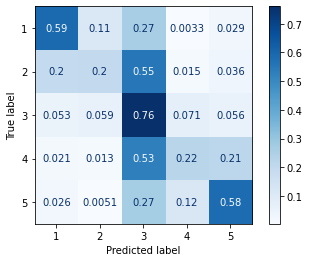

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

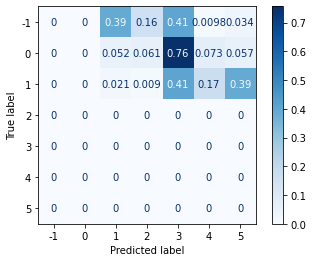

Contradictory Set
Accuracy: 0.4077669902912621

              precision    recall  f1-score   support

           1     0.2857    0.2000    0.2353        10
           2     0.7778    0.1750    0.2857        40
           3     0.4079    0.7949    0.5391        39
           4     0.0000    0.0000    0.0000         9
           5     0.2500    0.4000    0.3077         5

    accuracy                         0.4078       103
   macro avg     0.3443    0.3140    0.2736       103
weighted avg     0.4964    0.4078    0.3529       103



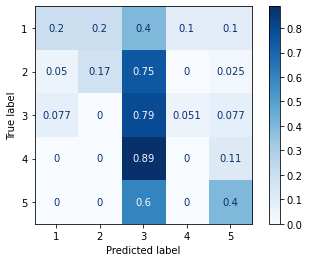

Figurative Set
Accuracy: 0.5

              precision    recall  f1-score   support

           1     0.4000    0.6667    0.5000         6
           2     0.7500    0.1765    0.2857        17
           3     0.5172    0.7895    0.6250        19
           4     0.5000    0.1667    0.2500         6
           5     0.4444    0.6667    0.5333         6

    accuracy                         0.5000        54
   macro avg     0.5223    0.4932    0.4388        54
weighted avg     0.5675    0.5000    0.4524        54



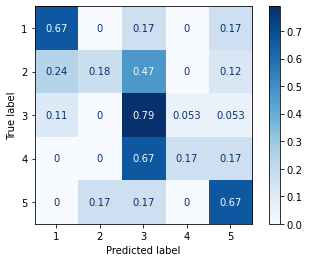

Qualifiers Set
Accuracy: 0.5135135135135135

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.6667    0.2667    0.3810        15
           3     0.5556    0.8333    0.6667        18
           4     0.0000    0.0000    0.0000         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.5135        37
   macro avg     0.2444    0.2200    0.2095        37
weighted avg     0.5405    0.5135    0.4788        37



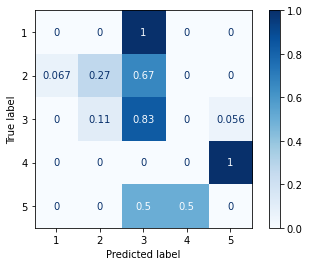

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



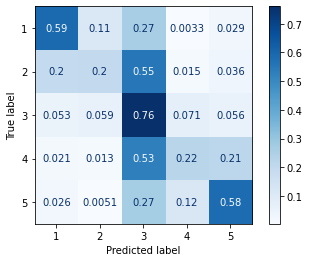

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

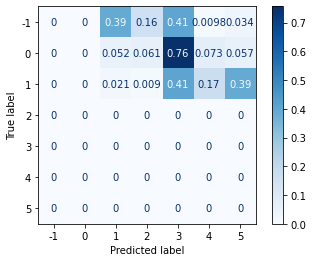

Contradictory Set
Accuracy: 0.36893203883495146

              precision    recall  f1-score   support

           1     0.3333    0.4000    0.3636        10
           2     0.6364    0.1750    0.2745        40
           3     0.3623    0.6410    0.4630        39
           4     0.0000    0.0000    0.0000         9
           5     0.2500    0.4000    0.3077         5

    accuracy                         0.3689       103
   macro avg     0.3164    0.3232    0.2818       103
weighted avg     0.4288    0.3689    0.3321       103



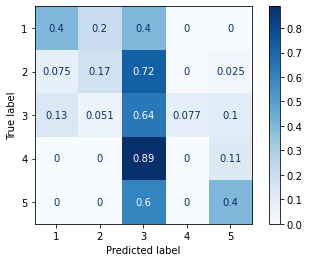

Figurative Set
Accuracy: 0.37037037037037035

              precision    recall  f1-score   support

           1     0.2727    0.5000    0.3529         6
           2     0.5000    0.1176    0.1905        17
           3     0.4615    0.6316    0.5333        19
           4     0.2000    0.1667    0.1818         6
           5     0.2500    0.3333    0.2857         6

    accuracy                         0.3704        54
   macro avg     0.3369    0.3498    0.3089        54
weighted avg     0.4001    0.3704    0.3388        54



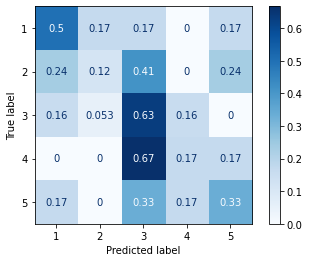

Qualifiers Set
Accuracy: 0.5675675675675675

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     1.0000    0.2000    0.3333        15
           3     0.5862    0.9444    0.7234        18
           4     1.0000    1.0000    1.0000         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.5676        37
   macro avg     0.5172    0.4289    0.4113        37
weighted avg     0.7176    0.5676    0.5141        37



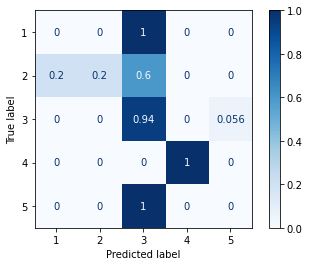

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



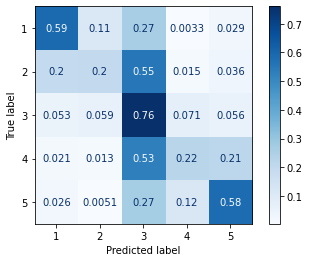

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

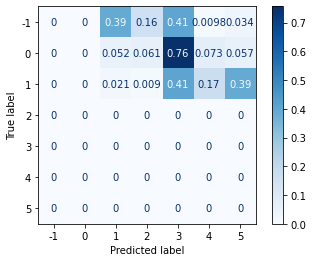

Contradictory Set
Accuracy: 0.39805825242718446

              precision    recall  f1-score   support

           1     0.2500    0.3000    0.2727        10
           2     0.8000    0.3000    0.4364        40
           3     0.3934    0.6154    0.4800        39
           4     0.0000    0.0000    0.0000         9
           5     0.1818    0.4000    0.2500         5

    accuracy                         0.3981       103
   macro avg     0.3251    0.3231    0.2878       103
weighted avg     0.4928    0.3981    0.3898       103



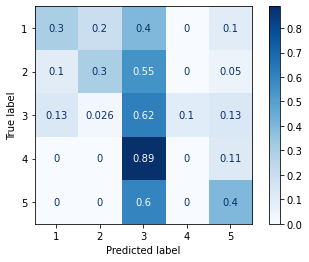

Figurative Set
Accuracy: 0.4444444444444444

              precision    recall  f1-score   support

           1     0.3333    0.6667    0.4444         6
           2     0.6667    0.1176    0.2000        17
           3     0.4643    0.6842    0.5532        19
           4     0.5000    0.1667    0.2500         6
           5     0.4444    0.6667    0.5333         6

    accuracy                         0.4444        54
   macro avg     0.4817    0.4604    0.3962        54
weighted avg     0.5152    0.4444    0.3940        54



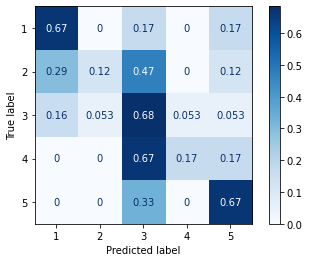

Qualifiers Set
Accuracy: 0.5405405405405406

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.8333    0.3333    0.4762        15
           3     0.5385    0.7778    0.6364        18
           4     0.2500    1.0000    0.4000         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.5405        37
   macro avg     0.3244    0.4222    0.3025        37
weighted avg     0.6065    0.5405    0.5134        37



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

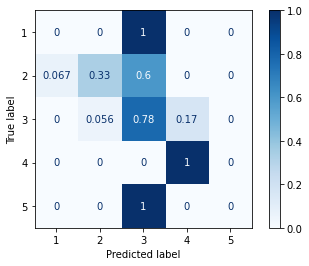

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



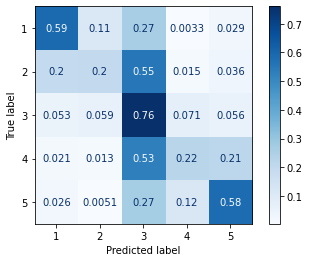

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

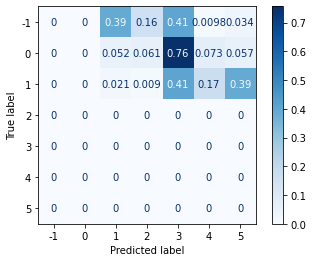

Contradictory Set
Accuracy: 0.4077669902912621

              precision    recall  f1-score   support

           1     0.3333    0.4000    0.3636        10
           2     0.6000    0.1500    0.2400        40
           3     0.4110    0.7692    0.5357        39
           4     0.0000    0.0000    0.0000         9
           5     0.5000    0.4000    0.4444         5

    accuracy                         0.4078       103
   macro avg     0.3689    0.3438    0.3168       103
weighted avg     0.4452    0.4078    0.3529       103



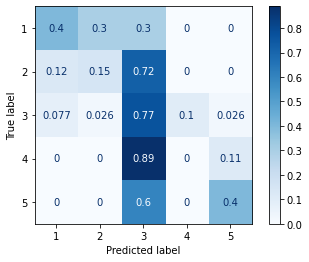

Figurative Set
Accuracy: 0.42592592592592593

              precision    recall  f1-score   support

           1     0.3750    0.5000    0.4286         6
           2     0.7143    0.2941    0.4167        17
           3     0.3871    0.6316    0.4800        19
           4     0.0000    0.0000    0.0000         6
           5     0.5000    0.5000    0.5000         6

    accuracy                         0.4259        54
   macro avg     0.3953    0.3851    0.3650        54
weighted avg     0.4583    0.4259    0.4032        54



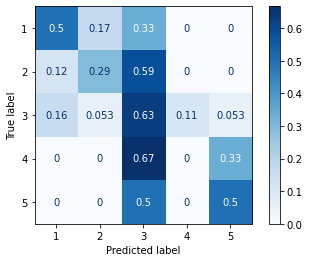

Qualifiers Set
Accuracy: 0.5405405405405406

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.6667    0.2667    0.3810        15
           3     0.5556    0.8333    0.6667        18
           4     1.0000    1.0000    1.0000         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.5405        37
   macro avg     0.4444    0.4200    0.4095        37
weighted avg     0.5676    0.5405    0.5058        37



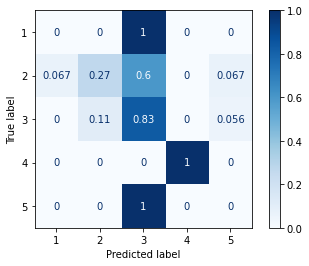

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



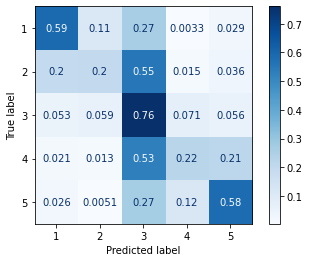

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

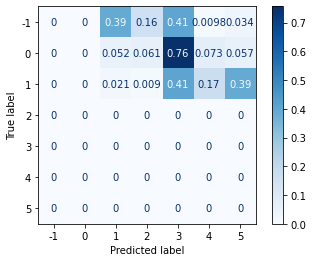

Contradictory Set
Accuracy: 0.4174757281553398

              precision    recall  f1-score   support

           1     0.3000    0.3000    0.3000        10
           2     0.6471    0.2750    0.3860        40
           3     0.4127    0.6667    0.5098        39
           4     0.1667    0.1111    0.1333         9
           5     0.2857    0.4000    0.3333         5

    accuracy                         0.4175       103
   macro avg     0.3624    0.3506    0.3325       103
weighted avg     0.4651    0.4175    0.3999       103



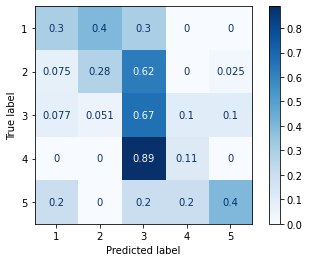

Figurative Set
Accuracy: 0.4074074074074074

              precision    recall  f1-score   support

           1     0.2857    0.3333    0.3077         6
           2     0.6250    0.2941    0.4000        17
           3     0.4074    0.5789    0.4783        19
           4     0.0000    0.0000    0.0000         6
           5     0.4444    0.6667    0.5333         6

    accuracy                         0.4074        54
   macro avg     0.3525    0.3746    0.3439        54
weighted avg     0.4212    0.4074    0.3877        54



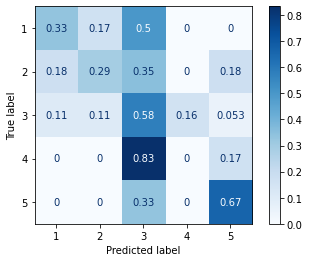

Qualifiers Set
Accuracy: 0.5405405405405406

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     1.0000    0.1333    0.2353        15
           3     0.5294    1.0000    0.6923        18
           4     0.0000    0.0000    0.0000         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.5405        37
   macro avg     0.3059    0.2267    0.1855        37
weighted avg     0.6630    0.5405    0.4322        37



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

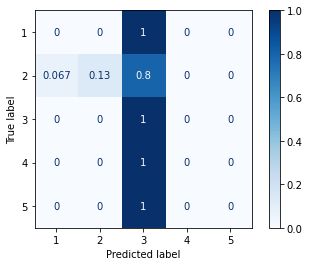

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



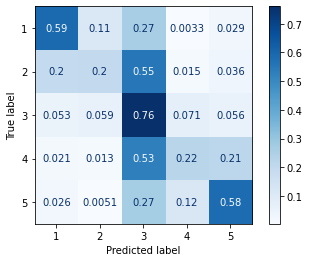

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

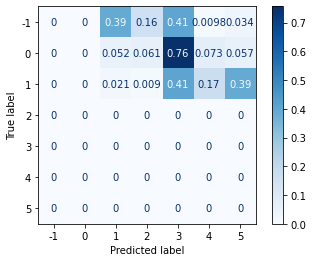

Contradictory Set
Accuracy: 0.4077669902912621

              precision    recall  f1-score   support

           1     0.3333    0.4000    0.3636        10
           2     0.5455    0.1500    0.2353        40
           3     0.4058    0.7179    0.5185        39
           4     0.2000    0.1111    0.1429         9
           5     0.5000    0.6000    0.5455         5

    accuracy                         0.4078       103
   macro avg     0.3969    0.3958    0.3612       103
weighted avg     0.4396    0.4078    0.3620       103



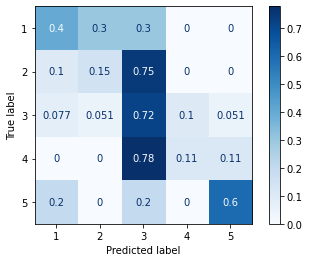

Figurative Set
Accuracy: 0.3888888888888889

              precision    recall  f1-score   support

           1     0.1667    0.1667    0.1667         6
           2     0.4000    0.1176    0.1818        17
           3     0.4483    0.6842    0.5417        19
           4     0.2500    0.1667    0.2000         6
           5     0.4000    0.6667    0.5000         6

    accuracy                         0.3889        54
   macro avg     0.3330    0.3604    0.3180        54
weighted avg     0.3744    0.3889    0.3441        54



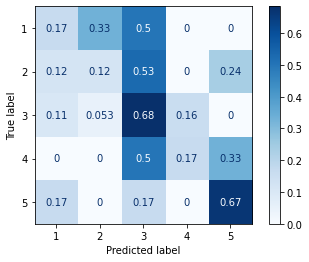

Qualifiers Set
Accuracy: 0.5675675675675675

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     1.0000    0.2667    0.4211        15
           3     0.5667    0.9444    0.7083        18
           4     0.0000    0.0000    0.0000         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.5676        37
   macro avg     0.3133    0.2422    0.2259        37
weighted avg     0.6811    0.5676    0.5153        37



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

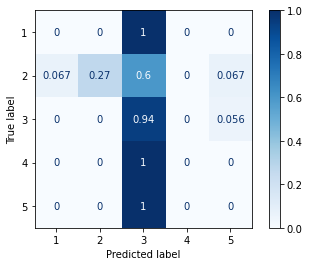

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



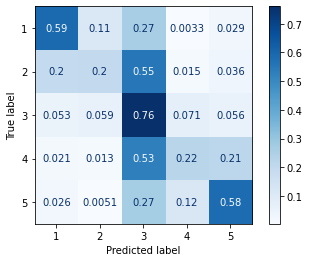

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

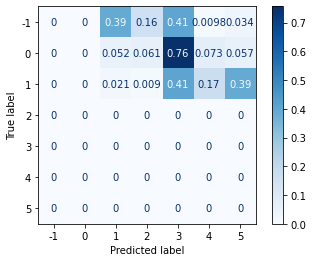

Contradictory Set
Accuracy: 0.42718446601941745

              precision    recall  f1-score   support

           1     0.2727    0.3000    0.2857        10
           2     0.8889    0.2000    0.3265        40
           3     0.4000    0.7692    0.5263        39
           4     0.0000    0.0000    0.0000         9
           5     0.7500    0.6000    0.6667         5

    accuracy                         0.4272       103
   macro avg     0.4623    0.3738    0.3610       103
weighted avg     0.5595    0.4272    0.3862       103



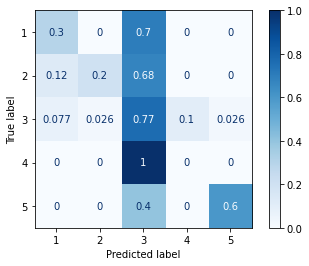

Figurative Set
Accuracy: 0.5185185185185185

              precision    recall  f1-score   support

           1     0.2500    0.3333    0.2857         6
           2     0.8750    0.4118    0.5600        17
           3     0.4643    0.6842    0.5532        19
           4     0.3333    0.1667    0.2222         6
           5     0.7143    0.8333    0.7692         6

    accuracy                         0.5185        54
   macro avg     0.5274    0.4859    0.4781        54
weighted avg     0.5830    0.5185    0.5128        54



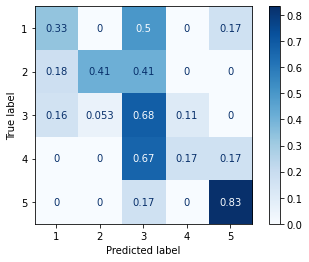

Qualifiers Set
Accuracy: 0.5945945945945946

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     1.0000    0.2667    0.4211        15
           3     0.6071    0.9444    0.7391        18
           4     0.5000    1.0000    0.6667         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.5946        37
   macro avg     0.4214    0.4422    0.3654        37
weighted avg     0.7143    0.5946    0.5483        37



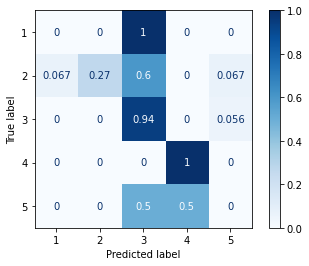

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



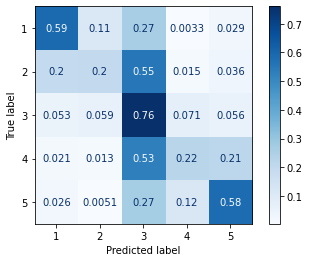

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

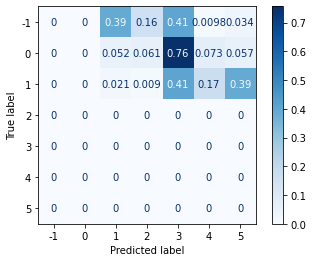

Contradictory Set
Accuracy: 0.44660194174757284

              precision    recall  f1-score   support

           1     0.2500    0.3000    0.2727        10
           2     0.8333    0.2500    0.3846        40
           3     0.4429    0.7949    0.5688        39
           4     0.0000    0.0000    0.0000         9
           5     0.4000    0.4000    0.4000         5

    accuracy                         0.4466       103
   macro avg     0.3852    0.3490    0.3252       103
weighted avg     0.5350    0.4466    0.4106       103



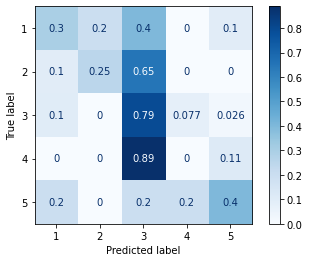

Figurative Set
Accuracy: 0.37037037037037035

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         6
           2     0.5000    0.1176    0.1905        17
           3     0.4000    0.6316    0.4898        19
           4     0.2500    0.1667    0.2000         6
           5     0.4167    0.8333    0.5556         6

    accuracy                         0.3704        54
   macro avg     0.3133    0.3498    0.2872        54
weighted avg     0.3722    0.3704    0.3163        54



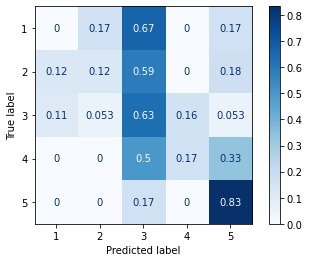

Qualifiers Set
Accuracy: 0.5135135135135135

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     1.0000    0.1333    0.2353        15
           3     0.5312    0.9444    0.6800        18
           4     0.0000    0.0000    0.0000         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.5135        37
   macro avg     0.3063    0.2156    0.1831        37
weighted avg     0.6639    0.5135    0.4262        37



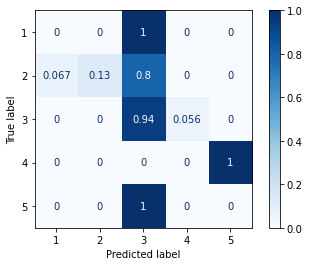

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



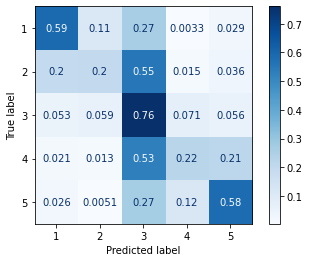

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

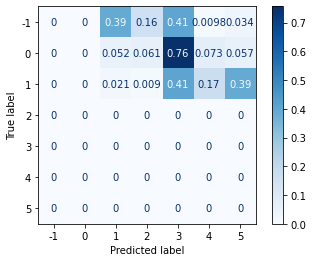

Contradictory Set
Accuracy: 0.44660194174757284

              precision    recall  f1-score   support

           1     0.3000    0.3000    0.3000        10
           2     0.7692    0.2500    0.3774        40
           3     0.4348    0.7692    0.5556        39
           4     0.2000    0.1111    0.1429         9
           5     0.3333    0.4000    0.3636         5

    accuracy                         0.4466       103
   macro avg     0.4075    0.3661    0.3479       103
weighted avg     0.5261    0.4466    0.4162       103



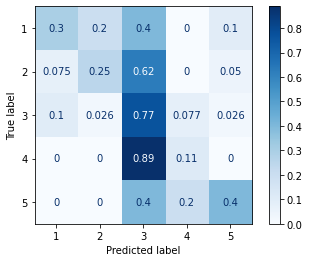

Figurative Set
Accuracy: 0.4444444444444444

              precision    recall  f1-score   support

           1     0.3333    0.5000    0.4000         6
           2     0.7143    0.2941    0.4167        17
           3     0.5385    0.7368    0.6222        19
           4     0.0000    0.0000    0.0000         6
           5     0.2000    0.3333    0.2500         6

    accuracy                         0.4444        54
   macro avg     0.3572    0.3729    0.3378        54
weighted avg     0.4736    0.4444    0.4223        54



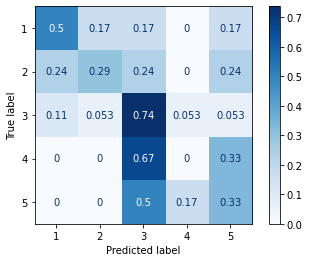

Qualifiers Set
Accuracy: 0.5675675675675675

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     1.0000    0.2667    0.4211        15
           3     0.5517    0.8889    0.6809        18
           4     0.5000    1.0000    0.6667         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.5676        37
   macro avg     0.4103    0.4311    0.3537        37
weighted avg     0.6873    0.5676    0.5199        37



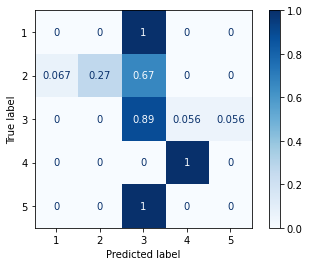

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



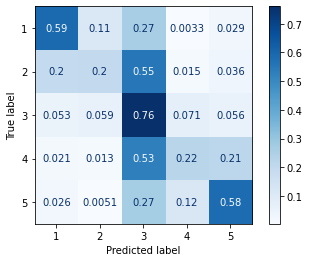

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

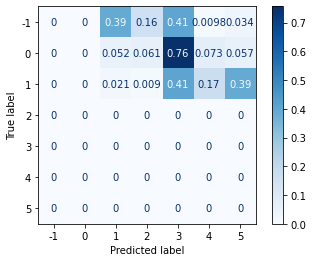

Contradictory Set
Accuracy: 0.4368932038834951

              precision    recall  f1-score   support

           1     0.2500    0.4000    0.3077        10
           2     0.8182    0.2250    0.3529        40
           3     0.4286    0.7692    0.5505        39
           4     0.0000    0.0000    0.0000         9
           5     0.6667    0.4000    0.5000         5

    accuracy                         0.4369       103
   macro avg     0.4327    0.3588    0.3422       103
weighted avg     0.5366    0.4369    0.3996       103



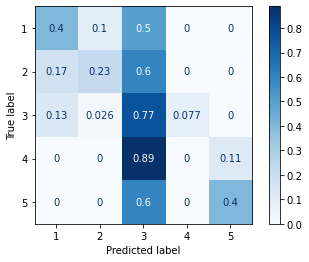

Figurative Set
Accuracy: 0.42592592592592593

              precision    recall  f1-score   support

           1     0.2727    0.5000    0.3529         6
           2     0.5000    0.1176    0.1905        17
           3     0.4615    0.6316    0.5333        19
           4     0.0000    0.0000    0.0000         6
           5     0.6000    1.0000    0.7500         6

    accuracy                         0.4259        54
   macro avg     0.3669    0.4498    0.3654        54
weighted avg     0.4168    0.4259    0.3702        54



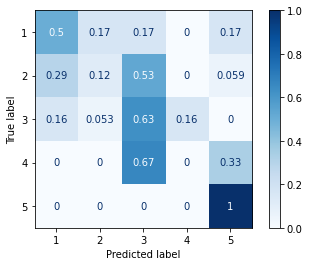

Qualifiers Set
Accuracy: 0.5405405405405406

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.7500    0.2000    0.3158        15
           3     0.5862    0.9444    0.7234        18
           4     0.0000    0.0000    0.0000         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.5405        37
   macro avg     0.2672    0.2289    0.2078        37
weighted avg     0.5892    0.5405    0.4799        37



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

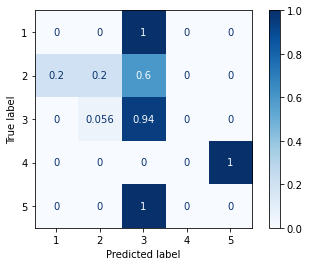

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



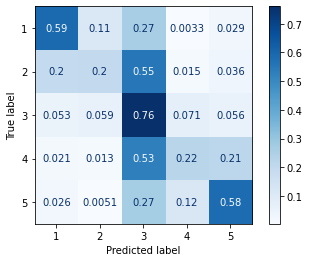

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

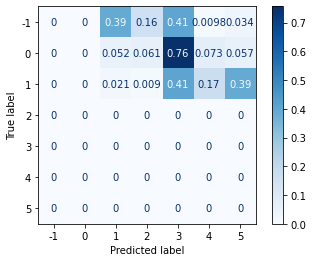

Contradictory Set
Accuracy: 0.4077669902912621

              precision    recall  f1-score   support

           1     0.1875    0.3000    0.2308        10
           2     0.8182    0.2250    0.3529        40
           3     0.4179    0.7179    0.5283        39
           4     0.0000    0.0000    0.0000         9
           5     0.4000    0.4000    0.4000         5

    accuracy                         0.4078       103
   macro avg     0.3647    0.3286    0.3024       103
weighted avg     0.5136    0.4078    0.3789       103



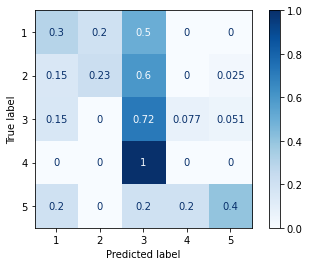

Figurative Set
Accuracy: 0.3888888888888889

              precision    recall  f1-score   support

           1     0.2000    0.3333    0.2500         6
           2     0.7500    0.1765    0.2857        17
           3     0.4643    0.6842    0.5532        19
           4     0.0000    0.0000    0.0000         6
           5     0.3333    0.5000    0.4000         6

    accuracy                         0.3889        54
   macro avg     0.3495    0.3388    0.2978        54
weighted avg     0.4587    0.3889    0.3568        54



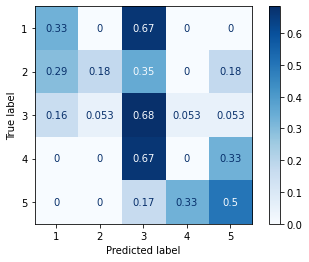

Qualifiers Set
Accuracy: 0.5135135135135135

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.7500    0.2000    0.3158        15
           3     0.5357    0.8333    0.6522        18
           4     0.5000    1.0000    0.6667         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.5135        37
   macro avg     0.3571    0.4067    0.3269        37
weighted avg     0.5782    0.5135    0.4633        37



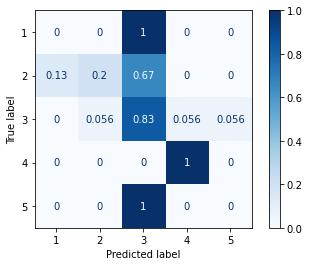

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



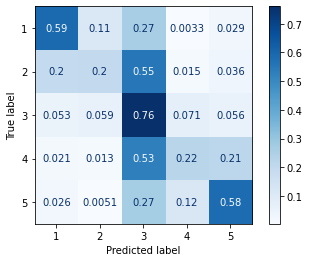

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

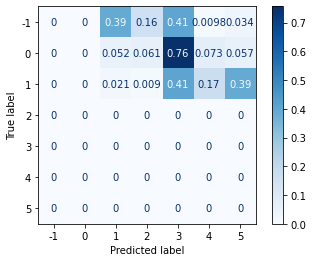

Contradictory Set
Accuracy: 0.4077669902912621

              precision    recall  f1-score   support

           1     0.1818    0.2000    0.1905        10
           2     0.6923    0.2250    0.3396        40
           3     0.4143    0.7436    0.5321        39
           4     0.0000    0.0000    0.0000         9
           5     0.2857    0.4000    0.3333         5

    accuracy                         0.4078       103
   macro avg     0.3148    0.3137    0.2791       103
weighted avg     0.4572    0.4078    0.3680       103



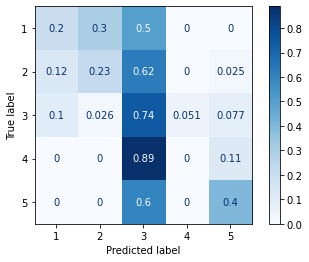

Figurative Set
Accuracy: 0.5185185185185185

              precision    recall  f1-score   support

           1     0.4000    0.6667    0.5000         6
           2     1.0000    0.3529    0.5217        17
           3     0.4667    0.7368    0.5714        19
           4     0.3333    0.1667    0.2222         6
           5     0.6000    0.5000    0.5455         6

    accuracy                         0.5185        54
   macro avg     0.5600    0.4846    0.4722        54
weighted avg     0.6272    0.5185    0.5062        54



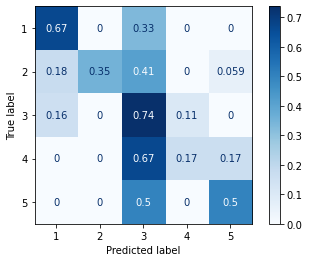

Qualifiers Set
Accuracy: 0.5405405405405406

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.6667    0.2667    0.3810        15
           3     0.5357    0.8333    0.6522        18
           4     1.0000    1.0000    1.0000         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.5405        37
   macro avg     0.4405    0.4200    0.4066        37
weighted avg     0.5579    0.5405    0.4987        37



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

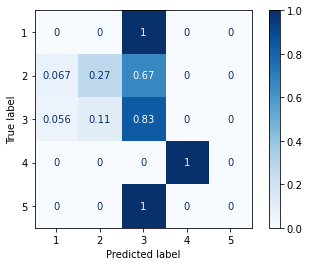

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



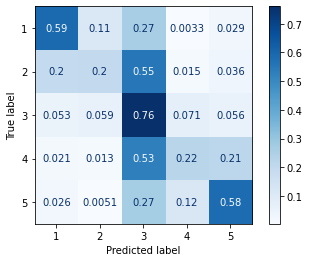

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

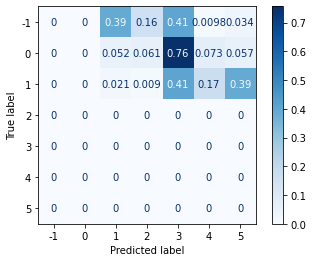

Contradictory Set
Accuracy: 0.4174757281553398

              precision    recall  f1-score   support

           1     0.2308    0.3000    0.2609        10
           2     0.7143    0.2500    0.3704        40
           3     0.4286    0.6923    0.5294        39
           4     0.0000    0.0000    0.0000         9
           5     0.3000    0.6000    0.4000         5

    accuracy                         0.4175       103
   macro avg     0.3347    0.3685    0.3121       103
weighted avg     0.4766    0.4175    0.3890       103



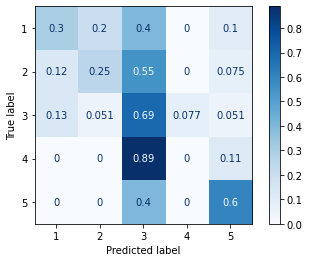

Figurative Set
Accuracy: 0.48148148148148145

              precision    recall  f1-score   support

           1     0.4000    0.6667    0.5000         6
           2     0.7143    0.2941    0.4167        17
           3     0.4643    0.6842    0.5532        19
           4     0.5000    0.1667    0.2500         6
           5     0.4286    0.5000    0.4615         6

    accuracy                         0.4815        54
   macro avg     0.5014    0.4623    0.4363        54
weighted avg     0.5358    0.4815    0.4604        54



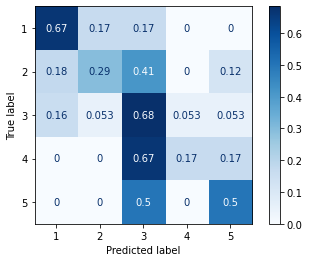

Qualifiers Set
Accuracy: 0.4864864864864865

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.6000    0.2000    0.3000        15
           3     0.5556    0.8333    0.6667        18
           4     0.0000    0.0000    0.0000         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.4865        37
   macro avg     0.2311    0.2067    0.1933        37
weighted avg     0.5135    0.4865    0.4459        37



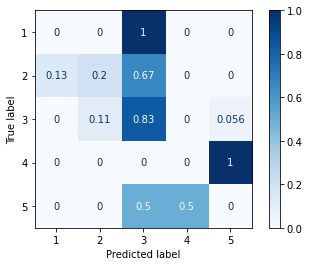

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



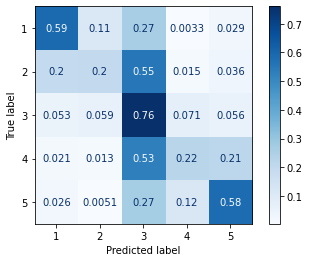

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

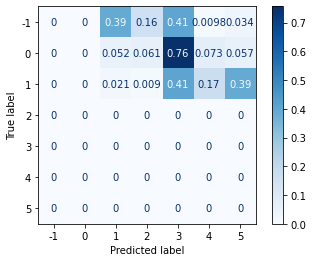

Contradictory Set
Accuracy: 0.4174757281553398

              precision    recall  f1-score   support

           1     0.2308    0.3000    0.2609        10
           2     0.9167    0.2750    0.4231        40
           3     0.3971    0.6923    0.5047        39
           4     0.0000    0.0000    0.0000         9
           5     0.4000    0.4000    0.4000         5

    accuracy                         0.4175       103
   macro avg     0.3889    0.3335    0.3177       103
weighted avg     0.5482    0.4175    0.4001       103



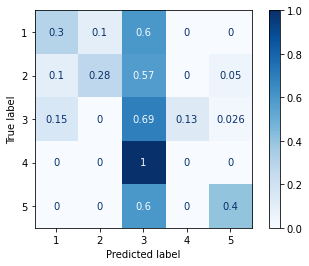

Figurative Set
Accuracy: 0.5

              precision    recall  f1-score   support

           1     0.3636    0.6667    0.4706         6
           2     0.7143    0.2941    0.4167        17
           3     0.5185    0.7368    0.6087        19
           4     0.5000    0.1667    0.2500         6
           5     0.4286    0.5000    0.4615         6

    accuracy                         0.5000        54
   macro avg     0.5050    0.4729    0.4415        54
weighted avg     0.5509    0.5000    0.4767        54



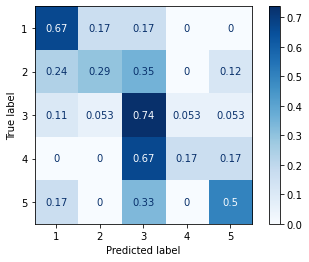

Qualifiers Set
Accuracy: 0.5135135135135135

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.8000    0.2667    0.4000        15
           3     0.5556    0.8333    0.6667        18
           4     0.0000    0.0000    0.0000         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.5135        37
   macro avg     0.2711    0.2200    0.2133        37
weighted avg     0.5946    0.5135    0.4865        37



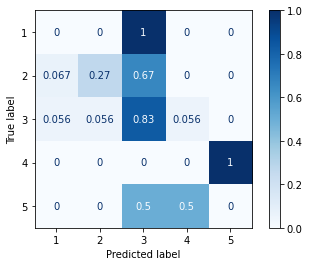

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



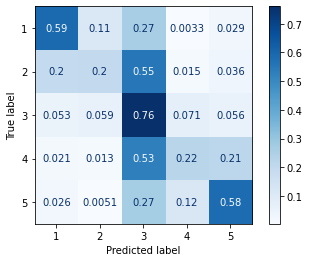

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

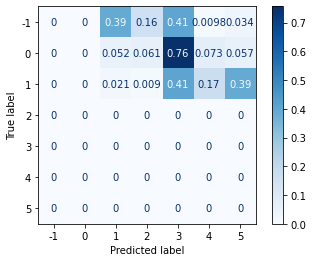

Contradictory Set
Accuracy: 0.3883495145631068

              precision    recall  f1-score   support

           1     0.2000    0.2000    0.2000        10
           2     0.5833    0.1750    0.2692        40
           3     0.3944    0.7179    0.5091        39
           4     0.0000    0.0000    0.0000         9
           5     0.4286    0.6000    0.5000         5

    accuracy                         0.3883       103
   macro avg     0.3213    0.3386    0.2957       103
weighted avg     0.4161    0.3883    0.3410       103



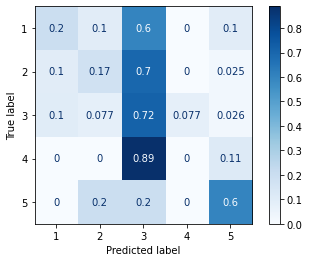

Figurative Set
Accuracy: 0.3888888888888889

              precision    recall  f1-score   support

           1     0.2500    0.3333    0.2857         6
           2     0.5714    0.2353    0.3333        17
           3     0.4000    0.6316    0.4898        19
           4     0.0000    0.0000    0.0000         6
           5     0.5000    0.5000    0.5000         6

    accuracy                         0.3889        54
   macro avg     0.3443    0.3400    0.3218        54
weighted avg     0.4040    0.3889    0.3646        54



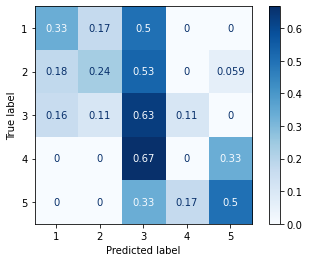

Qualifiers Set
Accuracy: 0.5405405405405406

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.6000    0.2000    0.3000        15
           3     0.5312    0.9444    0.6800        18
           4     0.0000    0.0000    0.0000         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.5405        37
   macro avg     0.2263    0.2289    0.1960        37
weighted avg     0.5017    0.5405    0.4524        37



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

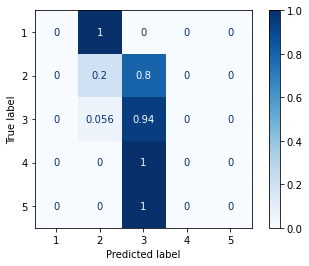

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



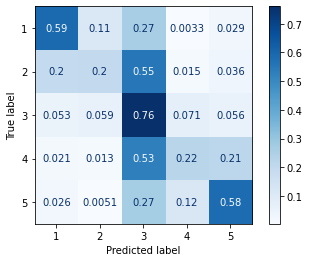

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

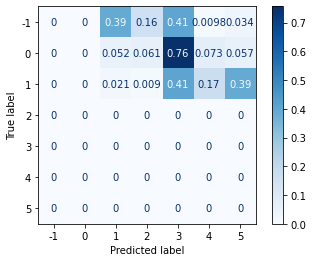

Contradictory Set
Accuracy: 0.4368932038834951

              precision    recall  f1-score   support

           1     0.3571    0.5000    0.4167        10
           2     0.7500    0.2250    0.3462        40
           3     0.4179    0.7179    0.5283        39
           4     0.2500    0.1111    0.1538         9
           5     0.3333    0.4000    0.3636         5

    accuracy                         0.4369       103
   macro avg     0.4217    0.3908    0.3617       103
weighted avg     0.5222    0.4369    0.4060       103



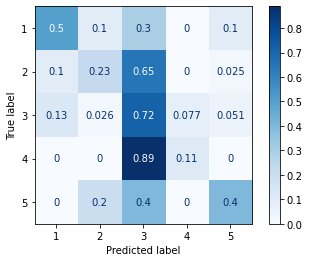

Figurative Set
Accuracy: 0.37037037037037035

              precision    recall  f1-score   support

           1     0.1111    0.1667    0.1333         6
           2     0.3333    0.1176    0.1739        17
           3     0.4483    0.6842    0.5417        19
           4     0.0000    0.0000    0.0000         6
           5     0.4444    0.6667    0.5333         6

    accuracy                         0.3704        54
   macro avg     0.2674    0.3270    0.2764        54
weighted avg     0.3244    0.3704    0.3194        54



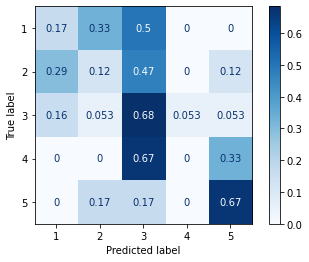

Qualifiers Set
Accuracy: 0.5945945945945946

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.7500    0.4000    0.5217        15
           3     0.6400    0.8889    0.7442        18
           4     0.0000    0.0000    0.0000         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.5946        37
   macro avg     0.2780    0.2578    0.2532        37
weighted avg     0.6154    0.5946    0.5736        37



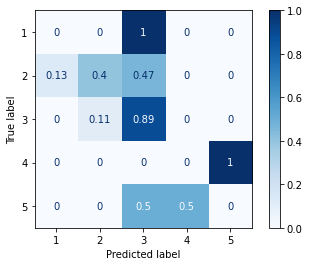

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



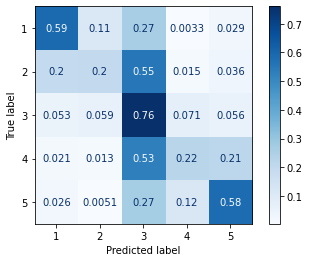

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

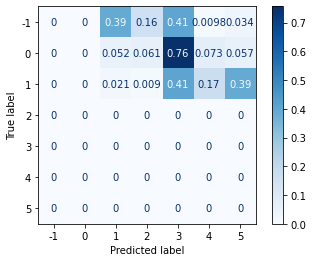

Contradictory Set
Accuracy: 0.33980582524271846

              precision    recall  f1-score   support

           1     0.2308    0.3000    0.2609        10
           2     0.5556    0.1250    0.2041        40
           3     0.3676    0.6410    0.4673        39
           4     0.0000    0.0000    0.0000         9
           5     0.2500    0.4000    0.3077         5

    accuracy                         0.3398       103
   macro avg     0.2808    0.2932    0.2480       103
weighted avg     0.3895    0.3398    0.2965       103



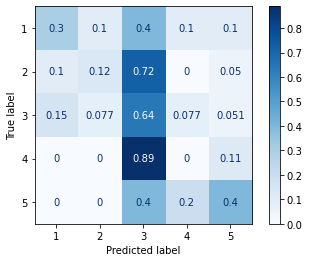

Figurative Set
Accuracy: 0.3888888888888889

              precision    recall  f1-score   support

           1     0.3636    0.6667    0.4706         6
           2     0.2500    0.0588    0.0952        17
           3     0.4815    0.6842    0.5652        19
           4     0.0000    0.0000    0.0000         6
           5     0.3333    0.5000    0.4000         6

    accuracy                         0.3889        54
   macro avg     0.2857    0.3819    0.3062        54
weighted avg     0.3256    0.3889    0.3256        54



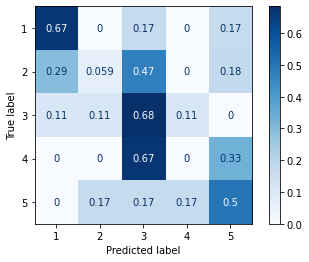

Qualifiers Set
Accuracy: 0.4864864864864865

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.5000    0.0667    0.1176        15
           3     0.5161    0.8889    0.6531        18
           4     1.0000    1.0000    1.0000         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.4865        37
   macro avg     0.4032    0.3911    0.3541        37
weighted avg     0.4808    0.4865    0.3924        37



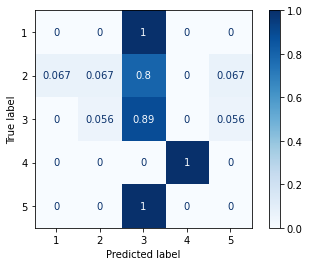

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



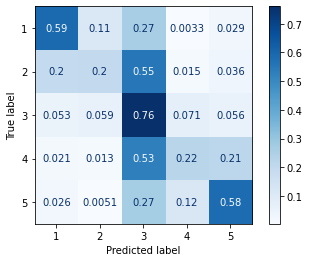

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

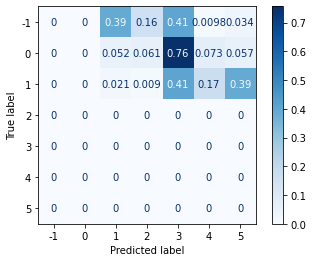

Contradictory Set
Accuracy: 0.3883495145631068

              precision    recall  f1-score   support

           1     0.1667    0.2000    0.1818        10
           2     0.7778    0.1750    0.2857        40
           3     0.4030    0.6923    0.5094        39
           4     0.1667    0.1111    0.1333         9
           5     0.3333    0.6000    0.4286         5

    accuracy                         0.3883       103
   macro avg     0.3695    0.3557    0.3078       103
weighted avg     0.5016    0.3883    0.3540       103



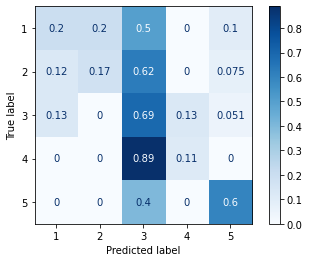

Figurative Set
Accuracy: 0.4074074074074074

              precision    recall  f1-score   support

           1     0.1429    0.1667    0.1538         6
           2     0.7500    0.1765    0.2857        17
           3     0.4444    0.8421    0.5818        19
           4     0.0000    0.0000    0.0000         6
           5     0.4000    0.3333    0.3636         6

    accuracy                         0.4074        54
   macro avg     0.3475    0.3037    0.2770        54
weighted avg     0.4528    0.4074    0.3522        54



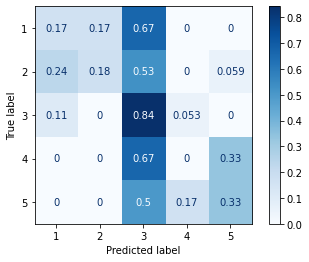

Qualifiers Set
Accuracy: 0.5405405405405406

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.6667    0.2667    0.3810        15
           3     0.5714    0.8889    0.6957        18
           4     0.0000    0.0000    0.0000         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.5405        37
   macro avg     0.2476    0.2311    0.2153        37
weighted avg     0.5483    0.5405    0.4929        37



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

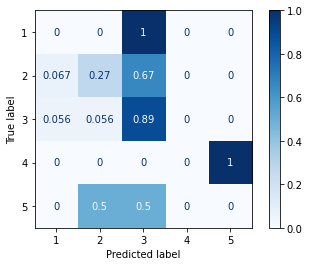

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



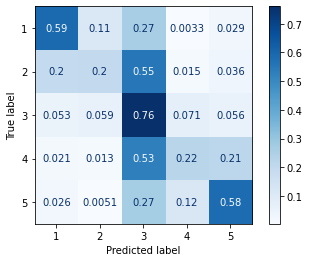

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

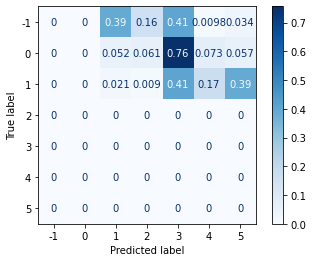

Contradictory Set
Accuracy: 0.4368932038834951

              precision    recall  f1-score   support

           1     0.2222    0.2000    0.2105        10
           2     0.6000    0.2250    0.3273        40
           3     0.4493    0.7949    0.5741        39
           4     0.5000    0.1111    0.1818         9
           5     0.2500    0.4000    0.3077         5

    accuracy                         0.4369       103
   macro avg     0.4043    0.3462    0.3203       103
weighted avg     0.4805    0.4369    0.3957       103



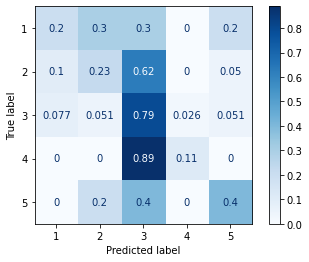

Figurative Set
Accuracy: 0.3888888888888889

              precision    recall  f1-score   support

           1     0.1250    0.1667    0.1429         6
           2     0.4000    0.1176    0.1818        17
           3     0.4333    0.6842    0.5306        19
           4     0.0000    0.0000    0.0000         6
           5     0.5556    0.8333    0.6667         6

    accuracy                         0.3889        54
   macro avg     0.3028    0.3604    0.3044        54
weighted avg     0.3540    0.3889    0.3339        54



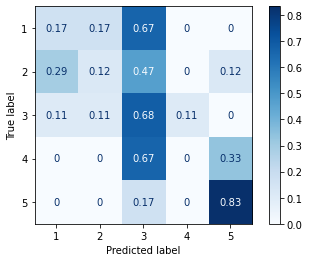

Qualifiers Set
Accuracy: 0.4864864864864865

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     1.0000    0.1333    0.2353        15
           3     0.5161    0.8889    0.6531        18
           4     0.0000    0.0000    0.0000         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.4865        37
   macro avg     0.3032    0.2044    0.1777        37
weighted avg     0.6565    0.4865    0.4131        37



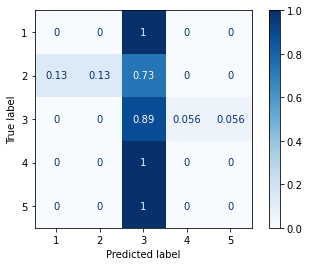

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



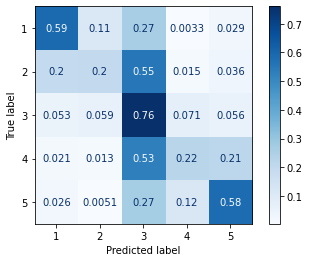

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

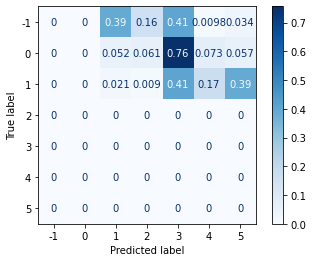

Contradictory Set
Accuracy: 0.4368932038834951

              precision    recall  f1-score   support

           1     0.2857    0.4000    0.3333        10
           2     0.8000    0.3000    0.4364        40
           3     0.4194    0.6667    0.5149        39
           4     0.0000    0.0000    0.0000         9
           5     0.3333    0.6000    0.4286         5

    accuracy                         0.4369       103
   macro avg     0.3677    0.3933    0.3426       103
weighted avg     0.5134    0.4369    0.4176       103



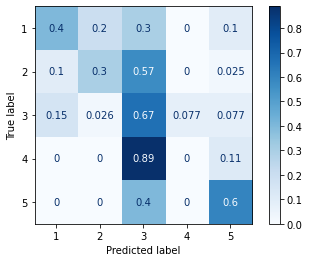

Figurative Set
Accuracy: 0.46296296296296297

              precision    recall  f1-score   support

           1     0.2500    0.3333    0.2857         6
           2     0.6667    0.3529    0.4615        17
           3     0.5000    0.7368    0.5957        19
           4     0.2500    0.1667    0.2000         6
           5     0.4000    0.3333    0.3636         6

    accuracy                         0.4630        54
   macro avg     0.4133    0.3846    0.3813        54
weighted avg     0.4858    0.4630    0.4493        54



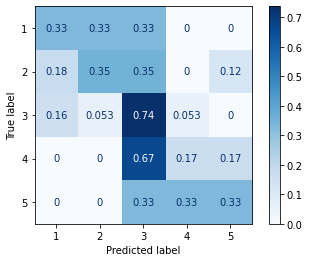

Qualifiers Set
Accuracy: 0.5405405405405406

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     1.0000    0.2667    0.4211        15
           3     0.5714    0.8889    0.6957        18
           4     0.0000    0.0000    0.0000         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.5405        37
   macro avg     0.3143    0.2311    0.2233        37
weighted avg     0.6834    0.5405    0.5091        37



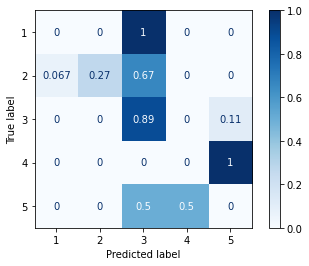

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



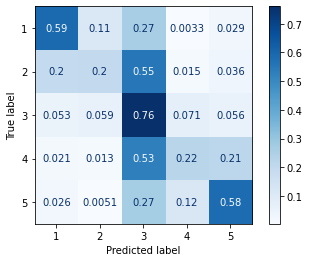

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

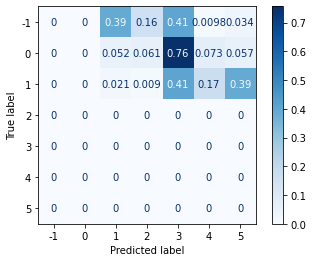

Contradictory Set
Accuracy: 0.39805825242718446

              precision    recall  f1-score   support

           1     0.2308    0.3000    0.2609        10
           2     0.7143    0.2500    0.3704        40
           3     0.4194    0.6667    0.5149        39
           4     0.0000    0.0000    0.0000         9
           5     0.2000    0.4000    0.2667         5

    accuracy                         0.3981       103
   macro avg     0.3129    0.3233    0.2826       103
weighted avg     0.4683    0.3981    0.3770       103



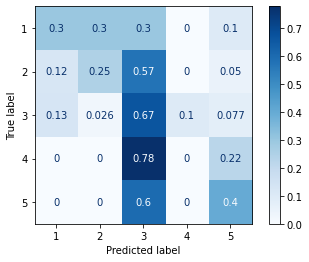

Figurative Set
Accuracy: 0.48148148148148145

              precision    recall  f1-score   support

           1     0.2000    0.3333    0.2500         6
           2     0.8571    0.3529    0.5000        17
           3     0.4815    0.6842    0.5652        19
           4     0.3333    0.1667    0.2222         6
           5     0.5714    0.6667    0.6154         6

    accuracy                         0.4815        54
   macro avg     0.4887    0.4408    0.4306        54
weighted avg     0.5620    0.4815    0.4771        54



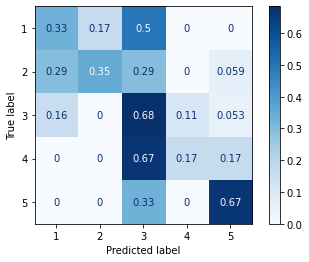

Qualifiers Set
Accuracy: 0.4594594594594595

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.5000    0.1333    0.2105        15
           3     0.5385    0.7778    0.6364        18
           4     0.0000    0.0000    0.0000         1
           5     0.2500    0.5000    0.3333         2

    accuracy                         0.4595        37
   macro avg     0.2577    0.2822    0.2360        37
weighted avg     0.4782    0.4595    0.4129        37



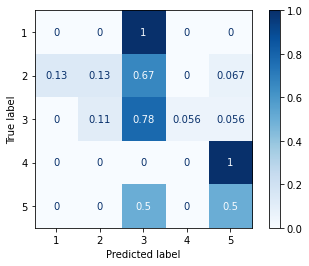

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



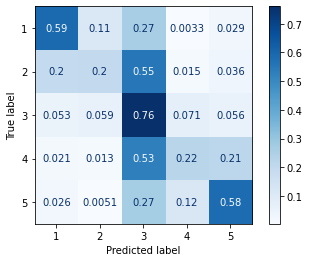

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

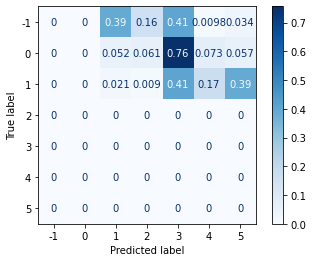

Contradictory Set
Accuracy: 0.42718446601941745

              precision    recall  f1-score   support

           1     0.2500    0.3000    0.2727        10
           2     0.8000    0.3000    0.4364        40
           3     0.4219    0.6923    0.5243        39
           4     0.0000    0.0000    0.0000         9
           5     0.2500    0.4000    0.3077         5

    accuracy                         0.4272       103
   macro avg     0.3444    0.3385    0.3082       103
weighted avg     0.5068    0.4272    0.4094       103



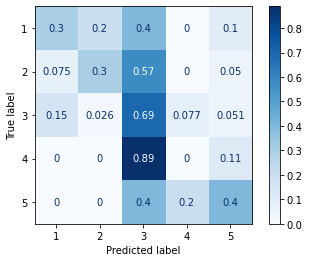

Figurative Set
Accuracy: 0.3888888888888889

              precision    recall  f1-score   support

           1     0.1667    0.1667    0.1667         6
           2     0.5000    0.1765    0.2609        17
           3     0.4444    0.6316    0.5217        19
           4     0.2000    0.1667    0.1818         6
           5     0.4000    0.6667    0.5000         6

    accuracy                         0.3889        54
   macro avg     0.3422    0.3616    0.3262        54
weighted avg     0.3990    0.3889    0.3600        54



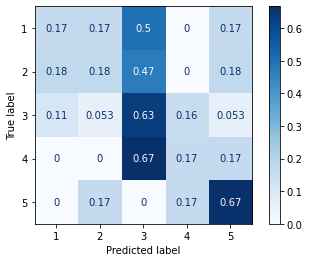

Qualifiers Set
Accuracy: 0.5135135135135135

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.7500    0.2000    0.3158        15
           3     0.5714    0.8889    0.6957        18
           4     0.0000    0.0000    0.0000         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.5135        37
   macro avg     0.2643    0.2178    0.2023        37
weighted avg     0.5820    0.5135    0.4664        37



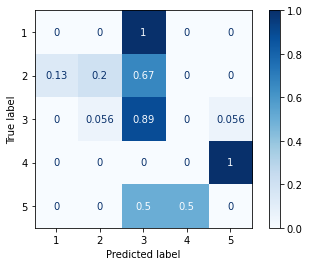

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



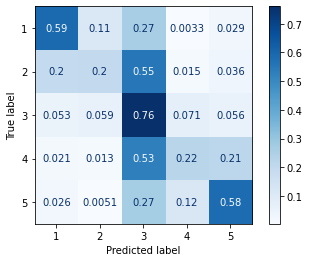

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

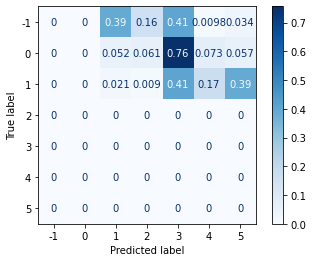

Contradictory Set
Accuracy: 0.42718446601941745

              precision    recall  f1-score   support

           1     0.2500    0.3000    0.2727        10
           2     0.9091    0.2500    0.3922        40
           3     0.4143    0.7436    0.5321        39
           4     0.0000    0.0000    0.0000         9
           5     0.4000    0.4000    0.4000         5

    accuracy                         0.4272       103
   macro avg     0.3947    0.3387    0.3194       103
weighted avg     0.5536    0.4272    0.3997       103



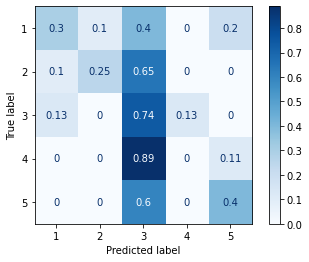

Figurative Set
Accuracy: 0.3888888888888889

              precision    recall  f1-score   support

           1     0.2222    0.3333    0.2667         6
           2     0.7500    0.1765    0.2857        17
           3     0.4286    0.6316    0.5106        19
           4     0.0000    0.0000    0.0000         6
           5     0.4444    0.6667    0.5333         6

    accuracy                         0.3889        54
   macro avg     0.3690    0.3616    0.3193        54
weighted avg     0.4610    0.3889    0.3585        54



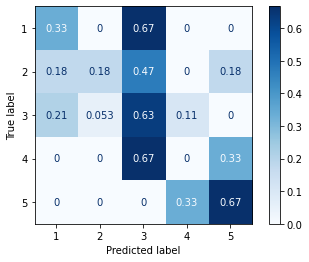

Qualifiers Set
Accuracy: 0.5135135135135135

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.7500    0.2000    0.3158        15
           3     0.5714    0.8889    0.6957        18
           4     0.0000    0.0000    0.0000         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.5135        37
   macro avg     0.2643    0.2178    0.2023        37
weighted avg     0.5820    0.5135    0.4664        37



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

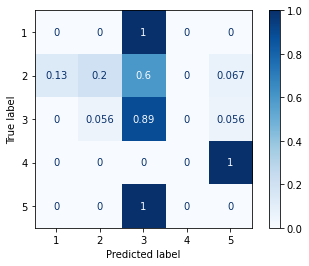

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



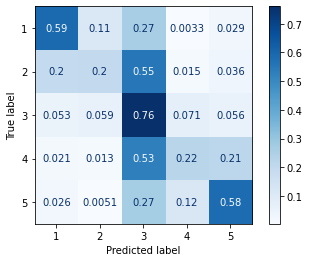

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

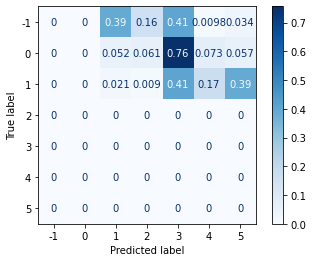

Contradictory Set
Accuracy: 0.4077669902912621

              precision    recall  f1-score   support

           1     0.0833    0.1000    0.0909        10
           2     0.7333    0.2750    0.4000        40
           3     0.4286    0.6923    0.5294        39
           4     0.3333    0.1111    0.1667         9
           5     0.2000    0.4000    0.2667         5

    accuracy                         0.4078       103
   macro avg     0.3557    0.3157    0.2907       103
weighted avg     0.4940    0.4078    0.3921       103



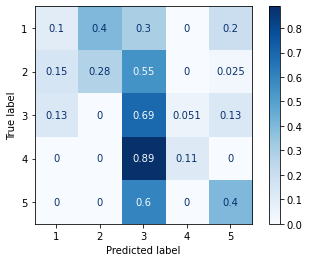

Figurative Set
Accuracy: 0.42592592592592593

              precision    recall  f1-score   support

           1     0.2222    0.3333    0.2667         6
           2     0.6667    0.2353    0.3478        17
           3     0.4231    0.5789    0.4889        19
           4     0.2500    0.1667    0.2000         6
           5     0.5556    0.8333    0.6667         6

    accuracy                         0.4259        54
   macro avg     0.4235    0.4295    0.3940        54
weighted avg     0.4729    0.4259    0.4074        54



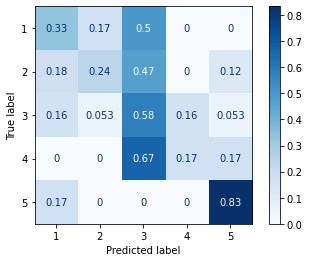

Qualifiers Set
Accuracy: 0.5945945945945946

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.8000    0.2667    0.4000        15
           3     0.6071    0.9444    0.7391        18
           4     1.0000    1.0000    1.0000         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.5946        37
   macro avg     0.4814    0.4422    0.4278        37
weighted avg     0.6467    0.5946    0.5488        37



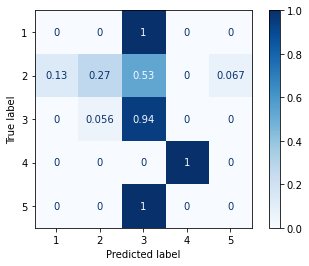

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



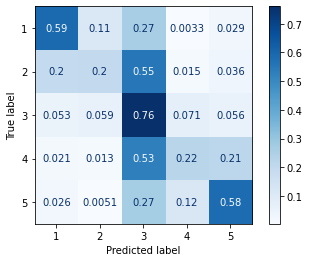

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

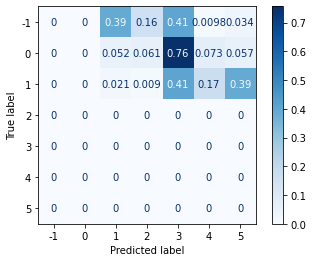

Contradictory Set
Accuracy: 0.3883495145631068

              precision    recall  f1-score   support

           1     0.2500    0.4000    0.3077        10
           2     0.6364    0.1750    0.2745        40
           3     0.4091    0.6923    0.5143        39
           4     0.0000    0.0000    0.0000         9
           5     0.4000    0.4000    0.4000         5

    accuracy                         0.3883       103
   macro avg     0.3391    0.3335    0.2993       103
weighted avg     0.4457    0.3883    0.3506       103



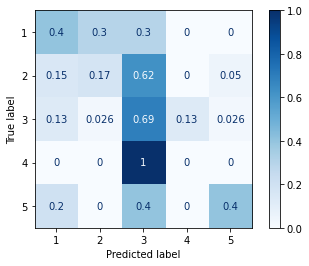

Figurative Set
Accuracy: 0.3888888888888889

              precision    recall  f1-score   support

           1     0.2000    0.3333    0.2500         6
           2     0.5714    0.2353    0.3333        17
           3     0.4074    0.5789    0.4783        19
           4     0.0000    0.0000    0.0000         6
           5     0.5000    0.6667    0.5714         6

    accuracy                         0.3889        54
   macro avg     0.3358    0.3628    0.3266        54
weighted avg     0.4010    0.3889    0.3645        54



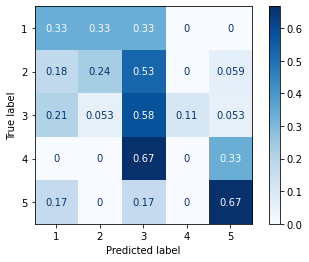

Qualifiers Set
Accuracy: 0.5675675675675675

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.8000    0.2667    0.4000        15
           3     0.5714    0.8889    0.6957        18
           4     0.5000    1.0000    0.6667         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.5676        37
   macro avg     0.3743    0.4311    0.3525        37
weighted avg     0.6158    0.5676    0.5186        37



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

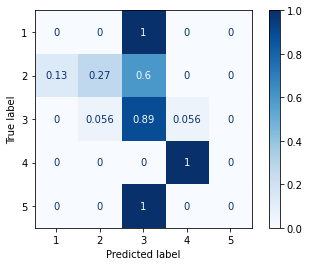

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



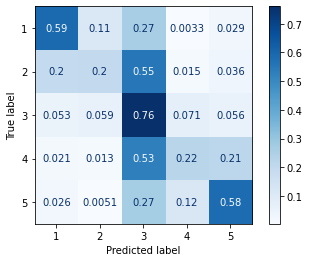

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

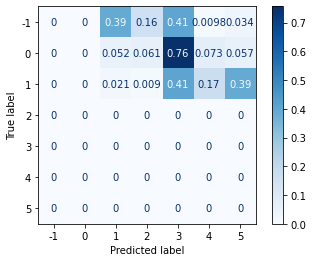

Contradictory Set
Accuracy: 0.4563106796116505

              precision    recall  f1-score   support

           1     0.1667    0.2000    0.1818        10
           2     0.8333    0.2500    0.3846        40
           3     0.4507    0.8205    0.5818        39
           4     0.0000    0.0000    0.0000         9
           5     0.5000    0.6000    0.5455         5

    accuracy                         0.4563       103
   macro avg     0.3901    0.3741    0.3387       103
weighted avg     0.5347    0.4563    0.4138       103



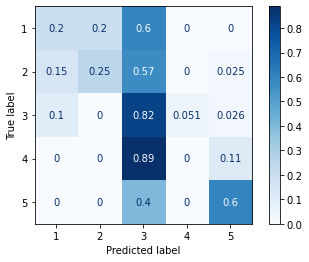

Figurative Set
Accuracy: 0.37037037037037035

              precision    recall  f1-score   support

           1     0.3846    0.8333    0.5263         6
           2     0.4000    0.1176    0.1818        17
           3     0.4500    0.4737    0.4615        19
           4     0.0000    0.0000    0.0000         6
           5     0.3333    0.6667    0.4444         6

    accuracy                         0.3704        54
   macro avg     0.3136    0.4183    0.3228        54
weighted avg     0.3640    0.3704    0.3275        54



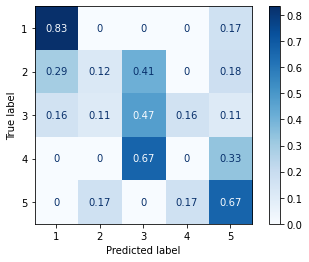

Qualifiers Set
Accuracy: 0.5675675675675675

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     1.0000    0.3333    0.5000        15
           3     0.5926    0.8889    0.7111        18
           4     0.0000    0.0000    0.0000         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.5676        37
   macro avg     0.3185    0.2444    0.2422        37
weighted avg     0.6937    0.5676    0.5486        37



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

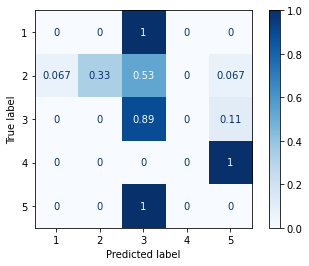

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



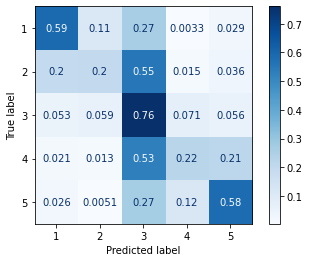

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

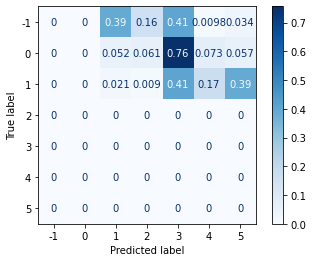

Contradictory Set
Accuracy: 0.39805825242718446

              precision    recall  f1-score   support

           1     0.2500    0.3000    0.2727        10
           2     0.9091    0.2500    0.3922        40
           3     0.3939    0.6667    0.4952        39
           4     0.0000    0.0000    0.0000         9
           5     0.2500    0.4000    0.3077         5

    accuracy                         0.3981       103
   macro avg     0.3606    0.3233    0.2936       103
weighted avg     0.5386    0.3981    0.3812       103



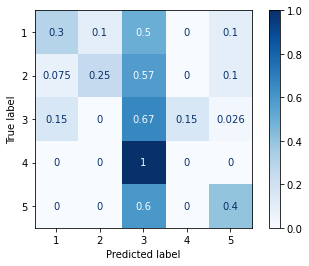

Figurative Set
Accuracy: 0.46296296296296297

              precision    recall  f1-score   support

           1     0.2500    0.3333    0.2857         6
           2     0.6364    0.4118    0.5000        17
           3     0.4815    0.6842    0.5652        19
           4     0.0000    0.0000    0.0000         6
           5     0.5000    0.5000    0.5000         6

    accuracy                         0.4630        54
   macro avg     0.3736    0.3859    0.3702        54
weighted avg     0.4531    0.4630    0.4436        54



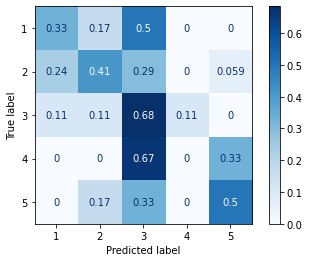

Qualifiers Set
Accuracy: 0.5135135135135135

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.7500    0.2000    0.3158        15
           3     0.5556    0.8333    0.6667        18
           4     0.0000    0.0000    0.0000         1
           5     0.3333    0.5000    0.4000         2

    accuracy                         0.5135        37
   macro avg     0.3278    0.3067    0.2765        37
weighted avg     0.5923    0.5135    0.4740        37



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

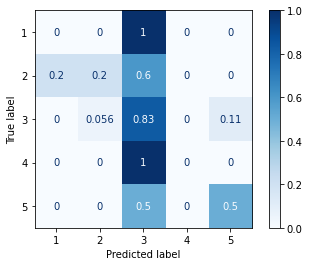

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



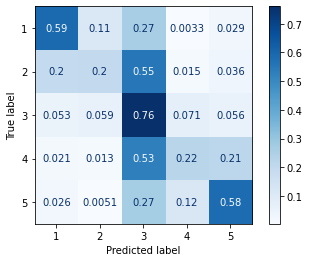

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

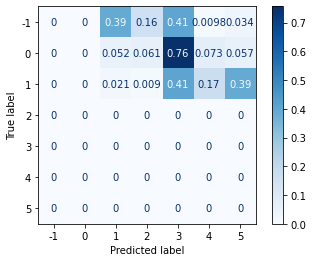

Contradictory Set
Accuracy: 0.42718446601941745

              precision    recall  f1-score   support

           1     0.2727    0.3000    0.2857        10
           2     0.7692    0.2500    0.3774        40
           3     0.4308    0.7179    0.5385        39
           4     0.0000    0.0000    0.0000         9
           5     0.2727    0.6000    0.3750         5

    accuracy                         0.4272       103
   macro avg     0.3491    0.3736    0.3153       103
weighted avg     0.5016    0.4272    0.3964       103



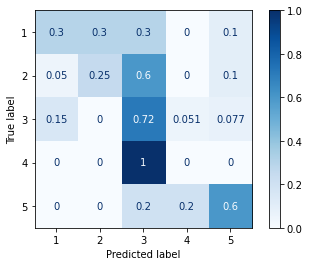

Figurative Set
Accuracy: 0.35185185185185186

              precision    recall  f1-score   support

           1     0.2727    0.5000    0.3529         6
           2     0.3333    0.1176    0.1739        17
           3     0.4231    0.5789    0.4889        19
           4     0.0000    0.0000    0.0000         6
           5     0.3750    0.5000    0.4286         6

    accuracy                         0.3519        54
   macro avg     0.2808    0.3393    0.2889        54
weighted avg     0.3258    0.3519    0.3136        54



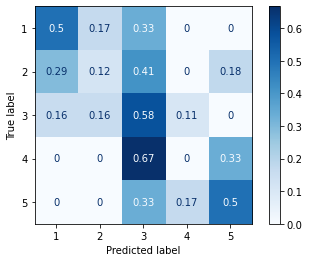

Qualifiers Set
Accuracy: 0.5405405405405406

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.6667    0.2667    0.3810        15
           3     0.6154    0.8889    0.7273        18
           4     0.0000    0.0000    0.0000         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.5405        37
   macro avg     0.2564    0.2311    0.2216        37
weighted avg     0.5696    0.5405    0.5082        37



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

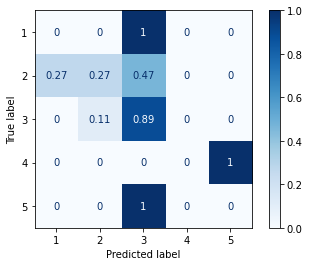

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



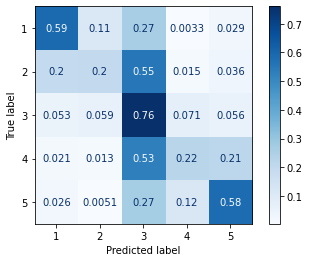

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

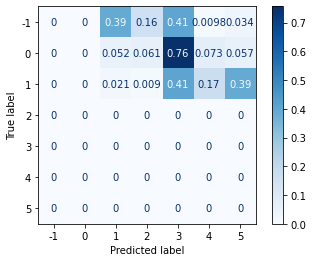

Contradictory Set
Accuracy: 0.44660194174757284

              precision    recall  f1-score   support

           1     0.2727    0.3000    0.2857        10
           2     0.8333    0.2500    0.3846        40
           3     0.4167    0.7692    0.5405        39
           4     0.0000    0.0000    0.0000         9
           5     0.4286    0.6000    0.5000         5

    accuracy                         0.4466       103
   macro avg     0.3903    0.3838    0.3422       103
weighted avg     0.5287    0.4466    0.4060       103



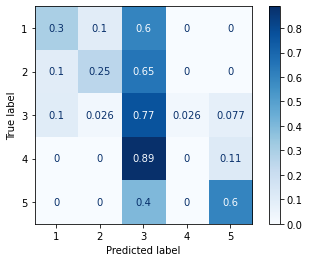

Figurative Set
Accuracy: 0.48148148148148145

              precision    recall  f1-score   support

           1     0.3000    0.5000    0.3750         6
           2     0.8333    0.2941    0.4348        17
           3     0.5000    0.6842    0.5778        19
           4     0.3333    0.1667    0.2222         6
           5     0.4444    0.6667    0.5333         6

    accuracy                         0.4815        54
   macro avg     0.4822    0.4623    0.4286        54
weighted avg     0.5580    0.4815    0.4658        54



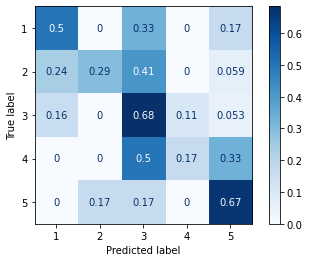

Qualifiers Set
Accuracy: 0.4864864864864865

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.5000    0.1333    0.2105        15
           3     0.5357    0.8333    0.6522        18
           4     1.0000    1.0000    1.0000         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.4865        37
   macro avg     0.4071    0.3933    0.3725        37
weighted avg     0.4903    0.4865    0.4296        37



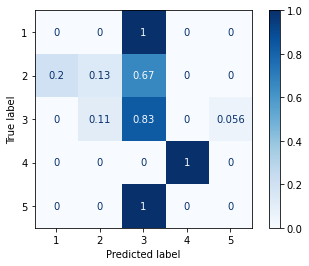

Training Set
Accuracy: 0.5195904761904762

              precision    recall  f1-score   support

           1     0.6267    0.5906    0.6081     17439
           2     0.4472    0.1987    0.2751     17523
           3     0.4854    0.7605    0.5926     35084
           4     0.4490    0.2247    0.2995     17536
           5     0.5961    0.5831    0.5895     17418

    accuracy                         0.5196    105000
   macro avg     0.5209    0.4715    0.4730    105000
weighted avg     0.5148    0.5196    0.4927    105000



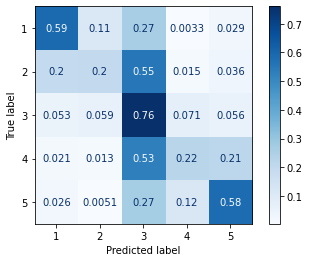

Testing Set
Accuracy: 0.007022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0451    0.0210    0.0287     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0070     45000
   macro avg     0.0064    0.0030    0.0041     45000
weighted avg     0.0151    0.0070    0.0096     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

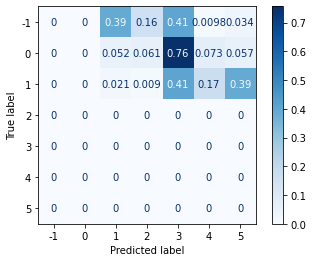

Contradictory Set
Accuracy: 0.3786407766990291

              precision    recall  f1-score   support

           1     0.2222    0.4000    0.2857        10
           2     0.7778    0.1750    0.2857        40
           3     0.4000    0.6667    0.5000        39
           4     0.0000    0.0000    0.0000         9
           5     0.3333    0.4000    0.3636         5

    accuracy                         0.3786       103
   macro avg     0.3467    0.3283    0.2870       103
weighted avg     0.4913    0.3786    0.3457       103



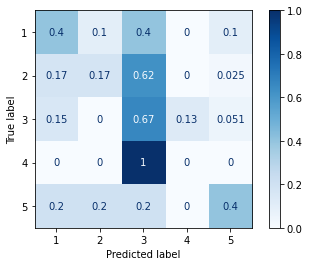

Figurative Set
Accuracy: 0.42592592592592593

              precision    recall  f1-score   support

           1     0.3333    0.5000    0.4000         6
           2     0.6250    0.2941    0.4000        17
           3     0.4444    0.6316    0.5217        19
           4     0.0000    0.0000    0.0000         6
           5     0.5000    0.5000    0.5000         6

    accuracy                         0.4259        54
   macro avg     0.3806    0.3851    0.3643        54
weighted avg     0.4457    0.4259    0.4095        54



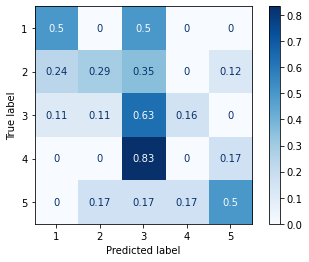

Qualifiers Set
Accuracy: 0.5405405405405406

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.7143    0.3333    0.4545        15
           3     0.5769    0.8333    0.6818        18
           4     0.0000    0.0000    0.0000         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.5405        37
   macro avg     0.2582    0.2333    0.2273        37
weighted avg     0.5702    0.5405    0.5160        37



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

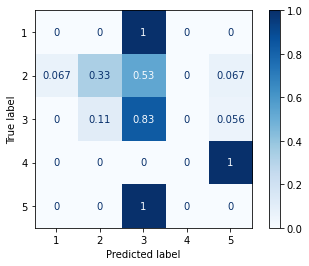

In [236]:
edges = pd.read_csv("example_sentences.csv")


logreg_edge_svm = []*30
for i in range(30):
    test = edges.copy(deep = True)
    x_contra, x_figurative, x_qual, y_contra, y_figurative, y_qual = extract_features_word_removal_sent_tokenize(test)   
    logreg_edge_svm.append(evaluate_model(clf2, model_name="sgd"))

In [237]:
edge = np.array(logreg_edge_svm)[:,2:]
print(stats.describe(edge[:,0]), stats.describe(edge[:,1]), stats.describe(edge[:,2]), sep="\n\n")

DescribeResult(nobs=30, minmax=(0.33980582524271846, 0.4563106796116505), mean=0.4132686084142395, variance=0.0006740102472093202, skewness=-0.6584535585153579, kurtosis=0.47718482396803985)

DescribeResult(nobs=30, minmax=(0.35185185185185186, 0.5185185185185185), mean=0.42530864197530865, variance=0.002423805244154328, skewness=0.4843612741506543, kurtosis=-1.0132267215400417)

DescribeResult(nobs=30, minmax=(0.4594594594594595, 0.5945945945945946), mean=0.5342342342342342, variance=0.0011930849768687604, skewness=-0.0581709735357058, kurtosis=-0.5101649580213552)


Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



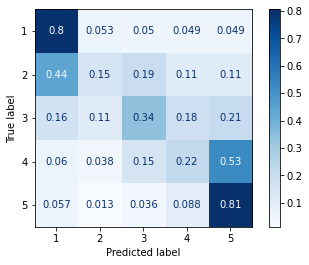

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

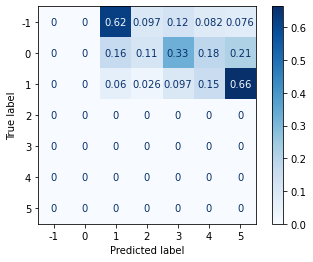

Contradictory Set
Accuracy: 0.2621359223300971

              precision    recall  f1-score   support

           1     0.1724    0.5000    0.2564        10
           2     0.4615    0.1500    0.2264        40
           3     0.5455    0.3077    0.3934        39
           4     0.0000    0.0000    0.0000         9
           5     0.1538    0.8000    0.2581         5

    accuracy                         0.2621       103
   macro avg     0.2667    0.3515    0.2269       103
weighted avg     0.4100    0.2621    0.2743       103



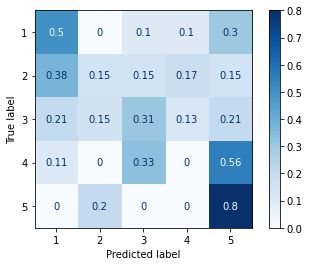

Figurative Set
Accuracy: 0.37037037037037035

              precision    recall  f1-score   support

           1     0.2778    0.8333    0.4167         6
           2     0.6000    0.1765    0.2727        17
           3     0.6667    0.3158    0.4286        19
           4     0.0000    0.0000    0.0000         6
           5     0.3333    1.0000    0.5000         6

    accuracy                         0.3704        54
   macro avg     0.3756    0.4651    0.3236        54
weighted avg     0.4914    0.3704    0.3385        54



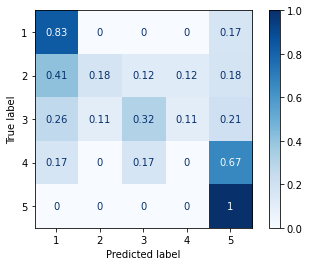

Qualifiers Set
Accuracy: 0.43243243243243246

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.6000    0.2000    0.3000        15
           3     0.7500    0.6667    0.7059        18
           4     0.0000    0.0000    0.0000         1
           5     0.1429    0.5000    0.2222         2

    accuracy                         0.4324        37
   macro avg     0.2986    0.2733    0.2456        37
weighted avg     0.6158    0.4324    0.4770        37



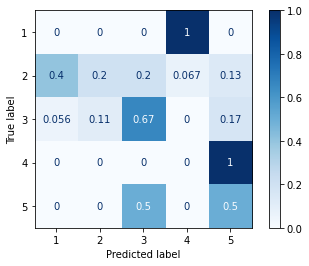

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



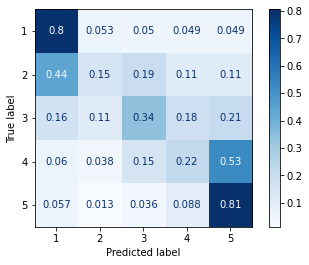

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

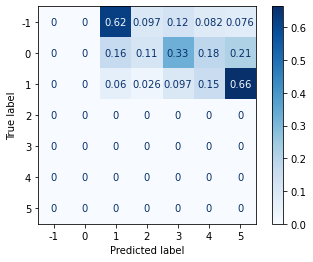

Contradictory Set
Accuracy: 0.2524271844660194

              precision    recall  f1-score   support

           1     0.1429    0.4000    0.2105        10
           2     0.6000    0.2250    0.3273        40
           3     0.3913    0.2308    0.2903        39
           4     0.0909    0.1111    0.1000         9
           5     0.1154    0.6000    0.1935         5

    accuracy                         0.2524       103
   macro avg     0.2681    0.3134    0.2243       103
weighted avg     0.4086    0.2524    0.2756       103



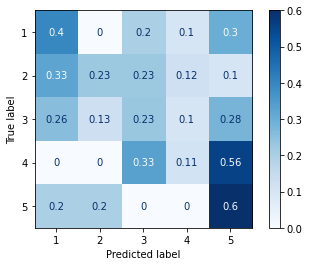

Figurative Set
Accuracy: 0.35185185185185186

              precision    recall  f1-score   support

           1     0.2500    0.6667    0.3636         6
           2     0.6000    0.1765    0.2727        17
           3     0.6000    0.3158    0.4138        19
           4     0.1111    0.1667    0.1333         6
           5     0.3571    0.8333    0.5000         6

    accuracy                         0.3519        54
   macro avg     0.3837    0.4318    0.3367        54
weighted avg     0.4798    0.3519    0.3422        54



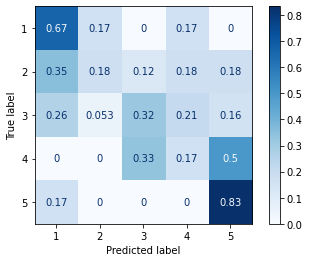

Qualifiers Set
Accuracy: 0.2972972972972973

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.5000    0.1333    0.2105        15
           3     0.7273    0.4444    0.5517        18
           4     0.0000    0.0000    0.0000         1
           5     0.1250    0.5000    0.2000         2

    accuracy                         0.2973        37
   macro avg     0.2705    0.2156    0.1925        37
weighted avg     0.5633    0.2973    0.3646        37



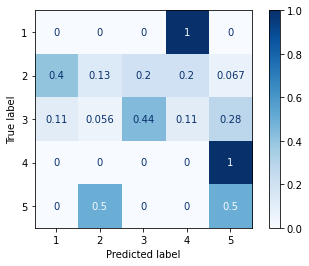

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



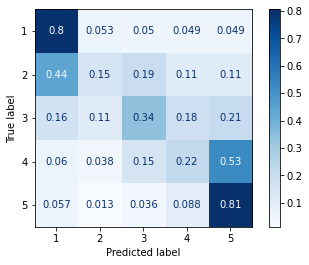

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

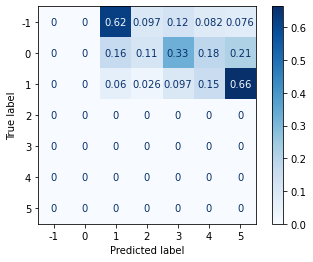

Contradictory Set
Accuracy: 0.3592233009708738

              precision    recall  f1-score   support

           1     0.2593    0.7000    0.3784        10
           2     0.7059    0.3000    0.4211        40
           3     0.5833    0.3590    0.4444        39
           4     0.0588    0.1111    0.0769         9
           5     0.1667    0.6000    0.2609         5

    accuracy                         0.3592       103
   macro avg     0.3548    0.4140    0.3163       103
weighted avg     0.5334    0.3592    0.3879       103



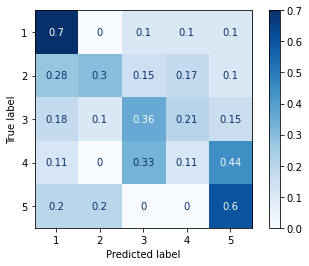

Figurative Set
Accuracy: 0.37037037037037035

              precision    recall  f1-score   support

           1     0.3571    0.8333    0.5000         6
           2     0.6000    0.3529    0.4444        17
           3     0.5714    0.2105    0.3077        19
           4     0.0000    0.0000    0.0000         6
           5     0.3125    0.8333    0.4545         6

    accuracy                         0.3704        54
   macro avg     0.3682    0.4460    0.3413        54
weighted avg     0.4644    0.3704    0.3542        54



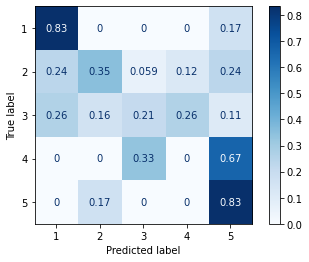

Qualifiers Set
Accuracy: 0.35135135135135137

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.6667    0.4000    0.5000        15
           3     0.5455    0.3333    0.4138        18
           4     0.0000    0.0000    0.0000         1
           5     0.2500    0.5000    0.3333         2

    accuracy                         0.3514        37
   macro avg     0.2924    0.2467    0.2494        37
weighted avg     0.5491    0.3514    0.4220        37



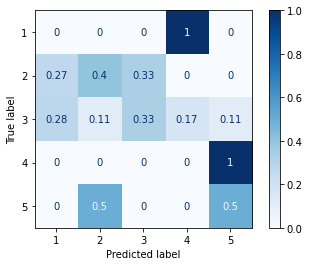

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



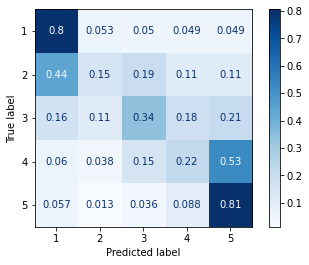

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

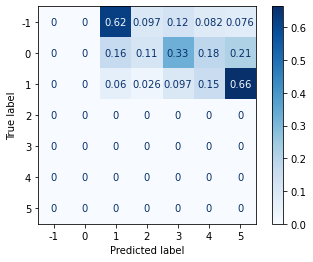

Contradictory Set
Accuracy: 0.2524271844660194

              precision    recall  f1-score   support

           1     0.2258    0.7000    0.3415        10
           2     0.5455    0.1500    0.2353        40
           3     0.3636    0.2051    0.2623        39
           4     0.1111    0.2222    0.1481         9
           5     0.1429    0.6000    0.2308         5

    accuracy                         0.2524       103
   macro avg     0.2778    0.3755    0.2436       103
weighted avg     0.3881    0.2524    0.2480       103



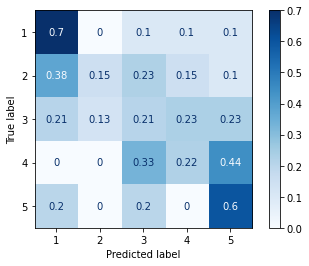

Figurative Set
Accuracy: 0.3888888888888889

              precision    recall  f1-score   support

           1     0.2632    0.8333    0.4000         6
           2     0.8000    0.2353    0.3636        17
           3     0.8571    0.3158    0.4615        19
           4     0.1111    0.1667    0.1333         6
           5     0.3571    0.8333    0.5000         6

    accuracy                         0.3889        54
   macro avg     0.4777    0.4769    0.3717        54
weighted avg     0.6347    0.3889    0.3917        54



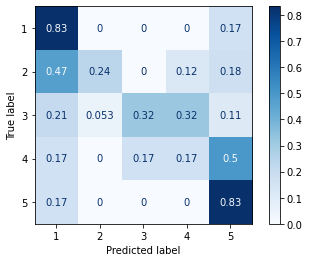

Qualifiers Set
Accuracy: 0.35135135135135137

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.6000    0.2000    0.3000        15
           3     0.6923    0.5000    0.5806        18
           4     0.0000    0.0000    0.0000         1
           5     0.1000    0.5000    0.1667         2

    accuracy                         0.3514        37
   macro avg     0.2785    0.2400    0.2095        37
weighted avg     0.5854    0.3514    0.4131        37



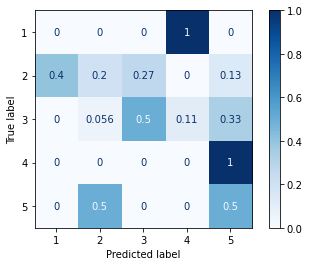

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



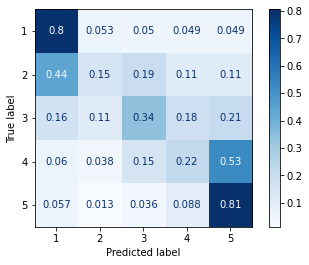

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

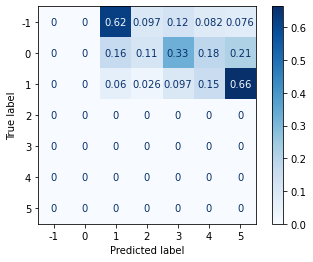

Contradictory Set
Accuracy: 0.1941747572815534

              precision    recall  f1-score   support

           1     0.2258    0.7000    0.3415        10
           2     0.3750    0.1500    0.2143        40
           3     0.2500    0.1026    0.1455        39
           4     0.0000    0.0000    0.0000         9
           5     0.1364    0.6000    0.2222         5

    accuracy                         0.1942       103
   macro avg     0.1974    0.3105    0.1847       103
weighted avg     0.2688    0.1942    0.1822       103



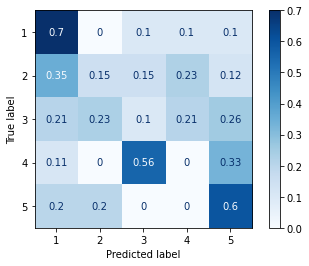

Figurative Set
Accuracy: 0.35185185185185186

              precision    recall  f1-score   support

           1     0.2500    0.6667    0.3636         6
           2     0.6667    0.2353    0.3478        17
           3     0.7143    0.2632    0.3846        19
           4     0.1250    0.1667    0.1429         6
           5     0.2941    0.8333    0.4348         6

    accuracy                         0.3519        54
   macro avg     0.4100    0.4330    0.3347        54
weighted avg     0.5355    0.3519    0.3494        54



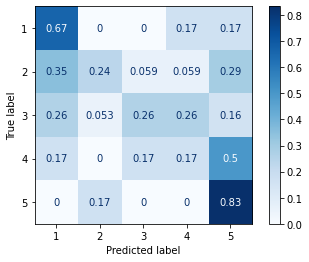

Qualifiers Set
Accuracy: 0.32432432432432434

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.5714    0.2667    0.3636        15
           3     0.7273    0.4444    0.5517        18
           4     0.0000    0.0000    0.0000         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.3243        37
   macro avg     0.2597    0.1422    0.1831        37
weighted avg     0.5855    0.3243    0.4158        37



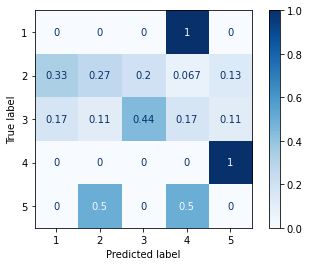

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



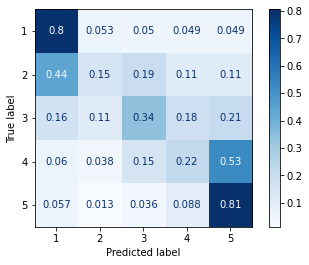

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

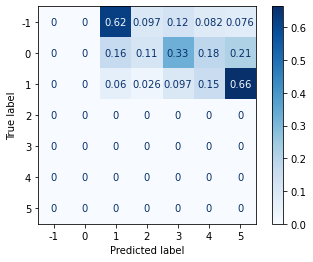

Contradictory Set
Accuracy: 0.3106796116504854

              precision    recall  f1-score   support

           1     0.1786    0.5000    0.2632        10
           2     0.6429    0.2250    0.3333        40
           3     0.4800    0.3077    0.3750        39
           4     0.1765    0.3333    0.2308         9
           5     0.1579    0.6000    0.2500         5

    accuracy                         0.3107       103
   macro avg     0.3272    0.3932    0.2905       103
weighted avg     0.4718    0.3107    0.3293       103



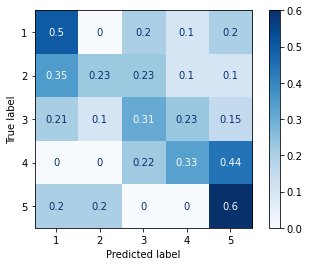

Figurative Set
Accuracy: 0.37037037037037035

              precision    recall  f1-score   support

           1     0.2353    0.6667    0.3478         6
           2     0.6250    0.2941    0.4000        17
           3     0.5556    0.2632    0.3571        19
           4     0.2000    0.1667    0.1818         6
           5     0.3333    0.8333    0.4762         6

    accuracy                         0.3704        54
   macro avg     0.3898    0.4448    0.3526        54
weighted avg     0.4776    0.3704    0.3633        54



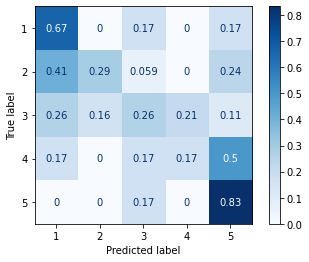

Qualifiers Set
Accuracy: 0.40540540540540543

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.6667    0.1333    0.2222        15
           3     0.8000    0.6667    0.7273        18
           4     0.0000    0.0000    0.0000         1
           5     0.1429    0.5000    0.2222         2

    accuracy                         0.4054        37
   macro avg     0.3219    0.2600    0.2343        37
weighted avg     0.6672    0.4054    0.4559        37



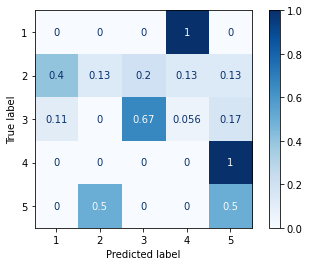

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



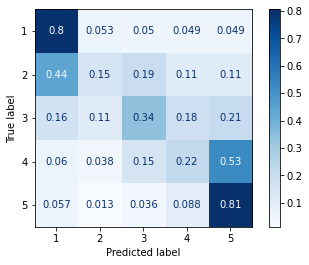

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

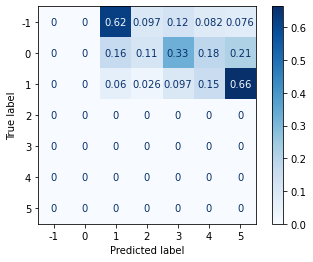

Contradictory Set
Accuracy: 0.27184466019417475

              precision    recall  f1-score   support

           1     0.2222    0.6000    0.3243        10
           2     0.5000    0.1750    0.2593        40
           3     0.4348    0.2564    0.3226        39
           4     0.1667    0.2222    0.1905         9
           5     0.1111    0.6000    0.1875         5

    accuracy                         0.2718       103
   macro avg     0.2870    0.3707    0.2568       103
weighted avg     0.4003    0.2718    0.2801       103



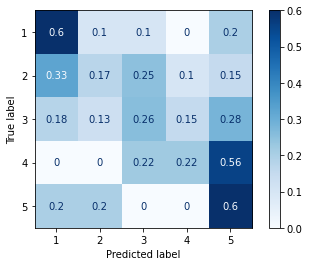

Figurative Set
Accuracy: 0.42592592592592593

              precision    recall  f1-score   support

           1     0.2353    0.6667    0.3478         6
           2     0.6250    0.2941    0.4000        17
           3     0.8000    0.4211    0.5517        19
           4     0.1667    0.1667    0.1667         6
           5     0.3846    0.8333    0.5263         6

    accuracy                         0.4259        54
   macro avg     0.4423    0.4764    0.3985        54
weighted avg     0.5656    0.4259    0.4357        54



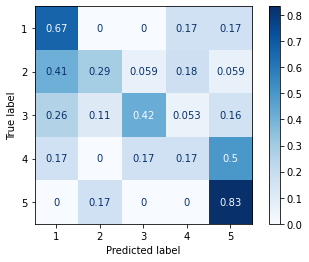

Qualifiers Set
Accuracy: 0.43243243243243246

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.6000    0.4000    0.4800        15
           3     0.9000    0.5000    0.6429        18
           4     0.0000    0.0000    0.0000         1
           5     0.1429    0.5000    0.2222         2

    accuracy                         0.4324        37
   macro avg     0.3286    0.2800    0.2690        37
weighted avg     0.6888    0.4324    0.5193        37



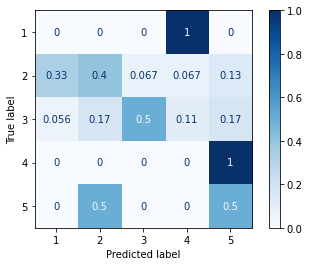

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



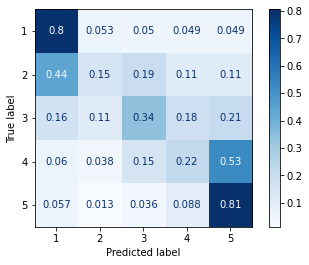

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

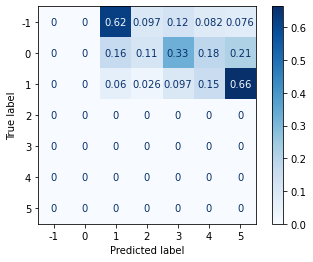

Contradictory Set
Accuracy: 0.2815533980582524

              precision    recall  f1-score   support

           1     0.1600    0.4000    0.2286        10
           2     0.4615    0.1500    0.2264        40
           3     0.4783    0.2821    0.3548        39
           4     0.2500    0.5556    0.3448         9
           5     0.1364    0.6000    0.2222         5

    accuracy                         0.2816       103
   macro avg     0.2972    0.3975    0.2754       103
weighted avg     0.4043    0.2816    0.2854       103



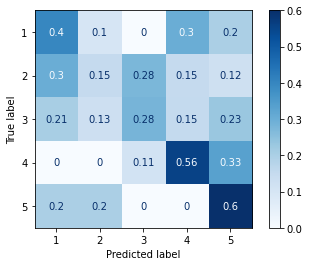

Figurative Set
Accuracy: 0.3148148148148148

              precision    recall  f1-score   support

           1     0.2778    0.8333    0.4167         6
           2     0.3750    0.1765    0.2400        17
           3     0.5714    0.2105    0.3077        19
           4     0.0000    0.0000    0.0000         6
           5     0.3125    0.8333    0.4545         6

    accuracy                         0.3148        54
   macro avg     0.3073    0.4107    0.2838        54
weighted avg     0.3847    0.3148    0.2806        54



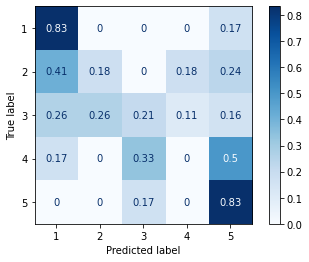

Qualifiers Set
Accuracy: 0.32432432432432434

              precision    recall  f1-score   support

           1     0.1250    1.0000    0.2222         1
           2     0.5556    0.3333    0.4167        15
           3     0.6667    0.3333    0.4444        18
           4     0.0000    0.0000    0.0000         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.3243        37
   macro avg     0.2694    0.3333    0.2167        37
weighted avg     0.5529    0.3243    0.3911        37



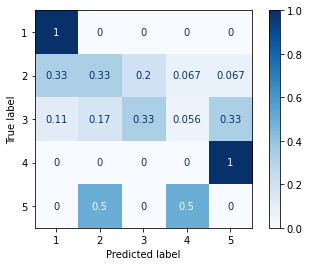

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



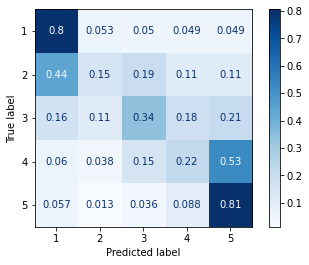

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

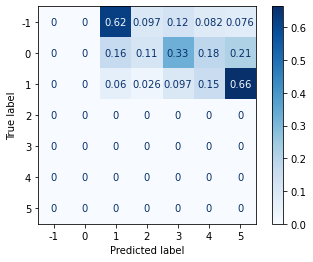

Contradictory Set
Accuracy: 0.22330097087378642

              precision    recall  f1-score   support

           1     0.1739    0.4000    0.2424        10
           2     0.5455    0.1500    0.2353        40
           3     0.4167    0.2564    0.3175        39
           4     0.0000    0.0000    0.0000         9
           5     0.1111    0.6000    0.1875         5

    accuracy                         0.2233       103
   macro avg     0.2494    0.2813    0.1965       103
weighted avg     0.3919    0.2233    0.2442       103



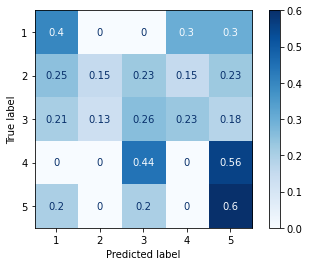

Figurative Set
Accuracy: 0.2962962962962963

              precision    recall  f1-score   support

           1     0.2222    0.6667    0.3333         6
           2     0.3333    0.0588    0.1000        17
           3     0.6000    0.3158    0.4138        19
           4     0.0000    0.0000    0.0000         6
           5     0.2941    0.8333    0.4348         6

    accuracy                         0.2963        54
   macro avg     0.2899    0.3749    0.2564        54
weighted avg     0.3734    0.2963    0.2624        54



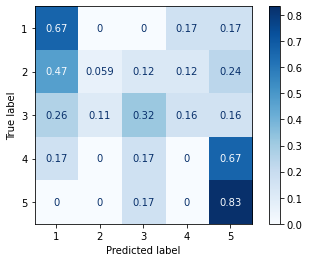

Qualifiers Set
Accuracy: 0.4594594594594595

              precision    recall  f1-score   support

           1     0.1111    1.0000    0.2000         1
           2     0.6000    0.2000    0.3000        15
           3     0.7857    0.6111    0.6875        18
           4     0.2000    1.0000    0.3333         1
           5     0.2500    0.5000    0.3333         2

    accuracy                         0.4595        37
   macro avg     0.3894    0.6622    0.3708        37
weighted avg     0.6474    0.4595    0.4885        37



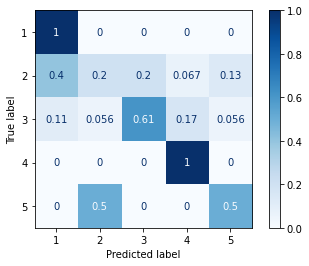

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



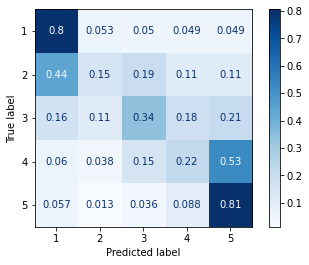

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

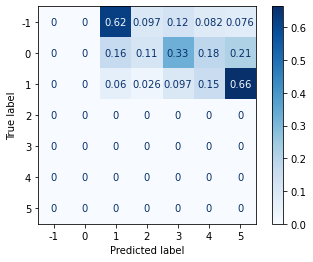

Contradictory Set
Accuracy: 0.3106796116504854

              precision    recall  f1-score   support

           1     0.2500    0.7000    0.3684        10
           2     0.5625    0.2250    0.3214        40
           3     0.4545    0.2564    0.3279        39
           4     0.2000    0.3333    0.2500         9
           5     0.1364    0.6000    0.2222         5

    accuracy                         0.3107       103
   macro avg     0.3207    0.4229    0.2980       103
weighted avg     0.4389    0.3107    0.3174       103



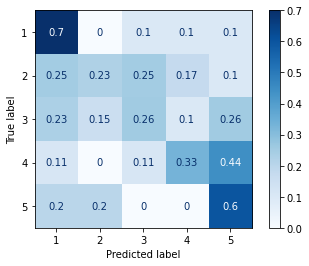

Figurative Set
Accuracy: 0.4074074074074074

              precision    recall  f1-score   support

           1     0.2857    1.0000    0.4444         6
           2     0.6250    0.2941    0.4000        17
           3     0.7143    0.2632    0.3846        19
           4     0.0000    0.0000    0.0000         6
           5     0.3750    1.0000    0.5455         6

    accuracy                         0.4074        54
   macro avg     0.4000    0.5115    0.3549        54
weighted avg     0.5215    0.4074    0.3712        54



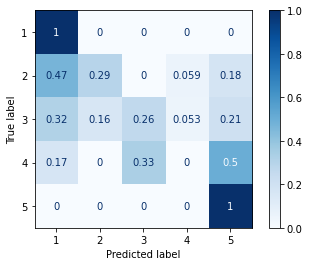

Qualifiers Set
Accuracy: 0.3783783783783784

              precision    recall  f1-score   support

           1     0.1111    1.0000    0.2000         1
           2     0.5000    0.2000    0.2857        15
           3     0.6429    0.5000    0.5625        18
           4     0.0000    0.0000    0.0000         1
           5     0.2000    0.5000    0.2857         2

    accuracy                         0.3784        37
   macro avg     0.2908    0.4400    0.2668        37
weighted avg     0.5293    0.3784    0.4103        37



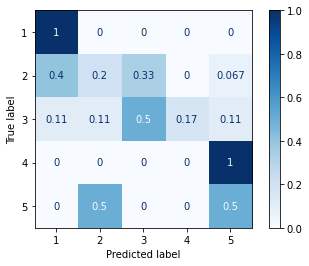

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



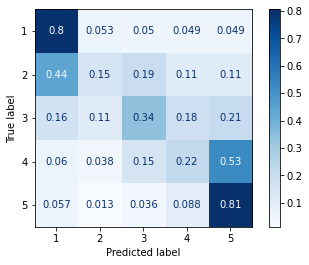

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

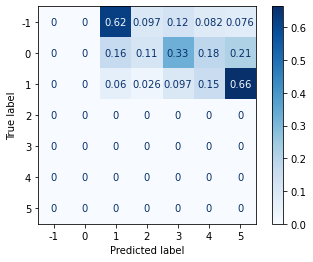

Contradictory Set
Accuracy: 0.2912621359223301

              precision    recall  f1-score   support

           1     0.1923    0.5000    0.2778        10
           2     0.6000    0.2250    0.3273        40
           3     0.5000    0.2051    0.2909        39
           4     0.1905    0.4444    0.2667         9
           5     0.1600    0.8000    0.2667         5

    accuracy                         0.2913       103
   macro avg     0.3286    0.4349    0.2859       103
weighted avg     0.4654    0.2913    0.3005       103



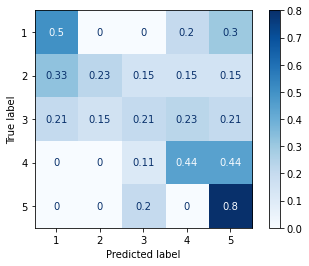

Figurative Set
Accuracy: 0.4074074074074074

              precision    recall  f1-score   support

           1     0.3125    0.8333    0.4545         6
           2     0.7143    0.2941    0.4167        17
           3     0.8571    0.3158    0.4615        19
           4     0.0000    0.0000    0.0000         6
           5     0.3333    1.0000    0.5000         6

    accuracy                         0.4074        54
   macro avg     0.4435    0.4886    0.3666        54
weighted avg     0.5982    0.4074    0.3996        54



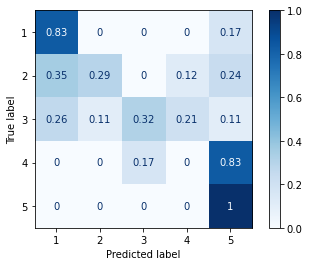

Qualifiers Set
Accuracy: 0.40540540540540543

              precision    recall  f1-score   support

           1     0.1000    1.0000    0.1818         1
           2     0.6250    0.3333    0.4348        15
           3     0.7273    0.4444    0.5517        18
           4     0.0000    0.0000    0.0000         1
           5     0.1667    0.5000    0.2500         2

    accuracy                         0.4054        37
   macro avg     0.3238    0.4556    0.2837        37
weighted avg     0.6189    0.4054    0.4631        37



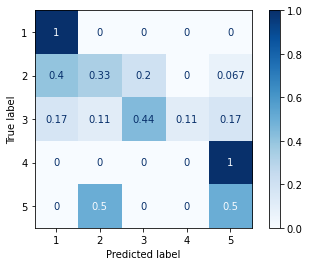

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



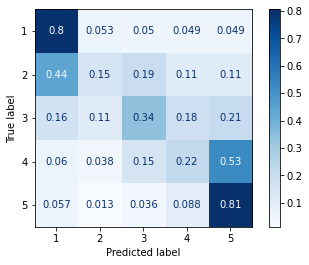

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

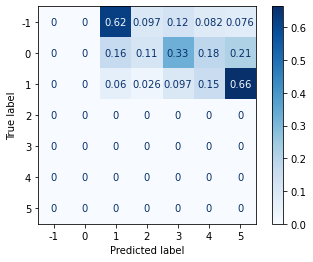

Contradictory Set
Accuracy: 0.2912621359223301

              precision    recall  f1-score   support

           1     0.2917    0.7000    0.4118        10
           2     0.6154    0.2000    0.3019        40
           3     0.3846    0.2564    0.3077        39
           4     0.1333    0.2222    0.1667         9
           5     0.1200    0.6000    0.2000         5

    accuracy                         0.2913       103
   macro avg     0.3090    0.3957    0.2776       103
weighted avg     0.4304    0.2913    0.2980       103



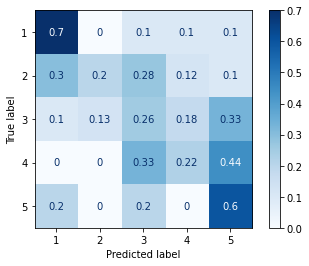

Figurative Set
Accuracy: 0.4074074074074074

              precision    recall  f1-score   support

           1     0.2778    0.8333    0.4167         6
           2     0.6250    0.2941    0.4000        17
           3     0.8571    0.3158    0.4615        19
           4     0.2222    0.3333    0.2667         6
           5     0.3333    0.6667    0.4444         6

    accuracy                         0.4074        54
   macro avg     0.4631    0.4886    0.3979        54
weighted avg     0.5909    0.4074    0.4136        54



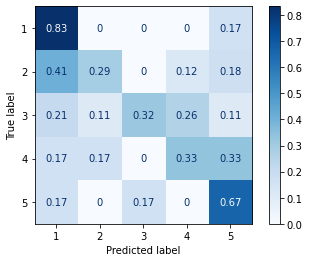

Qualifiers Set
Accuracy: 0.2702702702702703

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.3333    0.0667    0.1111        15
           3     0.6667    0.4444    0.5333        18
           4     0.0000    0.0000    0.0000         1
           5     0.1000    0.5000    0.1667         2

    accuracy                         0.2703        37
   macro avg     0.2200    0.2022    0.1622        37
weighted avg     0.4649    0.2703    0.3135        37



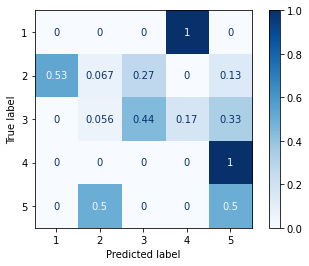

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



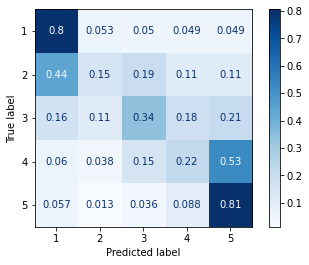

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

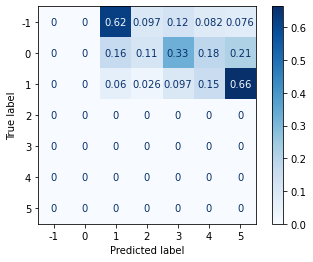

Contradictory Set
Accuracy: 0.22330097087378642

              precision    recall  f1-score   support

           1     0.2143    0.6000    0.3158        10
           2     0.3636    0.1000    0.1569        40
           3     0.3636    0.2051    0.2623        39
           4     0.0667    0.1111    0.0833         9
           5     0.1481    0.8000    0.2500         5

    accuracy                         0.2233       103
   macro avg     0.2313    0.3632    0.2137       103
weighted avg     0.3127    0.2233    0.2103       103



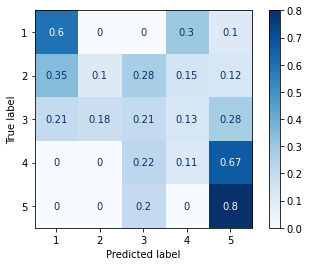

Figurative Set
Accuracy: 0.37037037037037035

              precision    recall  f1-score   support

           1     0.2941    0.8333    0.4348         6
           2     0.7500    0.1765    0.2857        17
           3     0.7778    0.3684    0.5000        19
           4     0.0000    0.0000    0.0000         6
           5     0.3333    0.8333    0.4762         6

    accuracy                         0.3704        54
   macro avg     0.4310    0.4423    0.3393        54
weighted avg     0.5795    0.3704    0.3671        54



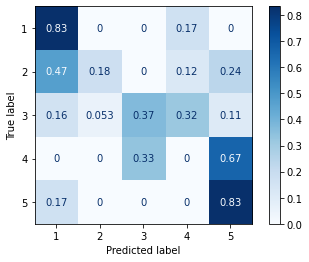

Qualifiers Set
Accuracy: 0.24324324324324326

              precision    recall  f1-score   support

           1     0.1111    1.0000    0.2000         1
           2     0.3333    0.0667    0.1111        15
           3     0.5455    0.3333    0.4138        18
           4     0.0000    0.0000    0.0000         1
           5     0.1000    0.5000    0.1667         2

    accuracy                         0.2432        37
   macro avg     0.2180    0.3800    0.1783        37
weighted avg     0.4089    0.2432    0.2608        37



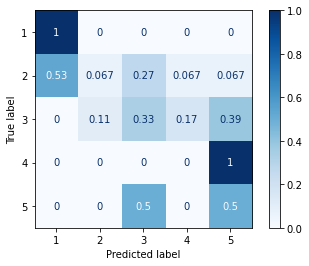

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



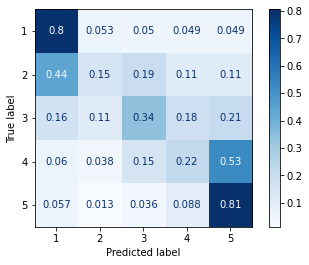

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

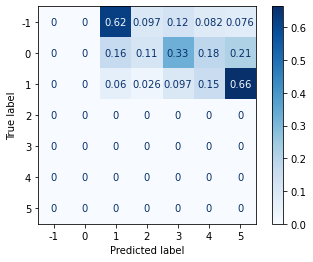

Contradictory Set
Accuracy: 0.2815533980582524

              precision    recall  f1-score   support

           1     0.1852    0.5000    0.2703        10
           2     0.6111    0.2750    0.3793        40
           3     0.5000    0.2564    0.3390        39
           4     0.0000    0.0000    0.0000         9
           5     0.1250    0.6000    0.2069         5

    accuracy                         0.2816       103
   macro avg     0.2843    0.3263    0.2391       103
weighted avg     0.4507    0.2816    0.3119       103



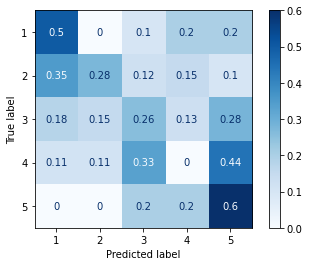

Figurative Set
Accuracy: 0.3888888888888889

              precision    recall  f1-score   support

           1     0.2222    0.6667    0.3333         6
           2     0.8000    0.2353    0.3636        17
           3     0.7778    0.3684    0.5000        19
           4     0.0000    0.0000    0.0000         6
           5     0.4286    1.0000    0.6000         6

    accuracy                         0.3889        54
   macro avg     0.4457    0.4541    0.3594        54
weighted avg     0.5978    0.3889    0.3941        54



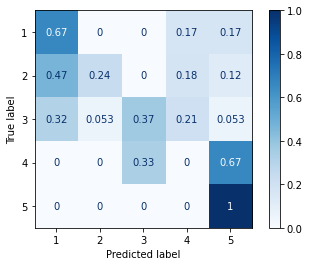

Qualifiers Set
Accuracy: 0.24324324324324326

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.4444    0.2667    0.3333        15
           3     0.5556    0.2778    0.3704        18
           4     0.0000    0.0000    0.0000         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.2432        37
   macro avg     0.2000    0.1089    0.1407        37
weighted avg     0.4505    0.2432    0.3153        37



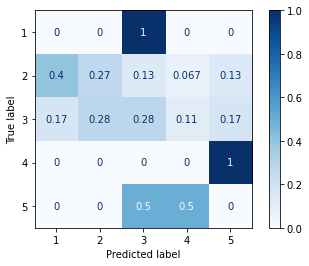

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



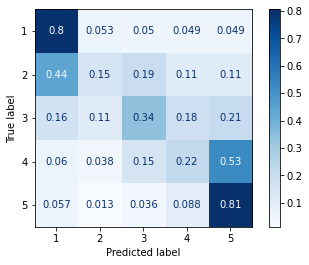

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

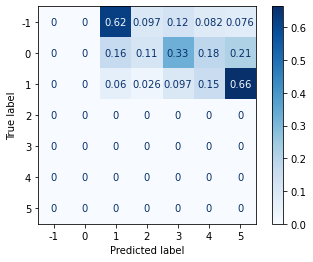

Contradictory Set
Accuracy: 0.2815533980582524

              precision    recall  f1-score   support

           1     0.1786    0.5000    0.2632        10
           2     0.6667    0.2000    0.3077        40
           3     0.5000    0.3077    0.3810        39
           4     0.0588    0.1111    0.0769         9
           5     0.1364    0.6000    0.2222         5

    accuracy                         0.2816       103
   macro avg     0.3081    0.3438    0.2502       103
weighted avg     0.4773    0.2816    0.3068       103



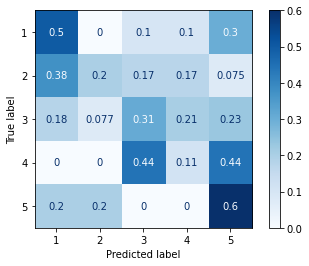

Figurative Set
Accuracy: 0.3333333333333333

              precision    recall  f1-score   support

           1     0.2353    0.6667    0.3478         6
           2     0.7500    0.1765    0.2857        17
           3     0.6667    0.2105    0.3200        19
           4     0.1111    0.1667    0.1333         6
           5     0.3333    1.0000    0.5000         6

    accuracy                         0.3333        54
   macro avg     0.4193    0.4441    0.3174        54
weighted avg     0.5462    0.3333    0.3116        54



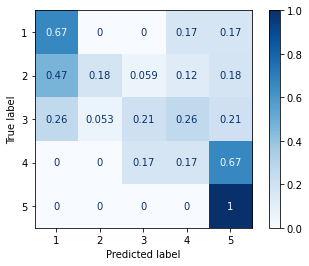

Qualifiers Set
Accuracy: 0.35135135135135137

              precision    recall  f1-score   support

           1     0.1111    1.0000    0.2000         1
           2     0.3750    0.2000    0.2609        15
           3     0.6364    0.3889    0.4828        18
           4     0.2500    1.0000    0.4000         1
           5     0.2000    0.5000    0.2857         2

    accuracy                         0.3514        37
   macro avg     0.3145    0.6178    0.3259        37
weighted avg     0.4822    0.3514    0.3723        37



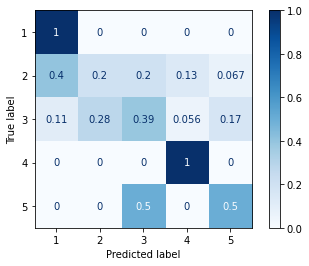

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



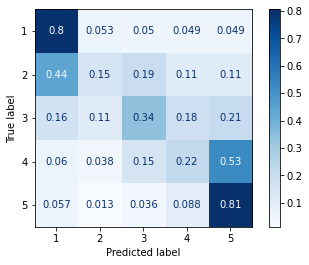

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

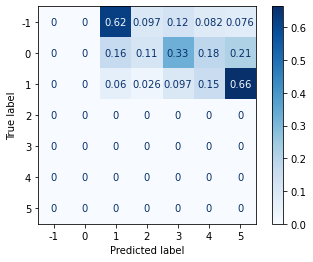

Contradictory Set
Accuracy: 0.2524271844660194

              precision    recall  f1-score   support

           1     0.1923    0.5000    0.2778        10
           2     0.6429    0.2250    0.3333        40
           3     0.4000    0.2051    0.2712        39
           4     0.0455    0.1111    0.0645         9
           5     0.1429    0.6000    0.2308         5

    accuracy                         0.2524       103
   macro avg     0.2847    0.3282    0.2355       103
weighted avg     0.4307    0.2524    0.2759       103



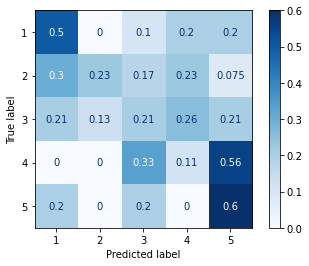

Figurative Set
Accuracy: 0.35185185185185186

              precision    recall  f1-score   support

           1     0.2273    0.8333    0.3571         6
           2     0.6000    0.1765    0.2727        17
           3     0.7143    0.2632    0.3846        19
           4     0.0000    0.0000    0.0000         6
           5     0.3529    1.0000    0.5217         6

    accuracy                         0.3519        54
   macro avg     0.3789    0.4546    0.3072        54
weighted avg     0.5047    0.3519    0.3188        54



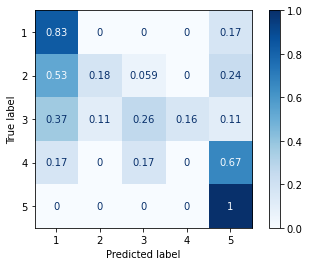

Qualifiers Set
Accuracy: 0.2972972972972973

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.5000    0.1333    0.2105        15
           3     0.5714    0.4444    0.5000        18
           4     0.0000    0.0000    0.0000         1
           5     0.1250    0.5000    0.2000         2

    accuracy                         0.2973        37
   macro avg     0.2393    0.2156    0.1821        37
weighted avg     0.4875    0.2973    0.3394        37



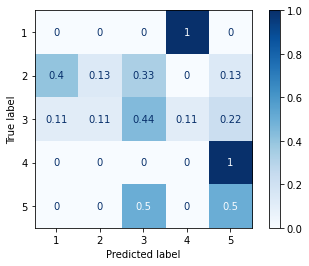

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



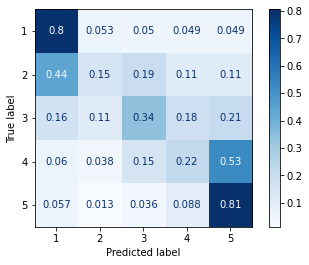

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

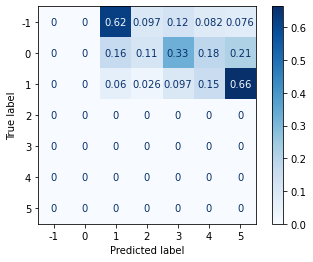

Contradictory Set
Accuracy: 0.2524271844660194

              precision    recall  f1-score   support

           1     0.1429    0.4000    0.2105        10
           2     0.7000    0.1750    0.2800        40
           3     0.4545    0.2564    0.3279        39
           4     0.1176    0.2222    0.1538         9
           5     0.1154    0.6000    0.1935         5

    accuracy                         0.2524       103
   macro avg     0.3061    0.3307    0.2332       103
weighted avg     0.4737    0.2524    0.2762       103



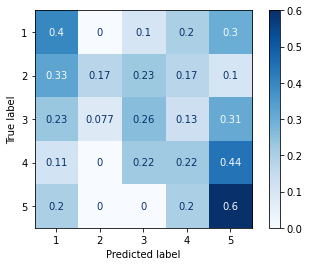

Figurative Set
Accuracy: 0.37037037037037035

              precision    recall  f1-score   support

           1     0.2941    0.8333    0.4348         6
           2     0.5000    0.2353    0.3200        17
           3     0.6250    0.2632    0.3704        19
           4     0.0000    0.0000    0.0000         6
           5     0.3529    1.0000    0.5217         6

    accuracy                         0.3704        54
   macro avg     0.3544    0.4664    0.3294        54
weighted avg     0.4492    0.3704    0.3373        54



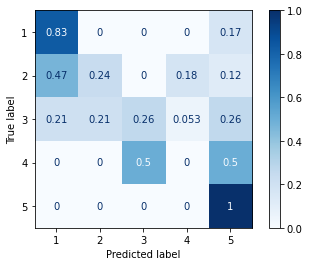

Qualifiers Set
Accuracy: 0.35135135135135137

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.4444    0.2667    0.3333        15
           3     0.6667    0.4444    0.5333        18
           4     0.0000    0.0000    0.0000         1
           5     0.1111    0.5000    0.1818         2

    accuracy                         0.3514        37
   macro avg     0.2444    0.2422    0.2097        37
weighted avg     0.5105    0.3514    0.4044        37



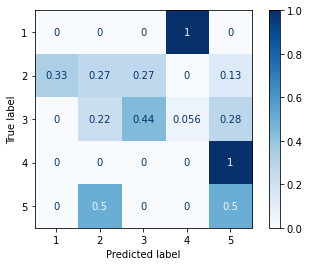

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



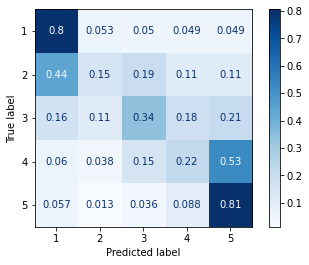

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

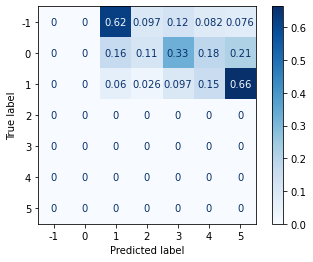

Contradictory Set
Accuracy: 0.3106796116504854

              precision    recall  f1-score   support

           1     0.2143    0.6000    0.3158        10
           2     0.5333    0.2000    0.2909        40
           3     0.5652    0.3333    0.4194        39
           4     0.1250    0.2222    0.1600         9
           5     0.1429    0.6000    0.2308         5

    accuracy                         0.3107       103
   macro avg     0.3161    0.3911    0.2834       103
weighted avg     0.4598    0.3107    0.3276       103



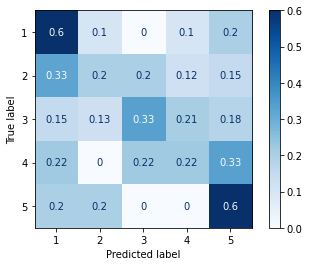

Figurative Set
Accuracy: 0.4074074074074074

              precision    recall  f1-score   support

           1     0.2857    0.6667    0.4000         6
           2     0.6667    0.2353    0.3478        17
           3     0.7000    0.3684    0.4828        19
           4     0.1429    0.1667    0.1538         6
           5     0.3529    1.0000    0.5217         6

    accuracy                         0.4074        54
   macro avg     0.4296    0.4874    0.3812        54
weighted avg     0.5430    0.4074    0.3989        54



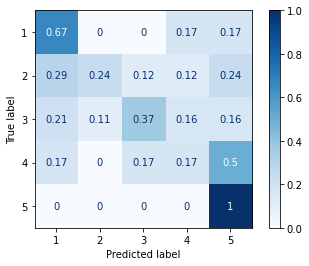

Qualifiers Set
Accuracy: 0.35135135135135137

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.5000    0.4000    0.4444        15
           3     0.6667    0.3333    0.4444        18
           4     0.0000    0.0000    0.0000         1
           5     0.2000    0.5000    0.2857         2

    accuracy                         0.3514        37
   macro avg     0.2733    0.2467    0.2349        37
weighted avg     0.5378    0.3514    0.4118        37



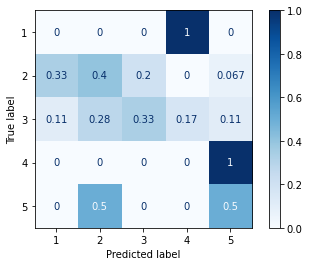

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



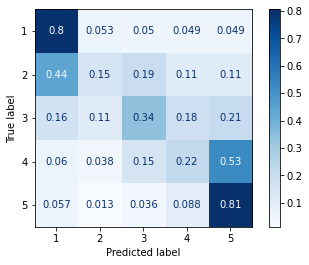

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

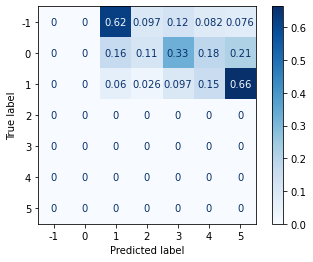

Contradictory Set
Accuracy: 0.2912621359223301

              precision    recall  f1-score   support

           1     0.2400    0.6000    0.3429        10
           2     0.6923    0.2250    0.3396        40
           3     0.4167    0.2564    0.3175        39
           4     0.0588    0.1111    0.0769         9
           5     0.1667    0.8000    0.2759         5

    accuracy                         0.2913       103
   macro avg     0.3149    0.3985    0.2705       103
weighted avg     0.4632    0.2913    0.3055       103



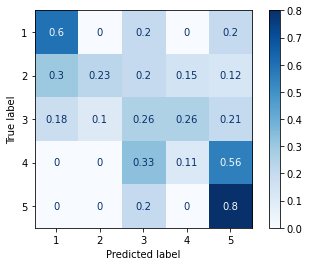

Figurative Set
Accuracy: 0.3148148148148148

              precision    recall  f1-score   support

           1     0.2500    0.6667    0.3636         6
           2     0.5714    0.2353    0.3333        17
           3     0.7143    0.2632    0.3846        19
           4     0.0000    0.0000    0.0000         6
           5     0.2857    0.6667    0.4000         6

    accuracy                         0.3148        54
   macro avg     0.3643    0.3664    0.2963        54
weighted avg     0.4907    0.3148    0.3251        54



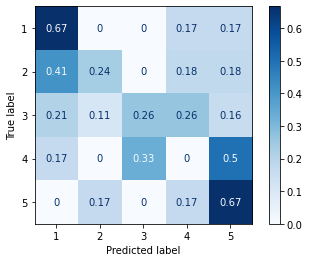

Qualifiers Set
Accuracy: 0.24324324324324326

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.5000    0.2000    0.2857        15
           3     0.5000    0.2222    0.3077        18
           4     0.2000    1.0000    0.3333         1
           5     0.1000    0.5000    0.1667         2

    accuracy                         0.2432        37
   macro avg     0.2600    0.3844    0.2187        37
weighted avg     0.4568    0.2432    0.2835        37



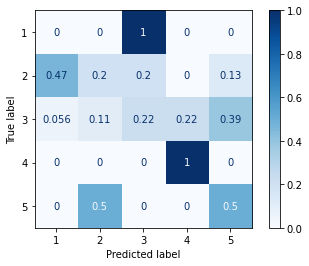

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



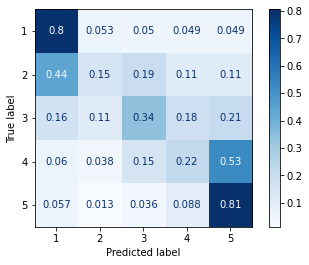

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

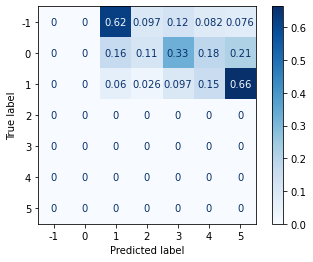

Contradictory Set
Accuracy: 0.2621359223300971

              precision    recall  f1-score   support

           1     0.2222    0.6000    0.3243        10
           2     0.5000    0.2000    0.2857        40
           3     0.4286    0.2308    0.3000        39
           4     0.0000    0.0000    0.0000         9
           5     0.1739    0.8000    0.2857         5

    accuracy                         0.2621       103
   macro avg     0.2649    0.3662    0.2392       103
weighted avg     0.3865    0.2621    0.2699       103



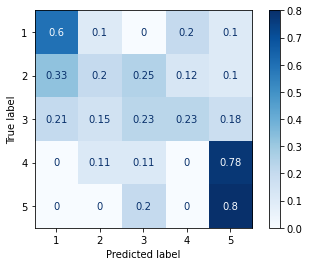

Figurative Set
Accuracy: 0.4074074074074074

              precision    recall  f1-score   support

           1     0.2778    0.8333    0.4167         6
           2     0.8333    0.2941    0.4348        17
           3     0.7778    0.3684    0.5000        19
           4     0.0000    0.0000    0.0000         6
           5     0.3846    0.8333    0.5263         6

    accuracy                         0.4074        54
   macro avg     0.4547    0.4658    0.3756        54
weighted avg     0.6096    0.4074    0.4176        54



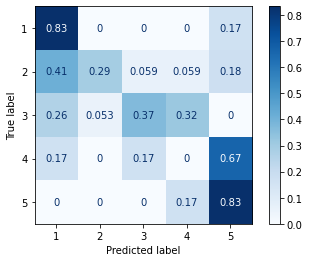

Qualifiers Set
Accuracy: 0.2972972972972973

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.8000    0.2667    0.4000        15
           3     0.5000    0.2778    0.3571        18
           4     0.1429    1.0000    0.2500         1
           5     0.1250    0.5000    0.2000         2

    accuracy                         0.2973        37
   macro avg     0.3136    0.4089    0.2414        37
weighted avg     0.5782    0.2973    0.3535        37



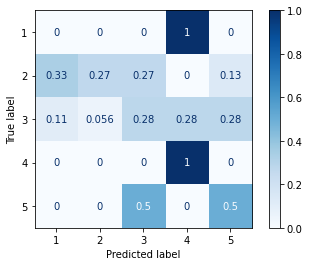

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



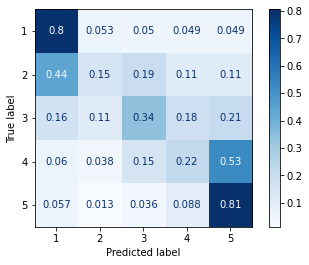

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

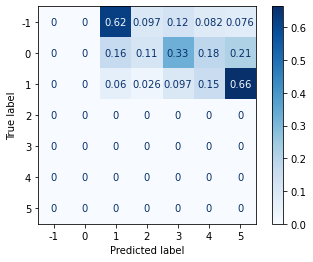

Contradictory Set
Accuracy: 0.2524271844660194

              precision    recall  f1-score   support

           1     0.1724    0.5000    0.2564        10
           2     0.3750    0.1500    0.2143        40
           3     0.5500    0.2821    0.3729        39
           4     0.0769    0.1111    0.0909         9
           5     0.1200    0.6000    0.2000         5

    accuracy                         0.2524       103
   macro avg     0.2589    0.3286    0.2269       103
weighted avg     0.3832    0.2524    0.2670       103



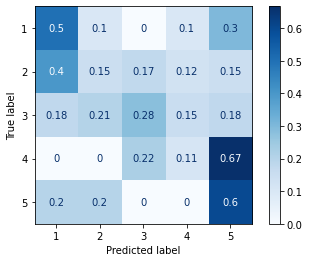

Figurative Set
Accuracy: 0.35185185185185186

              precision    recall  f1-score   support

           1     0.2500    0.6667    0.3636         6
           2     0.8000    0.2353    0.3636        17
           3     0.5455    0.3158    0.4000        19
           4     0.0000    0.0000    0.0000         6
           5     0.3571    0.8333    0.5000         6

    accuracy                         0.3519        54
   macro avg     0.3905    0.4102    0.3255        54
weighted avg     0.5112    0.3519    0.3512        54



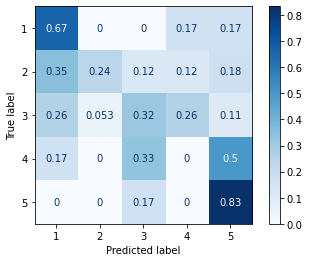

Qualifiers Set
Accuracy: 0.2702702702702703

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.2857    0.1333    0.1818        15
           3     0.6000    0.3333    0.4286        18
           4     0.1667    1.0000    0.2857         1
           5     0.1667    0.5000    0.2500         2

    accuracy                         0.2703        37
   macro avg     0.2438    0.3933    0.2292        37
weighted avg     0.4212    0.2703    0.3034        37



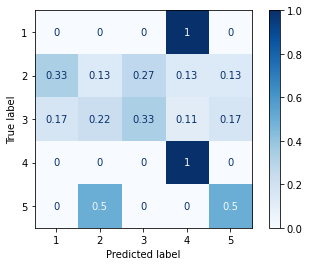

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



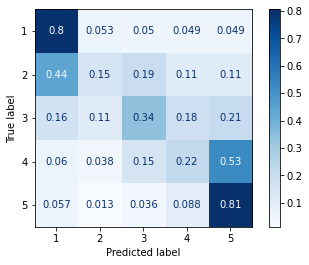

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

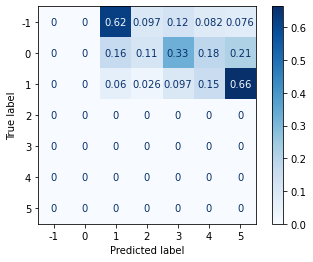

Contradictory Set
Accuracy: 0.2912621359223301

              precision    recall  f1-score   support

           1     0.2143    0.6000    0.3158        10
           2     0.6429    0.2250    0.3333        40
           3     0.4783    0.2821    0.3548        39
           4     0.1053    0.2222    0.1429         9
           5     0.1053    0.4000    0.1667         5

    accuracy                         0.2913       103
   macro avg     0.3092    0.3459    0.2627       103
weighted avg     0.4659    0.2913    0.3150       103



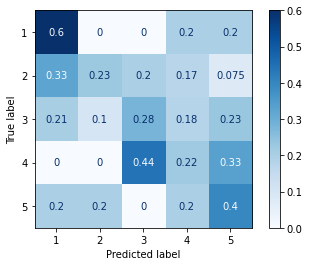

Figurative Set
Accuracy: 0.4074074074074074

              precision    recall  f1-score   support

           1     0.2778    0.8333    0.4167         6
           2     0.5000    0.2353    0.3200        17
           3     0.7500    0.3158    0.4444        19
           4     0.2857    0.3333    0.3077         6
           5     0.3846    0.8333    0.5263         6

    accuracy                         0.4074        54
   macro avg     0.4396    0.5102    0.4030        54
weighted avg     0.5266    0.4074    0.3961        54



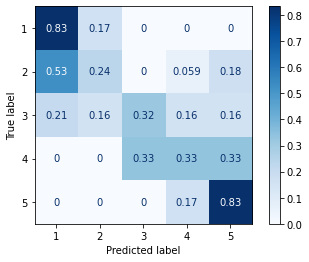

Qualifiers Set
Accuracy: 0.2702702702702703

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.5000    0.2000    0.2857        15
           3     0.6667    0.3333    0.4444        18
           4     0.0000    0.0000    0.0000         1
           5     0.1250    0.5000    0.2000         2

    accuracy                         0.2703        37
   macro avg     0.2583    0.2067    0.1860        37
weighted avg     0.5338    0.2703    0.3429        37



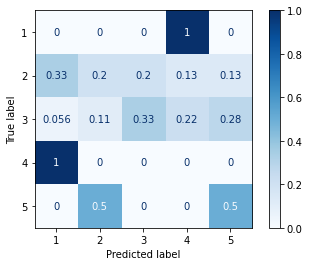

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



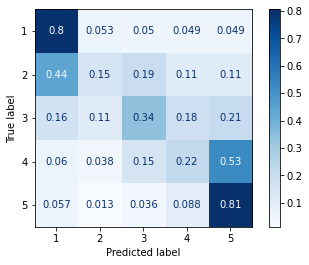

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

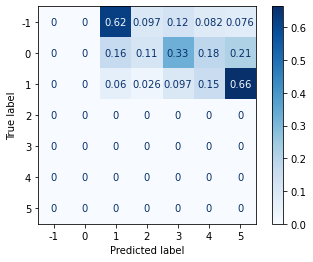

Contradictory Set
Accuracy: 0.2621359223300971

              precision    recall  f1-score   support

           1     0.1875    0.6000    0.2857        10
           2     0.5833    0.1750    0.2692        40
           3     0.4545    0.2564    0.3279        39
           4     0.0769    0.1111    0.0909         9
           5     0.1250    0.6000    0.2069         5

    accuracy                         0.2621       103
   macro avg     0.2855    0.3485    0.2361       103
weighted avg     0.4296    0.2621    0.2744       103



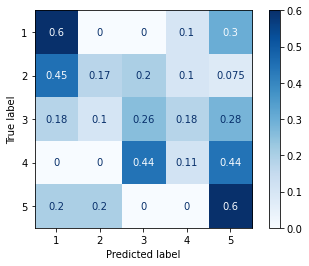

Figurative Set
Accuracy: 0.3148148148148148

              precision    recall  f1-score   support

           1     0.2500    0.8333    0.3846         6
           2     0.6667    0.1176    0.2000        17
           3     0.8000    0.2105    0.3333        19
           4     0.0000    0.0000    0.0000         6
           5     0.3529    1.0000    0.5217         6

    accuracy                         0.3148        54
   macro avg     0.4139    0.4323    0.2879        54
weighted avg     0.5584    0.3148    0.2810        54



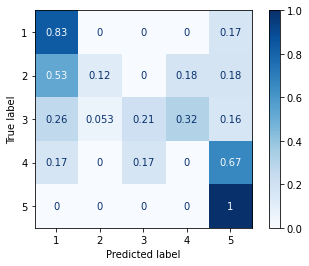

Qualifiers Set
Accuracy: 0.3783783783783784

              precision    recall  f1-score   support

           1     0.1429    1.0000    0.2500         1
           2     0.5714    0.2667    0.3636        15
           3     0.6364    0.3889    0.4828        18
           4     0.1667    1.0000    0.2857         1
           5     0.1667    0.5000    0.2500         2

    accuracy                         0.3784        37
   macro avg     0.3368    0.6311    0.3264        37
weighted avg     0.5586    0.3784    0.4103        37



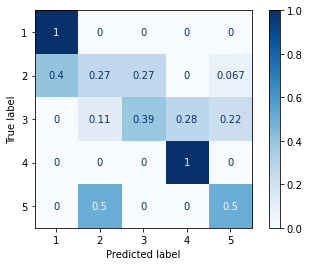

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



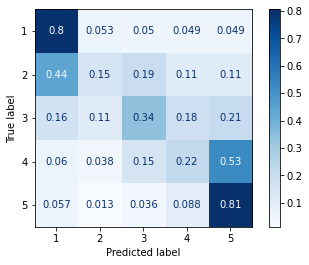

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

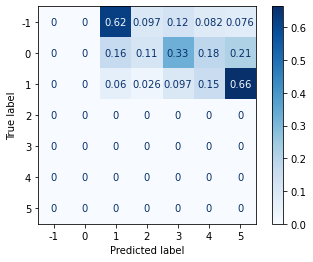

Contradictory Set
Accuracy: 0.23300970873786409

              precision    recall  f1-score   support

           1     0.2083    0.5000    0.2941        10
           2     0.5000    0.1500    0.2308        40
           3     0.3889    0.1795    0.2456        39
           4     0.1429    0.3333    0.2000         9
           5     0.1071    0.6000    0.1818         5

    accuracy                         0.2330       103
   macro avg     0.2694    0.3526    0.2305       103
weighted avg     0.3793    0.2330    0.2375       103



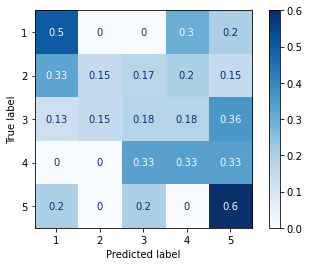

Figurative Set
Accuracy: 0.3888888888888889

              precision    recall  f1-score   support

           1     0.3077    0.6667    0.4211         6
           2     0.5556    0.2941    0.3846        17
           3     0.7500    0.3158    0.4444        19
           4     0.1000    0.1667    0.1250         6
           5     0.3571    0.8333    0.5000         6

    accuracy                         0.3889        54
   macro avg     0.4141    0.4553    0.3750        54
weighted avg     0.5238    0.3889    0.3937        54



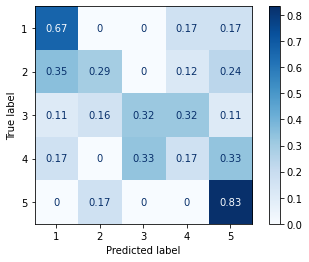

Qualifiers Set
Accuracy: 0.43243243243243246

              precision    recall  f1-score   support

           1     0.1667    1.0000    0.2857         1
           2     0.6000    0.2000    0.3000        15
           3     0.7333    0.6111    0.6667        18
           4     0.0000    0.0000    0.0000         1
           5     0.1250    0.5000    0.2000         2

    accuracy                         0.4324        37
   macro avg     0.3250    0.4622    0.2905        37
weighted avg     0.6113    0.4324    0.4645        37



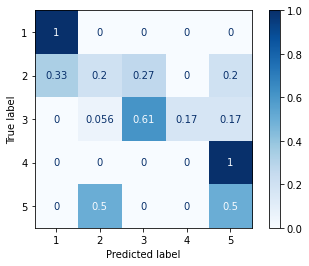

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



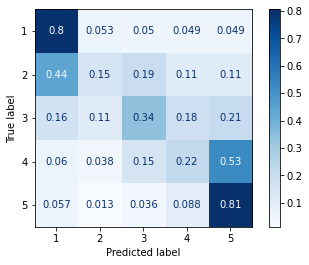

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

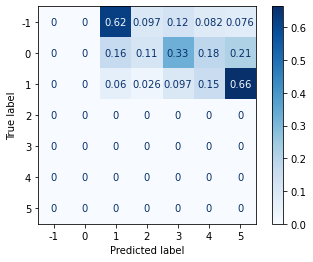

Contradictory Set
Accuracy: 0.30097087378640774

              precision    recall  f1-score   support

           1     0.2069    0.6000    0.3077        10
           2     0.5714    0.2000    0.2963        40
           3     0.4348    0.2564    0.3226        39
           4     0.2143    0.3333    0.2609         9
           5     0.1739    0.8000    0.2857         5

    accuracy                         0.3010       103
   macro avg     0.3203    0.4379    0.2946       103
weighted avg     0.4338    0.3010    0.3037       103



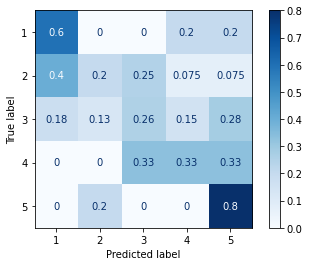

Figurative Set
Accuracy: 0.35185185185185186

              precision    recall  f1-score   support

           1     0.2632    0.8333    0.4000         6
           2     0.4286    0.1765    0.2500        17
           3     0.7143    0.2632    0.3846        19
           4     0.1429    0.1667    0.1538         6
           5     0.3571    0.8333    0.5000         6

    accuracy                         0.3519        54
   macro avg     0.3812    0.4546    0.3377        54
weighted avg     0.4710    0.3519    0.3311        54



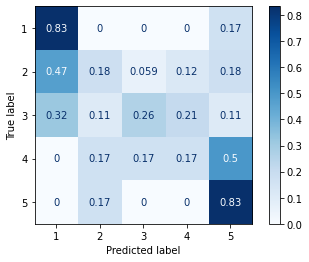

Qualifiers Set
Accuracy: 0.21621621621621623

              precision    recall  f1-score   support

           1     0.0909    1.0000    0.1667         1
           2     0.4286    0.2000    0.2727        15
           3     0.3750    0.1667    0.2308        18
           4     0.2000    1.0000    0.3333         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.2162        37
   macro avg     0.2189    0.4733    0.2007        37
weighted avg     0.3640    0.2162    0.2363        37



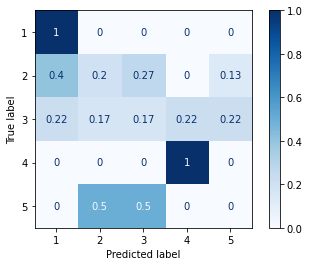

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



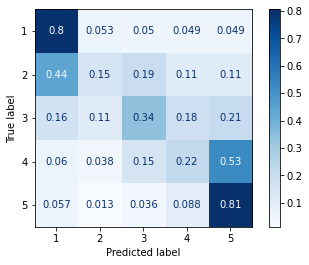

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

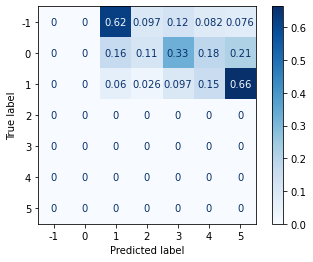

Contradictory Set
Accuracy: 0.2621359223300971

              precision    recall  f1-score   support

           1     0.2000    0.6000    0.3000        10
           2     0.5333    0.2000    0.2909        40
           3     0.4706    0.2051    0.2857        39
           4     0.0667    0.1111    0.0833         9
           5     0.1538    0.8000    0.2581         5

    accuracy                         0.2621       103
   macro avg     0.2849    0.3832    0.2436       103
weighted avg     0.4180    0.2621    0.2701       103



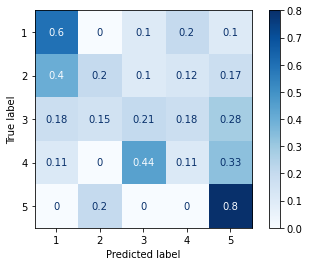

Figurative Set
Accuracy: 0.42592592592592593

              precision    recall  f1-score   support

           1     0.2273    0.8333    0.3571         6
           2     0.6250    0.2941    0.4000        17
           3     0.8571    0.3158    0.4615        19
           4     0.4000    0.3333    0.3636         6
           5     0.4167    0.8333    0.5556         6

    accuracy                         0.4259        54
   macro avg     0.5052    0.5220    0.4276        54
weighted avg     0.6143    0.4259    0.4301        54



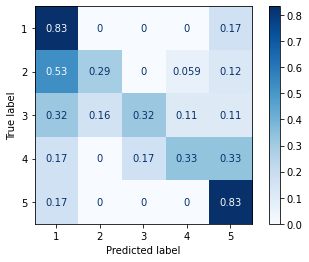

Qualifiers Set
Accuracy: 0.40540540540540543

              precision    recall  f1-score   support

           1     0.1111    1.0000    0.2000         1
           2     0.3750    0.2000    0.2609        15
           3     0.6923    0.5000    0.5806        18
           4     1.0000    1.0000    1.0000         1
           5     0.1667    0.5000    0.2500         2

    accuracy                         0.4054        37
   macro avg     0.4690    0.6400    0.4583        37
weighted avg     0.5279    0.4054    0.4342        37



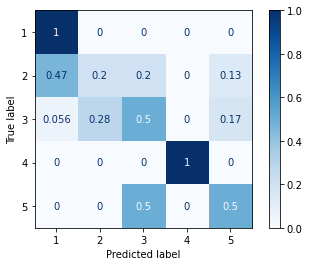

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



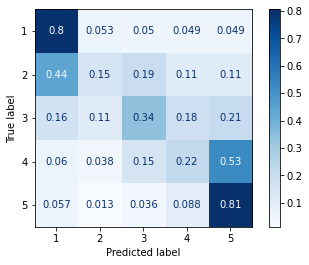

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

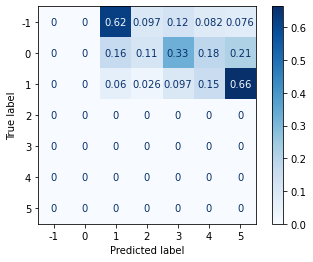

Contradictory Set
Accuracy: 0.3592233009708738

              precision    recall  f1-score   support

           1     0.2143    0.6000    0.3158        10
           2     0.6667    0.2000    0.3077        40
           3     0.5714    0.4103    0.4776        39
           4     0.2857    0.4444    0.3478         9
           5     0.1429    0.6000    0.2308         5

    accuracy                         0.3592       103
   macro avg     0.3762    0.4509    0.3359       103
weighted avg     0.5280    0.3592    0.3726       103



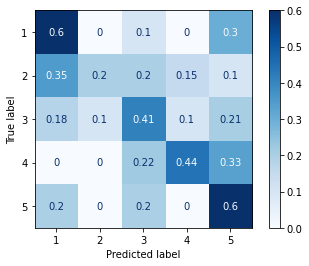

Figurative Set
Accuracy: 0.37037037037037035

              precision    recall  f1-score   support

           1     0.3333    0.8333    0.4762         6
           2     0.6250    0.2941    0.4000        17
           3     0.5000    0.2632    0.3448        19
           4     0.0000    0.0000    0.0000         6
           5     0.3333    0.8333    0.4762         6

    accuracy                         0.3704        54
   macro avg     0.3583    0.4448    0.3394        54
weighted avg     0.4468    0.3704    0.3531        54



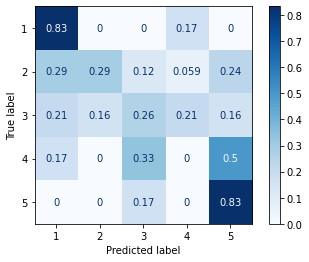

Qualifiers Set
Accuracy: 0.40540540540540543

              precision    recall  f1-score   support

           1     0.1667    1.0000    0.2857         1
           2     0.5000    0.3333    0.4000        15
           3     0.6667    0.4444    0.5333        18
           4     0.2500    1.0000    0.4000         1
           5     0.0000    0.0000    0.0000         2

    accuracy                         0.4054        37
   macro avg     0.3167    0.5556    0.3238        37
weighted avg     0.5383    0.4054    0.4402        37



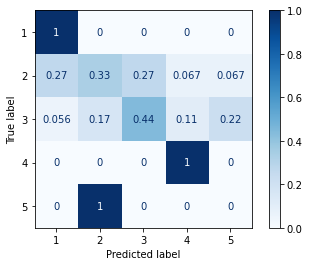

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



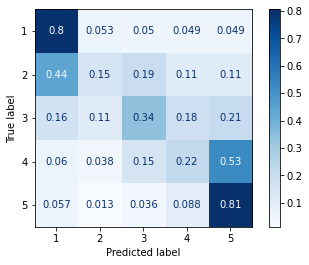

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

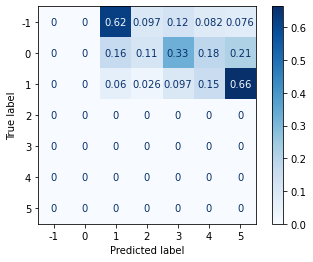

Contradictory Set
Accuracy: 0.27184466019417475

              precision    recall  f1-score   support

           1     0.1724    0.5000    0.2564        10
           2     0.5000    0.1500    0.2308        40
           3     0.4815    0.3333    0.3939        39
           4     0.1111    0.1111    0.1111         9
           5     0.1154    0.6000    0.1935         5

    accuracy                         0.2718       103
   macro avg     0.2761    0.3389    0.2372       103
weighted avg     0.4085    0.2718    0.2828       103



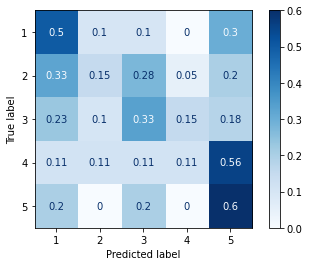

Figurative Set
Accuracy: 0.3148148148148148

              precision    recall  f1-score   support

           1     0.2105    0.6667    0.3200         6
           2     0.5000    0.1765    0.2609        17
           3     0.7143    0.2632    0.3846        19
           4     0.0000    0.0000    0.0000         6
           5     0.3125    0.8333    0.4545         6

    accuracy                         0.3148        54
   macro avg     0.3475    0.3879    0.2840        54
weighted avg     0.4668    0.3148    0.3035        54



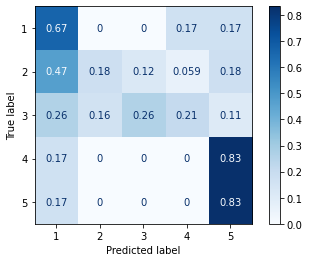

Qualifiers Set
Accuracy: 0.3783783783783784

              precision    recall  f1-score   support

           1     0.1667    1.0000    0.2857         1
           2     0.5714    0.2667    0.3636        15
           3     0.6364    0.3889    0.4828        18
           4     0.0000    0.0000    0.0000         1
           5     0.2222    1.0000    0.3636         2

    accuracy                         0.3784        37
   macro avg     0.3193    0.5311    0.2991        37
weighted avg     0.5578    0.3784    0.4097        37



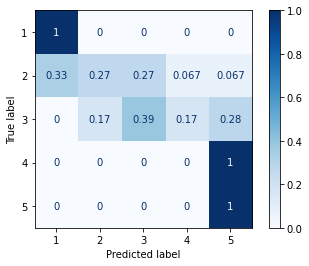

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



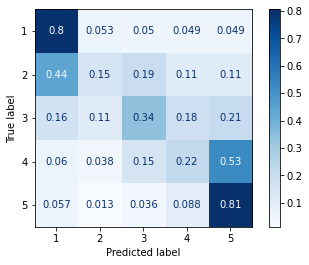

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

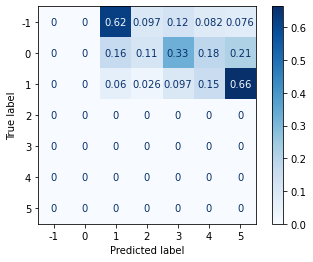

Contradictory Set
Accuracy: 0.22330097087378642

              precision    recall  f1-score   support

           1     0.1515    0.5000    0.2326        10
           2     0.4167    0.1250    0.1923        40
           3     0.5000    0.2051    0.2909        39
           4     0.1176    0.2222    0.1538         9
           5     0.1200    0.6000    0.2000         5

    accuracy                         0.2233       103
   macro avg     0.2612    0.3305    0.2139       103
weighted avg     0.3819    0.2233    0.2306       103



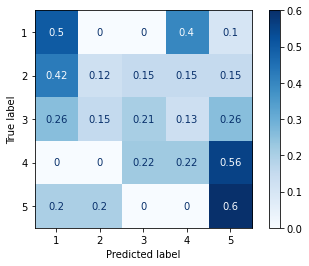

Figurative Set
Accuracy: 0.42592592592592593

              precision    recall  f1-score   support

           1     0.2500    0.8333    0.3846         6
           2     0.6667    0.2353    0.3478        17
           3     0.7778    0.3684    0.5000        19
           4     0.1667    0.1667    0.1667         6
           5     0.4615    1.0000    0.6316         6

    accuracy                         0.4259        54
   macro avg     0.4645    0.5207    0.4061        54
weighted avg     0.5811    0.4259    0.4169        54



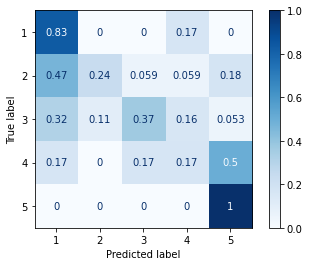

Qualifiers Set
Accuracy: 0.24324324324324326

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.3333    0.1333    0.1905        15
           3     0.6667    0.3333    0.4444        18
           4     0.0000    0.0000    0.0000         1
           5     0.1250    0.5000    0.2000         2

    accuracy                         0.2432        37
   macro avg     0.2250    0.1933    0.1670        37
weighted avg     0.4662    0.2432    0.3042        37



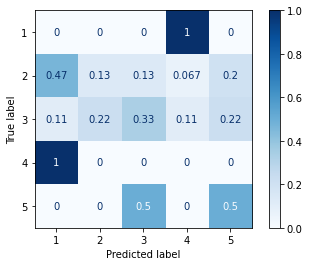

Training Set
Accuracy: 0.44164761904761907

              precision    recall  f1-score   support

           1     0.4723    0.7992    0.5938     17439
           2     0.3198    0.1492    0.2035     17523
           3     0.6119    0.3398    0.4369     35084
           4     0.2667    0.2201    0.2412     17536
           5     0.4208    0.8060    0.5530     17418

    accuracy                         0.4416    105000
   macro avg     0.4183    0.4629    0.4057    105000
weighted avg     0.4506    0.4416    0.4106    105000



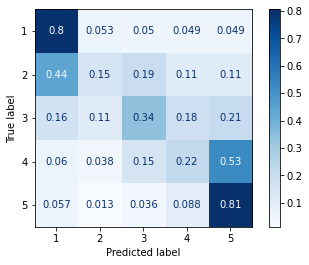

Testing Set
Accuracy: 0.02022222222222222

              precision    recall  f1-score   support

          -1     0.0000    0.0000    0.0000     15038
           0     0.0000    0.0000    0.0000     14916
           1     0.0715    0.0605    0.0655     15046
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.0000    0.0000    0.0000         0
           5     0.0000    0.0000    0.0000         0

    accuracy                         0.0202     45000
   macro avg     0.0102    0.0086    0.0094     45000
weighted avg     0.0239    0.0202    0.0219     45000



/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/justaronee/anaconda3/envs/InnovationIndexNumba/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

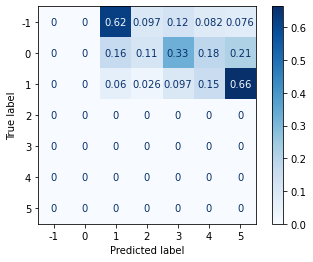

Contradictory Set
Accuracy: 0.3106796116504854

              precision    recall  f1-score   support

           1     0.2500    0.8000    0.3810        10
           2     0.6667    0.1500    0.2449        40
           3     0.6000    0.3077    0.4068        39
           4     0.1111    0.2222    0.1481         9
           5     0.1667    0.8000    0.2759         5

    accuracy                         0.3107       103
   macro avg     0.3589    0.4560    0.2913       103
weighted avg     0.5282    0.3107    0.3125       103



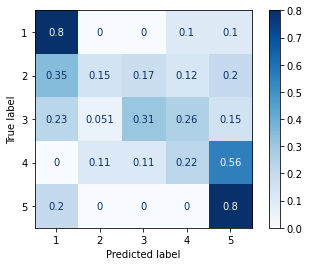

Figurative Set
Accuracy: 0.37037037037037035

              precision    recall  f1-score   support

           1     0.2667    0.6667    0.3810         6
           2     0.7500    0.1765    0.2857        17
           3     0.7500    0.3158    0.4444        19
           4     0.0909    0.1667    0.1176         6
           5     0.3750    1.0000    0.5455         6

    accuracy                         0.3704        54
   macro avg     0.4465    0.4651    0.3548        54
weighted avg     0.5814    0.3704    0.3623        54



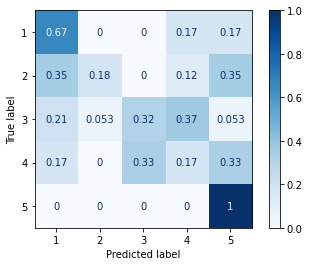

Qualifiers Set
Accuracy: 0.35135135135135137

              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000         1
           2     0.5000    0.2000    0.2857        15
           3     0.6364    0.3889    0.4828        18
           4     0.2000    1.0000    0.3333         1
           5     0.2500    1.0000    0.4000         2

    accuracy                         0.3514        37
   macro avg     0.3173    0.5178    0.3004        37
weighted avg     0.5312    0.3514    0.3813        37



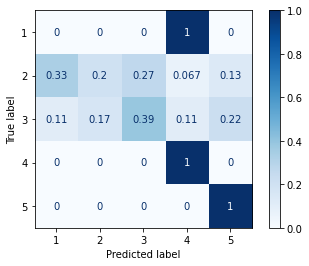

In [238]:
edges = pd.read_csv("example_sentences.csv")

sgd_list = []*30
for i in range(30):
    test = edges.copy(deep = True)
    x_contra, x_figurative, x_qual, y_contra, y_figurative, y_qual = extract_features_word_removal_sent_tokenize(test)   
    sgd_list.append(evaluate_model(sgd, model_name="sgd"))

In [239]:
edge = np.array(sgd_list)[:,2:]
print(stats.describe(edge[:,0]), stats.describe(edge[:,1]), stats.describe(edge[:,2]), sep="\n\n")

DescribeResult(nobs=30, minmax=(0.1941747572815534, 0.3592233009708738), mean=0.2741100323624596, variance=0.001402084328747116, skewness=0.2926307135907224, kurtosis=0.227248653144152)

DescribeResult(nobs=30, minmax=(0.2962962962962963, 0.42592592592592593), mean=0.3709876543209876, variance=0.0013595225706762527, skewness=-0.28658104996318706, kurtosis=-0.8418495206757517)

DescribeResult(nobs=30, minmax=(0.21621621621621623, 0.4594594594594595), mean=0.3387387387387388, variance=0.004671586777830954, skewness=-0.09822877416229685, kurtosis=-1.0990009204700448)
